## Project Proposal Title: Volatility Modeling with Deep Learning

Group: 
- Autumn Dorsey 
- Loralee Ryan
- Max Wienandts
- Ronan Fonseca

Problem Statement:
- Is it possible to make a prediction model to forecast security volatility for the next 4 weeks?

|SUMMARY|
|:------------------------------------------------|
|[**1.Motivation**](#motivation)|
|[**2. Get data**](#get_data)|
|[**3. Verify integrity of a time series data set**](#Verify_integrity_of_a_time_series_data_set)|
|[**4. Save the data**](#Save_the_data)|
|[**5. Load the data**](#Load_the_data)|
|[**6. Exploratory data analysis**](#Exploratory_data_analysis)|
|[**7. Modeling**](#Modeling)|
|[7.1. Base model](#Base_model)|
|[7.2. Model 1: Adding more layers](#Model_1_Adding_more_layers)|
|[7.3. Model 2: Transformers](#Model_2_Transformers)|
|[7.4. Model 3: adding prices and returns (final pipeline)](#Model_3_adding_prices_and_returns)|
|[**8. Model 3: hyper parametrization**](#hyper_parametrization)|
|[**9. Model 3: model performance**](#model_performance)|
|[**10. Results, conclusions, and future work**](#Conclusion)|

<div id='motivation' />

## Motivation

Volatility, the measurement of the magnitude of price fluctuations over time, is conceptually the "second derivative of price" but is often easier to model than price data itself. The interactions that lead to the price of a security are multifaceted, multifactorial, nonlinear and often discontinuous. A shock to the market can cause the price of one security to fall while causing the price of another to spike at the same time. Modeling this is hard - but modeling that a shock to the market will cause a volatility jump in both securities is considerably easier, because volatility ignores the direction of the movement. 

Volatility is also a tradeable asset itself, thanks to the creation of financial instruments that track it. 

Unlike other types of financial models, volatility models can be adapted to account for both long term (multi-year patterns) or short term (the movement a security even over a couple of minutes). They are also designed to capture extreme events, unlike many price models which tend to lose accuracy during a shock to the market (such as Covid-19!).

Financial markets have many hidden and complex patterns in the data. We have learned about many different methods for revealing complex interactions. Financial data is abundant, popular, and notoriously difficult to work with. We are curious to see what some of the models we have learned about will reveal when applied to this famously difficult arena. 

In [ ]:
import numpy as np
import pandas as pd
import datetime
import time

import matplotlib.pyplot as plt
import seaborn as sns

import yfinance as yf
import tqdm

from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow import keras



**Description of Non-Standard Required Libraries**



1.   *yfinance*: an unofficial libary to conveniently and efficently accesss financial data from Yahoo Finance. Yahoo Finance is one of the best repositories of free historical stock data.  
2.   *tqdm*: a library which can generate progress bars



In [ ]:
print(f"tensorflow version {tf.__version__}")
print(f"keras version {tf.keras.__version__}")
print(f"Eager Execution Enabled: {tf.executing_eagerly()}\n")

devices = tf.config.get_visible_devices()
print(f"All Devices: \n{devices}\n")
print(f"Available GPUs: \n{tf.config.list_logical_devices('GPU')}\n")

AUTOTUNE = tf.data.AUTOTUNE

tf.random.set_seed(1)

tensorflow version 2.11.0
keras version 2.11.0
Eager Execution Enabled: True

All Devices: 
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

Available GPUs: 
[]



<div id='get_data' />

## Get data

The data was collected from Yahoo Finance, using the yfinance Python API. For this project, we chose the 10 most active stocks on 03/28/2023 (https://www.investing.com/equities/most-active-stocks). \
The stocks are: 
- TSLA (Tesla)
- NVDA (NVIDIA)
- AAPL (Apple)
- MSFT (Microsoft)
- AMD (AMD)
- META (Meta)
- AMZN (Amazon)
- GOOGL (Google)
- BAC (Bank of America Corp)
- NFLX (Netflix).

We collected the closing stock prices from 01/05/2013 to 04/06/2023. In total, for each stock, there are 2574 observations. For all business days, there is a closing price. The data does not have missing values. \
To work with the data, we first calculated the daily return for each stock. Afterward, we calculated the volatility by aggregating the daily returns from Monday to Friday using the standard deviations as a summary metric. This resulted in a table with 535 rows and 10 columns. 

Attention: If you already have the files df_return.csv and df_volatility, you can go to the fourth step [**4. Load the data**](#Load_the_data)

In [ ]:
# Get historical prices from Yahoo Finance using the API yfinance.
tickers = yf.Tickers('tsla nvda aapl msft amd meta amzn nflx googl bac')

dict_df_stocks = {}
dict_df_stocks['TSLA'] = tickers.tickers['TSLA'].history(period="max").reset_index()
dict_df_stocks['NVDA'] = tickers.tickers['NVDA'].history(period="max").reset_index()
dict_df_stocks['AAPL'] = tickers.tickers['AAPL'].history(period="max").reset_index()
dict_df_stocks['MSFT'] = tickers.tickers['MSFT'].history(period="max").reset_index()
dict_df_stocks['AMD'] = tickers.tickers['AMD'].history(period="max").reset_index()
dict_df_stocks['META'] = tickers.tickers['META'].history(period="max").reset_index()
dict_df_stocks['AMZN'] = tickers.tickers['AMZN'].history(period="max").reset_index()
dict_df_stocks['GOOGL'] = tickers.tickers['GOOGL'].history(period="max").reset_index()
dict_df_stocks['BAC'] = tickers.tickers['BAC'].history(period="max").reset_index()
dict_df_stocks['NFLX'] = tickers.tickers['NFLX'].history(period="max").reset_index()

In [ ]:
# show first and last date
vec_tickers = ['TSLA', 'NVDA', 'AAPL', 'MSFT', 'AMD', 'META', 'AMZN', 'NFLX', 'GOOGL', 'BAC']
vec_first_observations = [dict_df_stocks['TSLA'].Date.min(), dict_df_stocks['NVDA'].Date.min()
                          , dict_df_stocks['AAPL'].Date.min(), dict_df_stocks['MSFT'].Date.min()
                          , dict_df_stocks['AMD'].Date.min(), dict_df_stocks['META'].Date.min()
                          , dict_df_stocks['AMZN'].Date.min(), dict_df_stocks['NFLX'].Date.min()
                          , dict_df_stocks['GOOGL'].Date.min(), dict_df_stocks['BAC'].Date.min()]
vec_last_observations = [dict_df_stocks['TSLA'].Date.max(), dict_df_stocks['NVDA'].Date.max()
                          , dict_df_stocks['AAPL'].Date.max(), dict_df_stocks['MSFT'].Date.max()
                          , dict_df_stocks['AMD'].Date.max(), dict_df_stocks['META'].Date.max()
                          , dict_df_stocks['AMZN'].Date.max(), dict_df_stocks['NFLX'].Date.max()
                          , dict_df_stocks['GOOGL'].Date.max(), dict_df_stocks['BAC'].Date.max()]

df_ticker_first_last_dates = pd.DataFrame(list(zip(vec_tickers, vec_first_observations, vec_last_observations))
                                          , columns = ['ticker', 'first_observation', 'last_observation'])
df_ticker_first_last_dates

,ticker,first_observation,last_observation
0,TSLA,2010-06-29 00:00:00-04:00,2023-05-05 00:00:00-04:00
1,NVDA,1999-01-22 00:00:00-05:00,2023-05-05 00:00:00-04:00
2,AAPL,1980-12-12 00:00:00-05:00,2023-05-05 00:00:00-04:00
3,MSFT,1986-03-13 00:00:00-05:00,2023-05-05 00:00:00-04:00
4,AMD,1980-03-17 00:00:00-05:00,2023-05-05 00:00:00-04:00
5,META,2012-05-18 00:00:00-04:00,2023-05-05 00:00:00-04:00
6,AMZN,1997-05-15 00:00:00-04:00,2023-05-05 00:00:00-04:00
7,NFLX,2002-05-23 00:00:00-04:00,2023-05-05 00:00:00-04:00
8,GOOGL,2004-08-19 00:00:00-04:00,2023-05-05 00:00:00-04:00
9,BAC,1973-02-21 00:00:00-05:00,2023-05-05 00:00:00-04:00


We will model the weekly volatility. So, first, we need to identify the key of our data set. \
The key for each security data set will be the column First_day_week. \
We will also create the auxiliary columns year and week_of_year that will be used to verify the integrity of our data set.

In [ ]:
for key in dict_df_stocks:
    # Get only the close price after 20012-05-18 (Meta oldest information).
    dict_df_stocks[key] = dict_df_stocks[key][(dict_df_stocks[key].Date >= '2013-01-05') & (dict_df_stocks[key].Date <= '2023-04-06')][['Date', 'Close']]
    # Calculate first day of week
    dict_df_stocks[key]['First_day_week'] =  dict_df_stocks[key]['Date'] -  dict_df_stocks[key]['Date'].dt.weekday * np.timedelta64(1, 'D')
    # Add year and week of the year columns. It will be used to verify if there are missing data.
    dict_df_stocks[key]['year'] = dict_df_stocks[key]['First_day_week'].dt.year
    dict_df_stocks[key]['week_of_year'] = dict_df_stocks[key]['Date'].dt.isocalendar().week
    
    
display(dict_df_stocks['TSLA'])

,Date,Close,First_day_week,year,week_of_year
635,2013-01-07 00:00:00-05:00,2.289333,2013-01-07 00:00:00-05:00,2013,2
636,2013-01-08 00:00:00-05:00,2.245333,2013-01-07 00:00:00-05:00,2013,2
637,2013-01-09 00:00:00-05:00,2.242667,2013-01-07 00:00:00-05:00,2013,2
638,2013-01-10 00:00:00-05:00,2.235333,2013-01-07 00:00:00-05:00,2013,2
639,2013-01-11 00:00:00-05:00,2.194000,2013-01-07 00:00:00-05:00,2013,2
...,...,...,...,...,...
3211,2023-03-31 00:00:00-04:00,207.460007,2023-03-27 00:00:00-04:00,2023,13
3212,2023-04-03 00:00:00-04:00,194.770004,2023-04-03 00:00:00-04:00,2023,14
3213,2023-04-04 00:00:00-04:00,192.580002,2023-04-03 00:00:00-04:00,2023,14
3214,2023-04-05 00:00:00-04:00,185.520004,2023-04-03 00:00:00-04:00,2023,14


In [ ]:
'''
We will calculate the volatility of the daily returns and not the volatility of the price.
'''

# Calculate the daily return
for key in dict_df_stocks:
    dict_df_stocks[key]['Close_1'] = dict_df_stocks[key]['Close'].shift(1)
    dict_df_stocks[key]['return'] = (dict_df_stocks[key]['Close'] - dict_df_stocks[key]['Close_1']) / dict_df_stocks[key]['Close_1']
    dict_df_stocks[key].dropna(inplace = True)
    
display(dict_df_stocks['TSLA'])

,Date,Close,First_day_week,year,week_of_year,Close_1,return
636,2013-01-08 00:00:00-05:00,2.245333,2013-01-07 00:00:00-05:00,2013,2,2.289333,-0.019220
637,2013-01-09 00:00:00-05:00,2.242667,2013-01-07 00:00:00-05:00,2013,2,2.245333,-0.001187
638,2013-01-10 00:00:00-05:00,2.235333,2013-01-07 00:00:00-05:00,2013,2,2.242667,-0.003270
639,2013-01-11 00:00:00-05:00,2.194000,2013-01-07 00:00:00-05:00,2013,2,2.235333,-0.018491
640,2013-01-14 00:00:00-05:00,2.217333,2013-01-14 00:00:00-05:00,2013,3,2.194000,0.010635
...,...,...,...,...,...,...,...
3211,2023-03-31 00:00:00-04:00,207.460007,2023-03-27 00:00:00-04:00,2023,13,195.279999,0.062372
3212,2023-04-03 00:00:00-04:00,194.770004,2023-04-03 00:00:00-04:00,2023,14,207.460007,-0.061168
3213,2023-04-04 00:00:00-04:00,192.580002,2023-04-03 00:00:00-04:00,2023,14,194.770004,-0.011244
3214,2023-04-05 00:00:00-04:00,185.520004,2023-04-03 00:00:00-04:00,2023,14,192.580002,-0.036660


In [ ]:
# Get the weekly voltility
dict_df_stocks_volatility = dict_df_stocks.copy()
for key in dict_df_stocks_volatility:
    dict_df_stocks_volatility[key] =  dict_df_stocks_volatility[key].groupby(['year', 'week_of_year', 'First_day_week'])['return'].std().reset_index()
    dict_df_stocks_volatility[key].sort_values('First_day_week', inplace = True)

display(dict_df_stocks_volatility['TSLA'])

,year,week_of_year,First_day_week,return
1,2013,2,2013-01-07 00:00:00-05:00,0.009641
2,2013,3,2013-01-14 00:00:00-05:00,0.005921
3,2013,4,2013-01-21 00:00:00-05:00,0.012245
4,2013,5,2013-01-28 00:00:00-05:00,0.016785
5,2013,6,2013-02-04 00:00:00-05:00,0.016131
...,...,...,...,...
530,2023,10,2023-03-06 00:00:00-05:00,0.019339
531,2023,11,2023-03-13 00:00:00-04:00,0.029054
532,2023,12,2023-03-20 00:00:00-04:00,0.041516
533,2023,13,2023-03-27 00:00:00-04:00,0.028487


<div id='Verify_integrity_of_a_time_series_data_set' />

## Verify integrity of a time series data set

In time series problems, we need to ensure that our data set satisfies at least two conditions:
- Each row is related to a date and there are no two rows related to the same date;
- Our data set follows a constant periodicity.

Fortunately, there isn't any problem with our data set.

In [ ]:
# Verify if a date has more than one observation
def verify_time_series(df, vec_problem_df, key):
    df_aux = df.copy()
    df_duplicates = pd.DataFrame(df_aux.First_day_week.value_counts().sort_index() > 1)
    df_duplicates = df_duplicates[np.in1d(df_duplicates.First_day_week, True)]
    print(f"First observation: {df_aux.First_day_week.min()}, last: {df_aux.First_day_week.max()}, Observations: {len(df_aux)}. Duplicated dates: {len(df_duplicates)}")
    if len(df_duplicates) > 0:
        print('Key:\n', key)
        display(df_duplicates)
        # Save keys with problems
        vec_problem_df.append(key)

    return vec_problem_df

vec_problem_df = []
for key in dict_df_stocks_volatility:
    print(key)
    vec_problem_df = verify_time_series(dict_df_stocks_volatility[key], vec_problem_df, key)

TSLA
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
NVDA
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
AAPL
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
MSFT
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
AMD
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
META
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
AMZN
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
GOOGL
First observation: 2013-01-07 00:00:00-05:00, last: 2023-04-03 00:00:00-04:00, Observations: 535. Duplicated dates: 0
BAC
First observ

In [ ]:
# Verify if there isn't any missing weeks.
def verify_time_series_duplicity(df, key):
    df_aux = df.copy()

    df_aux['year'] = df_aux.apply(lambda row: row.First_day_week.year, axis = 1)
    date_first = df_aux.First_day_week.min()
    year_first = df_aux['year'].min()
    week_first = df_aux[np.in1d(df_aux['year'], year_first)].week_of_year.min()

    date_first = df_aux.First_day_week.max()
    year_last = df_aux['year'].max()
    week_last = df_aux[np.in1d(df_aux['year'], year_last)].week_of_year.max()

    for year in range(year_first, year_last + 1):
        if year == year_first:
            for week in range(week_first, 53):
                if week not in df_aux[np.in1d(df_aux['year'], year)].week_of_year.values:
                    print(key)
                    print(f'Missing YEAR: {year}, WEEK: {week}')
                    print()
        elif year == year_last:
            for week in range(2, week_last):
                if week not in df_aux[np.in1d(df_aux['year'], year)].week_of_year.values:
                    print(key)
                    print(f'Missing YEAR: {year}, WEEK: {week}')
                    print()
        else:
            for week in range(2, 53): # The first week is not missing. Data from the first week of the year, somentimes, goes to the last week of the previous year.
                if week not in df_aux[np.in1d(df_aux['year'], year)].week_of_year.values:
                    print(key)
                    print(f'Missing YEAR: {year}, WEEK: {week}')
                    print()
    return


for key in dict_df_stocks_volatility:
    print(key)
    verify_time_series_duplicity(dict_df_stocks_volatility[key], key)

TSLA
NVDA
AAPL
MSFT
AMD
META
AMZN
GOOGL
BAC
NFLX


<div id='Save_the_data' />

## Save the data

To guarantee that this notebook is reproducible, we will save the data used in our studies. \
First, we will merge all data frames into only one data set. \
After, we will save the data set using the csv format.

In [ ]:
# Merge all the data in one dataframe.
# For the return data set
flag = 0
for key in dict_df_stocks:
    df_aux = dict_df_stocks[key].copy()
    df_aux = df_aux[['Date', 'Close', 'return']]
    df_aux.columns = ['date', 'close_' + key, 'return_' + key]
    if flag == 0:
        df_return = df_aux
        flag = 1
    else:
        df_return = df_return.merge(df_aux, how = 'left', on = ['date'])

df_return.sort_values('date', inplace = True)
df_return.index = df_return.date
df_return.drop('date', axis = 1, inplace = True)
df_return.head(3)

,close_TSLA,return_TSLA,close_NVDA,return_NVDA,close_AAPL,return_AAPL,close_MSFT,return_MSFT,close_AMD,return_AMD,close_META,return_META,close_AMZN,return_AMZN,close_GOOGL,return_GOOGL,close_BAC,return_BAC,close_NFLX,return_NFLX
date,,,,,,,,,,,,,,,,,,,,
2013-01-08 00:00:00-05:00,2.245333,-0.019220,2.883680,-0.021927,16.109694,0.002691,21.837700,-0.005245,2.67,0.000000,29.059999,-0.012237,13.3190,-0.007748,18.350851,-0.001973,10.114059,-0.009099,13.880000,-0.020565
2013-01-09 00:00:00-05:00,2.242667,-0.001187,2.819034,-0.022418,15.857919,-0.015629,21.961075,0.005650,2.63,-0.014981,30.590000,0.052650,13.3175,-0.000113,18.471472,0.006573,9.649725,-0.045910,13.701429,-0.012865
2013-01-10 00:00:00-05:00,2.235333,-0.003270,2.823651,0.001638,16.054495,0.012396,21.763668,-0.008989,2.62,-0.003802,31.299999,0.023210,13.2670,-0.003792,18.555555,0.004552,9.945211,0.030621,14.000000,0.021791


In [ ]:
# For the volatility data set
flag = 0
for key in dict_df_stocks_volatility:
    dict_df_stocks_volatility[key].columns = ['year', 'week_of_year', 'First_day_week', key]
    if flag == 0:
        df = dict_df_stocks_volatility[key][['First_day_week', key]]
        flag = 1
    else:
        df = df.merge(dict_df_stocks_volatility[key][['First_day_week', key]], how = 'left', on = ['First_day_week'])

df.sort_values('First_day_week', inplace = True)
df.index = df.First_day_week
df.drop('First_day_week', axis = 1, inplace = True)
df.head(3)

,TSLA,NVDA,AAPL,MSFT,AMD,META,AMZN,GOOGL,BAC,NFLX
First_day_week,,,,,,,,,,
2013-01-07 00:00:00-05:00,0.009641,0.012873,0.011995,0.010464,0.014178,0.026812,0.007518,0.004439,0.031336,0.026268
2013-01-14 00:00:00-05:00,0.005921,0.012512,0.030733,0.007017,0.049800,0.014854,0.010824,0.009272,0.023674,0.025551
2013-01-21 00:00:00-05:00,0.012245,0.009662,0.065041,0.009131,0.052016,0.014512,0.022463,0.026634,0.005671,0.191255


In [ ]:
# Save as csv
df_return.to_csv('df_return.csv', index = True)
df.to_csv('df_volatility.csv', index = True)

<div id='Load_the_data' />

## Load the data

In [ ]:
# Read csv
df_return = pd.read_csv('df_return.csv')
df_return.date = pd.to_datetime(df_return.date)
df_return.index = df_return.date
df_return.drop('date', axis = 1, inplace = True)

df = pd.read_csv('df_volatility.csv')
df.First_day_week = pd.to_datetime(df.First_day_week)
df.index = df.First_day_week
df.drop('First_day_week', axis = 1, inplace = True)

print(f'Return, observations: {len(df_return)}, columns: {len(df_return.columns)}, data set:')
display(df_return.head(3))
print()
print(f'Volatility, observations: {len(df)}, columns: {len(df.columns)}, data set:')
display(df.head(3))

Return, observations: 2580, columns: 20, data set:


,close_TSLA,return_TSLA,close_NVDA,return_NVDA,close_AAPL,return_AAPL,close_MSFT,return_MSFT,close_AMD,return_AMD,close_META,return_META,close_AMZN,return_AMZN,close_GOOGL,return_GOOGL,close_BAC,return_BAC,close_NFLX,return_NFLX
date,,,,,,,,,,,,,,,,,,,,
2013-01-08 00:00:00-05:00,2.245333,-0.019220,2.883680,-0.021927,16.109694,0.002691,21.837700,-0.005245,2.67,0.000000,29.059999,-0.012237,13.3190,-0.007748,18.350851,-0.001973,10.114059,-0.009099,13.880000,-0.020565
2013-01-09 00:00:00-05:00,2.242667,-0.001187,2.819034,-0.022418,15.857919,-0.015629,21.961075,0.005650,2.63,-0.014981,30.590000,0.052650,13.3175,-0.000113,18.471472,0.006573,9.649725,-0.045910,13.701429,-0.012865
2013-01-10 00:00:00-05:00,2.235333,-0.003270,2.823651,0.001638,16.054495,0.012396,21.763668,-0.008989,2.62,-0.003802,31.299999,0.023210,13.2670,-0.003792,18.555555,0.004552,9.945211,0.030621,14.000000,0.021791



Volatility, observations: 535, columns: 10, data set:


,TSLA,NVDA,AAPL,MSFT,AMD,META,AMZN,GOOGL,BAC,NFLX
First_day_week,,,,,,,,,,
2013-01-07 00:00:00-05:00,0.009641,0.012873,0.011995,0.010464,0.014178,0.026812,0.007518,0.004439,0.031336,0.026268
2013-01-14 00:00:00-05:00,0.005921,0.012512,0.030733,0.007017,0.049800,0.014854,0.010824,0.009272,0.023674,0.025551
2013-01-21 00:00:00-05:00,0.012245,0.009662,0.065041,0.009131,0.052016,0.014512,0.022463,0.026634,0.005671,0.191255


<div id='Exploratory_data_analysis' />

## Exploratory data analysis

First, we will verify if we loaded all of our data correctly by verifying if there aren’t any missing values. \
After that, we will check if the data types are all floats. \
Following, we will study some descriptive statistics. \
Finally, we will plot our data, the volatility histogram, and its correlation. 

### Verify missing values

There are no missing values in our data.

In [ ]:
print("Missing values for the return's dataset:")
print(df_return.isna().sum())
print('------------------------------------------------')
print()
print("Missing values for the volatility's dataset:")
print(df.isna().sum())

Missing values for the return's dataset:
close_TSLA      0
return_TSLA     0
close_NVDA      0
return_NVDA     0
close_AAPL      0
return_AAPL     0
close_MSFT      0
return_MSFT     0
close_AMD       0
return_AMD      0
close_META      0
return_META     0
close_AMZN      0
return_AMZN     0
close_GOOGL     0
return_GOOGL    0
close_BAC       0
return_BAC      0
close_NFLX      0
return_NFLX     0
dtype: int64
------------------------------------------------

Missing values for the volatility's dataset:
TSLA     0
NVDA     0
AAPL     0
MSFT     0
AMD      0
META     0
AMZN     0
GOOGL    0
BAC      0
NFLX     0
dtype: int64


### Verify data type

All columns are float64, as expected.

In [ ]:
print("Data types for the return's dataset:")
print(df_return.info())
print('------------------------------------------------')
print()
print("Data types for the volatility's dataset:")
print(df.info())

Data types for the return's dataset:
<class 'pandas.core.frame.DataFrame'>
Index: 2580 entries, 2013-01-08 00:00:00-05:00 to 2023-04-06 00:00:00-04:00
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   close_TSLA    2580 non-null   float64
 1   return_TSLA   2580 non-null   float64
 2   close_NVDA    2580 non-null   float64
 3   return_NVDA   2580 non-null   float64
 4   close_AAPL    2580 non-null   float64
 5   return_AAPL   2580 non-null   float64
 6   close_MSFT    2580 non-null   float64
 7   return_MSFT   2580 non-null   float64
 8   close_AMD     2580 non-null   float64
 9   return_AMD    2580 non-null   float64
 10  close_META    2580 non-null   float64
 11  return_META   2580 non-null   float64
 12  close_AMZN    2580 non-null   float64
 13  return_AMZN   2580 non-null   float64
 14  close_GOOGL   2580 non-null   float64
 15  return_GOOGL  2580 non-null   float64
 16  close_BAC     2580 non-null   float64

### Descriptive statistics

The descriptive statistics show that the mean of the volatilities ranges from 0.014 to 0.031. \
Moreover, the minimum value for volatility is 0.0007 and the maximum is 0.2394. \
Considering that we will do only one neural network with an output layer with 10 columns to predict future volatility, it would be ideal to
normalize the data before fitting the model. \
However, this approach was tested and it did not perform better than without normalization. Therefore, we will not standardize the data in this notebook.


In [ ]:
# Describe
print("Describe for the return's dataset:")
display(df_return.describe())
print('----------------------------------------------------------------------------------------------------------------------')
print()
print("Describe for the volatility's dataset:")
display(df.describe())

Describe for the return's dataset:


,close_TSLA,return_TSLA,close_NVDA,return_NVDA,close_AAPL,return_AAPL,close_MSFT,return_MSFT,close_AMD,return_AMD,close_META,return_META,close_AMZN,return_AMZN,close_GOOGL,return_GOOGL,close_BAC,return_BAC,close_NFLX,return_NFLX
count,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000,2580.000000
mean,75.827853,0.002356,68.432442,0.002144,62.863650,0.001069,120.743857,0.001149,34.489744,0.002034,156.224136,0.001072,74.467300,0.000999,60.528652,0.000836,23.108808,0.000576,241.773518,0.001677
std,102.097829,0.036240,76.943911,0.028077,50.520741,0.018232,92.190596,0.017081,38.501118,0.036696,82.892348,0.024408,52.723217,0.020641,34.681847,0.017277,9.646637,0.019363,172.552698,0.029960
min,2.194000,-0.210628,2.765932,-0.187559,12.046191,-0.128647,21.763668,-0.147390,1.620000,-0.242291,22.900000,-0.263901,12.411500,-0.140494,17.589338,-0.116341,9.312028,-0.153974,13.701429,-0.351166
25%,14.620334,-0.014975,5.450597,-0.010824,24.930100,-0.007447,41.562032,-0.006555,3.830000,-0.016140,89.752502,-0.009696,24.673625,-0.008613,32.152876,-0.007060,13.875820,-0.008888,91.127501,-0.012073
50%,19.599333,0.001389,40.981508,0.002005,40.511053,0.000923,86.459206,0.000834,13.490000,0.000188,152.620003,0.001054,71.518497,0.001012,52.616749,0.000827,22.666596,0.000488,197.004997,0.000434
75%,125.264002,0.019245,122.244108,0.015130,113.220436,0.010480,205.982006,0.009723,64.782497,0.019061,194.735001,0.012559,106.338877,0.011199,76.562122,0.009172,28.739356,0.010256,361.412506,0.014846
max,409.970001,0.243951,333.350769,0.298067,180.683884,0.119808,339.075592,0.142169,161.910004,0.522901,382.179993,0.296115,186.570496,0.141311,149.838501,0.162584,47.945427,0.177962,691.690002,0.422235


----------------------------------------------------------------------------------------------------------------------

Describe for the volatility's dataset:


,TSLA,NVDA,AAPL,MSFT,AMD,META,AMZN,GOOGL,BAC,NFLX
count,535.000000,535.000000,535.000000,535.000000,535.000000,535.000000,535.000000,535.000000,535.000000,535.000000
mean,0.030515,0.023407,0.015446,0.014309,0.030556,0.019724,0.017216,0.014368,0.015680,0.024006
std,0.019754,0.016466,0.010088,0.010130,0.020594,0.014880,0.011779,0.009756,0.011307,0.017680
min,0.003384,0.002775,0.001495,0.000687,0.004002,0.000796,0.001256,0.000853,0.001019,0.001604
25%,0.017513,0.012099,0.008724,0.007801,0.017072,0.010925,0.009591,0.008044,0.009115,0.013024
50%,0.025526,0.019065,0.013106,0.011905,0.025419,0.016391,0.014081,0.011645,0.013293,0.020019
75%,0.037816,0.029152,0.019396,0.017768,0.038868,0.023946,0.021290,0.018011,0.019153,0.029285
max,0.147880,0.136687,0.095746,0.100656,0.239394,0.131166,0.077368,0.076558,0.131972,0.191255


### Plots

First, we plotted the daily returns. We can observe that all returns seem to be white noise. \
Second, we plotted the weekly volatility. We can see that most of the securities have weekly volatility with a stable mean and some outliers. Having said that, NVIDIA’s volatility is slowly increasing over time, and Tesla’s average volatility seems to vary more than the others. \
After, we plotted the volatility histograms. We can see that Apple and Google are the stocks with the most concentrated weekly volatility. On the other hand, Tesla and AMD have the sparsest volatility. \
Lastly, we made a heatmap of the correlation between volatilities. The highest correlation is 0.7 between Google and Microsoft, and between Apple and Microsoft. The
lowest correlation is 0.2 between Netflix and Tesla, Netflix and NVIDIA, and AMD and Tesla.
However, most of the correlations vary between 0.4 and 0.6.

Not only do the correlations intuitively make sense, given the similarities and dissimilarities between the different industries, they are also an argument in favor of creating a single neural network to model all of the volatilities. The advantage of using neural networks to model several volatilities at the same time is that the model will be able to take into account these correlations and will have fewer discrepancies in predictions, such as predicting a high increase in Google’s volatility while also predicting a high decrease in Microsoft’s volatility.

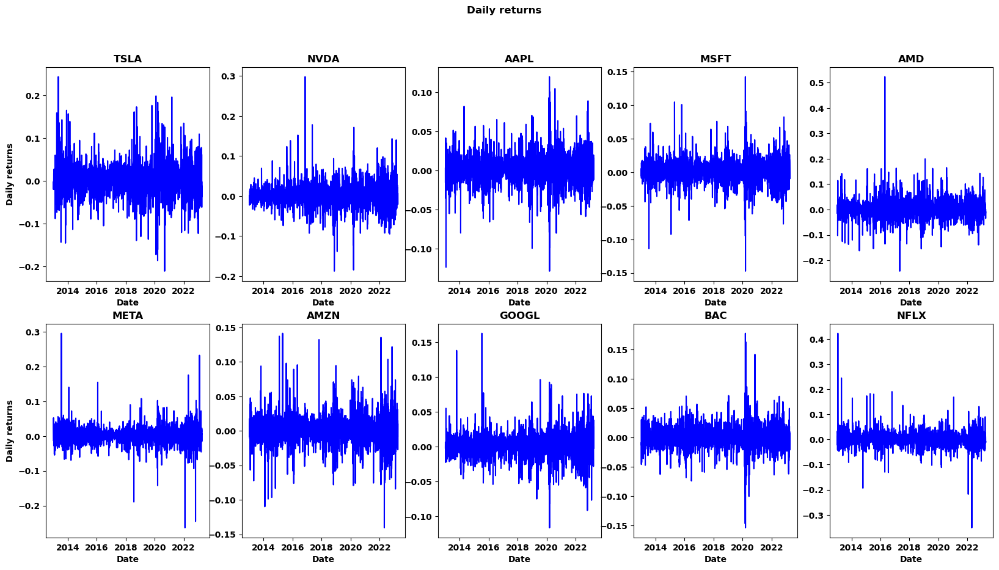

In [ ]:
# Return
fig,axes = plt.subplots(2, 5, figsize = (20, 10))
plt.suptitle('Daily returns')
stocks = df.columns
for i, ax in enumerate(axes.flatten()):
    ax.plot(df_return.index, df_return['return_' + stocks[i]], color = 'blue')
    if (i == 0) or (i == 5):
        ax.set_ylabel('Daily returns')
    ax.set_xlabel('Date')
    ax.set_title(f'{stocks[i]}');

plt.show()
plt.close()

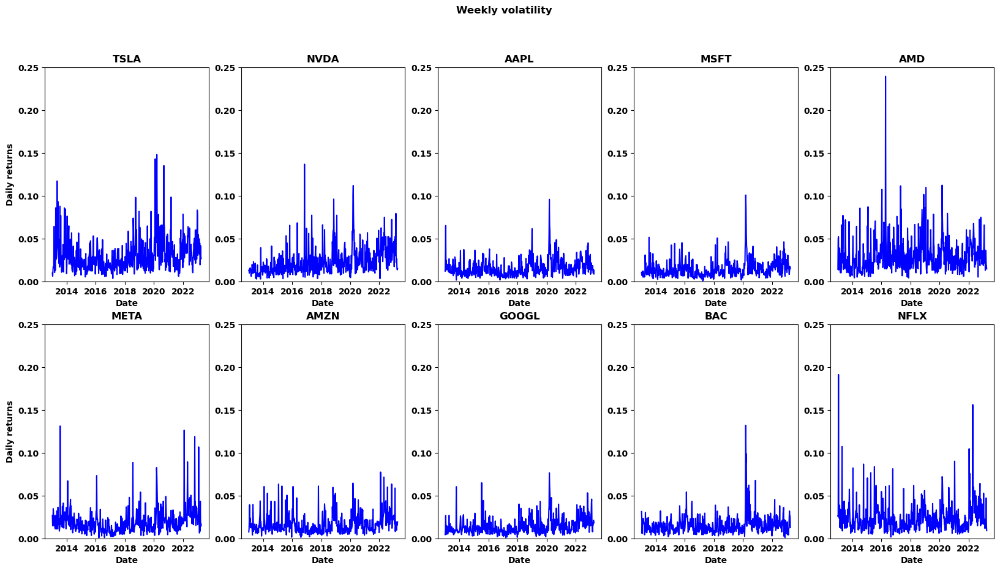

In [ ]:
# Volatility
fig,axes = plt.subplots(2, 5, figsize = (20, 10))
plt.suptitle('Weekly volatility')
stocks = df.columns
for i, ax in enumerate(axes.flatten()):
    ax.plot(df.index, df[stocks[i]], color = 'blue')
    ax.set_ylim([0, 0.25])
    if (i == 0) or (i == 5):
        ax.set_ylabel('Daily returns')
    ax.set_xlabel('Date')
    ax.set_title(f'{stocks[i]}');

plt.show()
plt.close()

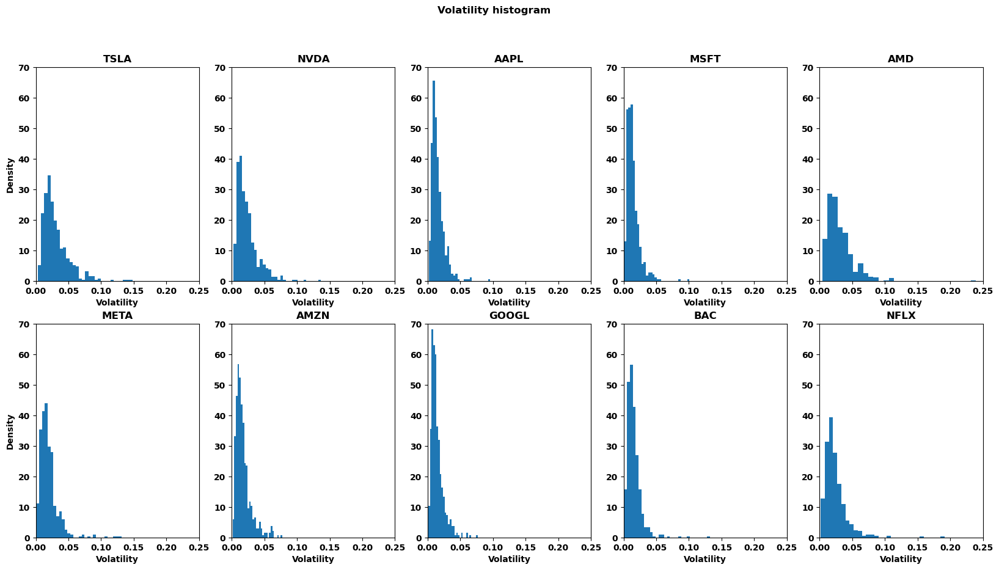

In [ ]:
# Volatility histogram
fig,axes = plt.subplots(2, 5, figsize = (20, 10))
plt.suptitle('Volatility histogram')
stocks = df.columns
for i, ax in enumerate(axes.flatten()):
    ax.hist(df[stocks[i]], density = True, bins = 30)
    ax.set_xlim([0, 0.25])
    ax.set_ylim([0, 70])
    if (i == 0) or (i == 5):
        ax.set_ylabel('Density')
    ax.set_xlabel('Volatility')
    ax.set_title(f'{stocks[i]}');

plt.show()
plt.close()

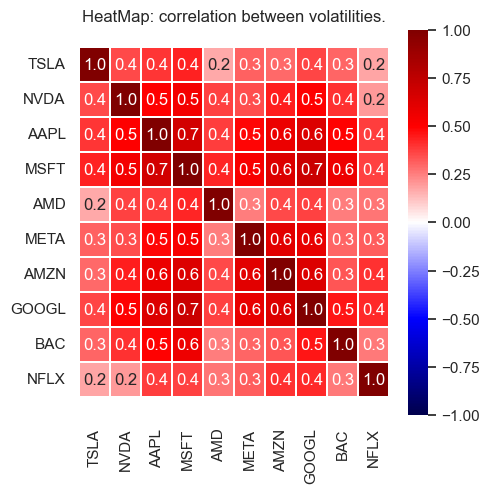

In [ ]:
# Correlation between volatility
def correlation_heatmap(df, title):
    size_x = 5
    size_y = 5
    plt.figure(figsize = (size_x, size_y))
    sns.set(font_scale = 1)
    corr_matrix = df.corr()
    with sns.axes_style('white'):
        ax = sns.heatmap(corr_matrix
                        , linewidth = 0.2
                        , annot = True, fmt = '.1f'
                        , cmap = 'seismic'
                        , vmin = -1, vmax = 1)
    plt.title(title)
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    plt.show()
    plt.close()
    

title = 'HeatMap: correlation between volatilities.'
correlation_heatmap(df, title)

<div id='Modeling' />

## Modeling

**The baseline model will consist of only one hidden layer using LSTM, and the output layer will be a
dense layer with 40 units and a linear activation. The optimizer will be Adam, and the loss function
will be the mean squared error.** \
After testing this baseline model, we will try to add more hidden
layers and even more information, i.e., information about the weekly returns of the stocks. \
Our model will use the prior 52 weeks to predict the next 4 weeks of volatility. Moreover, we will use
the last 52 weeks of data as a test. This way we will have 431 weeks for training the model. Lastly, as
a validation data set, we will use the last 52 weeks available in the training set.

The major reason to not use ARIMA as a baseline model is because we would need to parametrize 10 different ARIMA models, one for each stock. Moreover, with 10 different models, we would not be able to easily add information about the correlation between stocks.

We chose LSTM as our starting point due to its suitability for time series data, given that it processes data sequentially. Additionally, for financial data important interactions and dependencies can span over long periods, even years, so we wanted to utilize LSTM's ability to capture long-term dependencies. Additionally, the flexibility of being able to combine LSTM with other kinds of models makes it a good choice for the type of exploration we want to do.

### Defining the response and explanatory variables.

- The response variable will be the next 4 weeks.
- The explanatory variables will be the last 52 weeks.

In [ ]:
X_LEN = 52
Y_LEN = 4

x = []
y_aux = []
for i in range(X_LEN, len(df) - Y_LEN + 1): 
    X = df[i - X_LEN : i].values
    Y = df[i : i + Y_LEN].values
    x.append(X)
    y_aux.append(Y)

# Each observtion of 'y' has 4 vectors. The first one express the stocks' volatility for the next period. 
# The second one express the stocks' volatility for the second period, and so on.
# Therefore, we will flatten these vector so our neural netwoork can model all these volatilities at the same time. 
y = [] 
for e in y_aux: 
    y.append(e.flatten())
    
n_stocks = len(x[0][0])
print(f'The matrix has {len(x)} observations. This number should be quantity of rows in df (535) minus X_LEN (52) minus Y_LEN (4) plus 1, resulting in 480.')
print(f'Verify if each observation is reading only 52 weeks. Length of x[0]: {len(x[0])}')
print(f'Quantity of different stocks: {n_stocks}')
print(f'Verify if each observation is reading only 4 weeks to predict: {len(y[0])}. This value is quantity of stocks (10) times weeks to predict (4), resulting in 40')

The matrix has 480 observations. This number should be quantity of rows in df (535) minus X_LEN (52) minus Y_LEN (4) plus 1, resulting in 480.
Verify if each observation is reading only 52 weeks. Length of x[0]: 52
Quantity of different stocks: 10
Verify if each observation is reading only 4 weeks to predict: 40. This value is quantity of stocks (10) times weeks to predict (4), resulting in 40


In [ ]:
# Separate in train, validation and test.
TEST_SIZE = 52
# Test
x_test = x[len(x) - TEST_SIZE : len(x)]
y_test = y[len(x) - TEST_SIZE : len(x)]
# Train full. Once the hyperparameters have been defined, we can train the model in this dataset.
x_train_full = x[0 : len(x) - TEST_SIZE]
y_train_full = y[0 : len(x) - TEST_SIZE]
# Validation
x_val = x_train_full[len(x_train_full) - TEST_SIZE : len(x_train_full)]
y_val = y_train_full[len(x_train_full) - TEST_SIZE : len(x_train_full)]
# Train
x_train = x_train_full[0 : len(x_train_full) - TEST_SIZE]
y_train = y_train_full[0 : len(x_train_full) - TEST_SIZE]

# Transform into TensorFlow datasets
dataset_test = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(batch_size = 32)
dataset_train_full = tf.data.Dataset.from_tensor_slices((x_train_full, y_train_full)).batch(batch_size = 32)
dataset_val = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(batch_size = 32)
dataset_train = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(batch_size = 32)

In [ ]:
# check the dataset
print('Test')
for x, y in dataset_test.take(1):
    print("x_test shape:", x.shape)
    print("y_test shape:", y.shape)
print('---------------------------')
print('Train full')
for x, y in dataset_train_full.take(1):
    print("x_train_full shape:", x.shape)
    print("y_train_full shape:", y.shape)
print('---------------------------')
print('Validation')
for x, y in dataset_val.take(1):
    print("x_val shape:", x.shape)
    print("y_val shape:", y.shape) 
print('---------------------------')
print('Train')
for x, y in dataset_train.take(1):
    print("x_train shape:", x.shape)
    print("y_train shape:", y.shape) 

Test
x_test shape: (32, 52, 10)
y_test shape: (32, 40)
---------------------------
Train full
x_train_full shape: (32, 52, 10)
y_train_full shape: (32, 40)
---------------------------
Validation
x_val shape: (32, 52, 10)
y_val shape: (32, 40)
---------------------------
Train
x_train shape: (32, 52, 10)
y_train shape: (32, 40)


<div id='Base_model' />

## Base model

Despite a test mean squared error of only 0.00024, the plots show that most of the times the predictions cannot even capture the direction of the realized volatility. \
This indicates that only one LSTM hidden layer is not enough to capture the relevant features for this model. \
To solve this, we will try three different approaches:
- Add more layers such as convolutional layers and more LSTM layers;
- Use transformers with positional encoder;
- Add information about the prices and returns.


In [ ]:
# Base model
def create_base_model():
    tf.keras.backend.clear_session()
    inputs = keras.layers.Input(shape = (X_LEN, n_stocks))
    LSTM = keras.layers.LSTM(32, return_sequences = False, name = 'LSTM')(inputs)

    outputs = keras.layers.Dense(units = (Y_LEN * n_stocks), activation = 'linear', name = 'output')(LSTM)
    
    model = keras.models.Model(inputs = inputs, outputs = outputs)
    model.compile(loss = 'mean_squared_error',
                  optimizer = keras.optimizers.Adam(learning_rate = 0.0001),
                  metrics = ['mse'],
                 )

    return model

base_model = create_base_model()
base_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 52, 10)]          0         
                                                                 
 LSTM (LSTM)                 (None, 32)                5504      
                                                                 
 output (Dense)              (None, 40)                1320      
                                                                 
Total params: 6,824
Trainable params: 6,824
Non-trainable params: 0
_________________________________________________________________


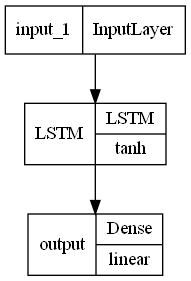

In [ ]:
keras.utils.plot_model(base_model, show_layer_activations=True)

In [ ]:
# Train the model with the full trainning dataset to verify the performance in our test dataset.
start = time.time()
epochs = 250
base_model_history = base_model.fit(dataset_train_full, batch_size = 32
                                    , epochs = epochs
                                    , verbose = 1
                                    , workers = -1
                                    , use_multiprocessing = True)
end = time.time()
baseline_time = (end - start)
print(f'Run time in minutes: {baseline_time/60:.2f}')

Epoch 1/250
14/14 [==============================] - 2s 15ms/step - loss: 6.6353e-04 - mse: 6.6353e-04
Epoch 2/250
14/14 [==============================] - 0s 14ms/step - loss: 5.6263e-04 - mse: 5.6263e-04
Epoch 3/250
14/14 [==============================] - 0s 12ms/step - loss: 4.8443e-04 - mse: 4.8443e-04
Epoch 4/250
14/14 [==============================] - 0s 21ms/step - loss: 4.2280e-04 - mse: 4.2280e-04
Epoch 5/250
14/14 [==============================] - 0s 14ms/step - loss: 3.7364e-04 - mse: 3.7364e-04
Epoch 6/250
14/14 [==============================] - 0s 12ms/step - loss: 3.3438e-04 - mse: 3.3438e-04
Epoch 7/250
14/14 [==============================] - 0s 13ms/step - loss: 3.0326e-04 - mse: 3.0326e-04
Epoch 8/250
14/14 [==============================] - 0s 18ms/step - loss: 2.7889e-04 - mse: 2.7889e-04
Epoch 9/250
14/14 [==============================] - 0s 12ms/step - loss: 2.6009e-04 - mse: 2.6009e-04
Epoch 10/250
14/14 [==============================] - 0s 12ms/step - loss

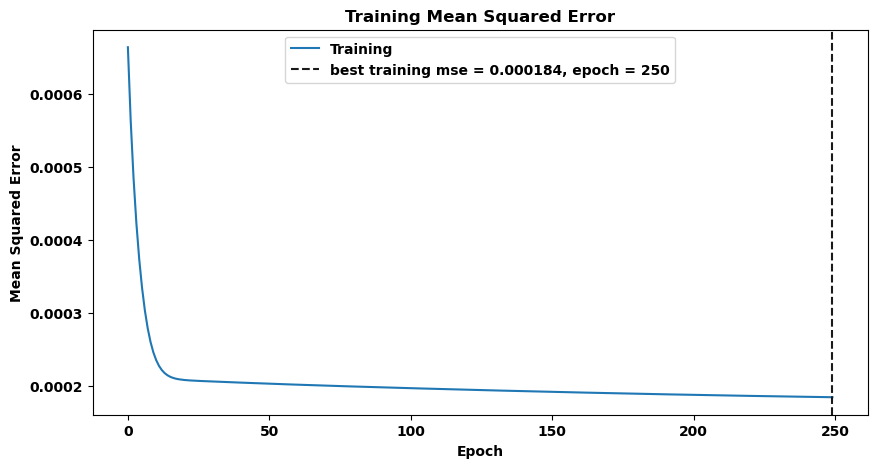

In [ ]:
# Plot training history
def plot_train_metric(model_history, metric, ylabel):
    plt.rcParams.update(plt.rcParamsDefault)
    fig, axes = plt.subplots(1, 1, figsize=(10,5))

    axes.plot(model_history.history[metric], label = 'Training')
    best_metric = np.nanmin(model_history.history[metric])
    epoch_best_metric = np.nanargmin(model_history.history[metric]) + 1
    axes.axvline(np.nanargmin(model_history.history[metric]),
                    c='k', ls='--',
                    label=f'best training {metric} = {best_metric:.6f}, epoch = {epoch_best_metric}')


    axes.set_xlabel('Epoch')
    axes.set_ylabel(ylabel)
    axes.set_title(f"Training {ylabel}")
    axes.legend()
    
    plt.show()
    plt.close();
    
plot_train_metric(base_model_history, 'mse', ylabel = 'Mean Squared Error')

In [ ]:
# Predict in test
y_pred_test = base_model.predict(dataset_test)
mse_test = base_model.evaluate(dataset_test)
print('Test mean squared error:', round(mse_test[1], 6))

2/2 [==============================] - 0s 9ms/step - loss: 2.4486e-04 - mse: 2.4486e-04
Test mean squared error: 0.000245


In [ ]:
def get_prediction_df(y_pred_test):
    '''
    Our test dataset has 52 weeks. For each week we predicted 4 values.
    The df_pred_test_t1 has the first prediction of each week. This means that if we are in the first week of our test dataset, df_pred_test_t1 has the prediction for the second week.
    The df_pred_test_t2 has the second prediction of each week. This means that if we are in the first week of our test dataset, df_pred_test_t2 has the prediction for the third week.
    '''
    df_pred_test = pd.DataFrame(y_pred_test)
    df_pred_test_t1 = df_pred_test[range(0, 10)]
    df_pred_test_t2 = df_pred_test[range(10, 20)]
    df_pred_test_t3 = df_pred_test[range(20, 30)]
    df_pred_test_t4 = df_pred_test[range(30, 40)]

    # Set column names
    df_pred_test_t1.columns = df.columns
    df_pred_test_t2.columns = df.columns
    df_pred_test_t3.columns = df.columns
    df_pred_test_t4.columns = df.columns

    
    '''
    Now, we want to make one data set of predictions for each week in our test dataset.
    This means that if we have 52 weeks in our data set, we will create 52 dataset.
    The first dataset will have the volatility predictions of the first week in our test for the next 4 weeks.
    '''
    dict_predictions = {}
    for i in range(len(df_pred_test_t1)):
        dict_predictions[i + 1] = pd.DataFrame(df_pred_test_t1.iloc[i]).T
        dict_predictions[i + 1] = pd.concat([dict_predictions[i + 1], pd.DataFrame(df_pred_test_t2.iloc[i]).T], ignore_index=True)
        dict_predictions[i + 1] = pd.concat([dict_predictions[i + 1], pd.DataFrame(df_pred_test_t3.iloc[i]).T], ignore_index=True)
        dict_predictions[i + 1] = pd.concat([dict_predictions[i + 1], pd.DataFrame(df_pred_test_t4.iloc[i]).T], ignore_index=True)

    return df_pred_test_t1, df_pred_test_t2, df_pred_test_t3, df_pred_test_t4, dict_predictions

df_pred_test_t1, df_pred_test_t2, df_pred_test_t3, df_pred_test_t4, dict_predictions = get_prediction_df(y_pred_test)

We start by comparing the prediction of our model for only one week ahead. \
After that, we will select just a few weeks and verify the predictions for the next 4 weeks. 

We can verify that not even the prediction for the next week is capable of predicting the volatility.

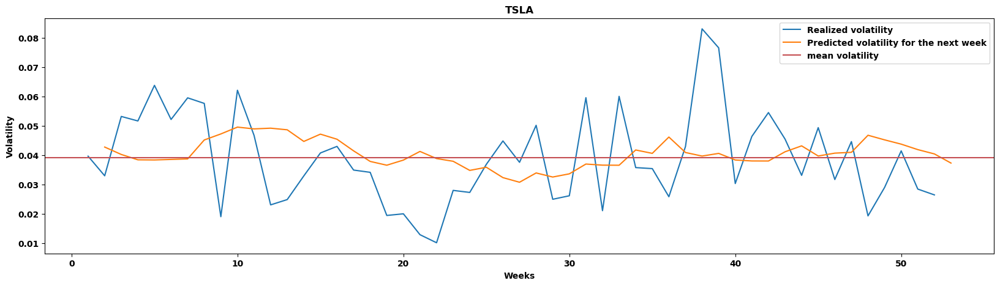

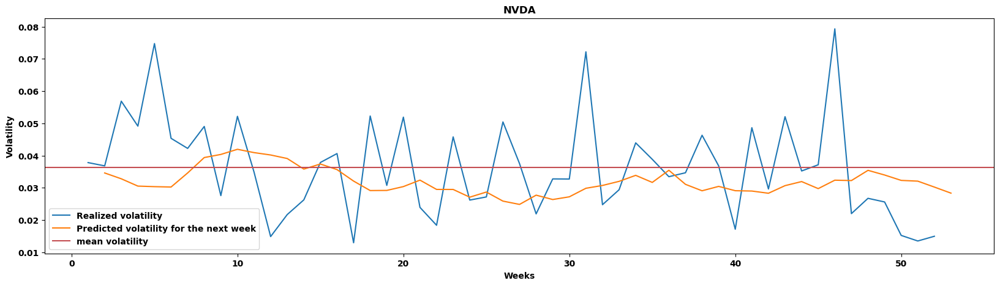

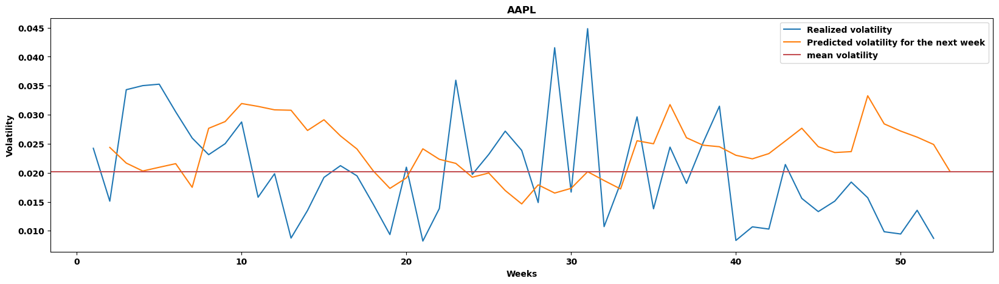

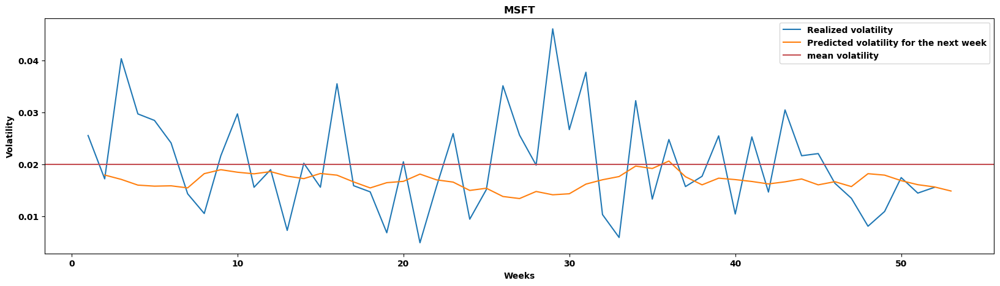

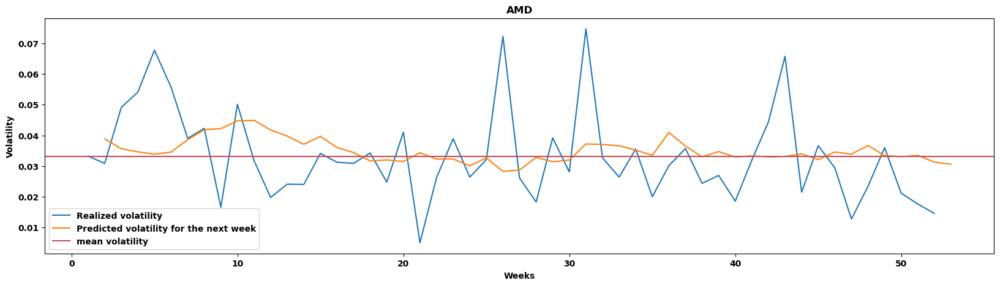

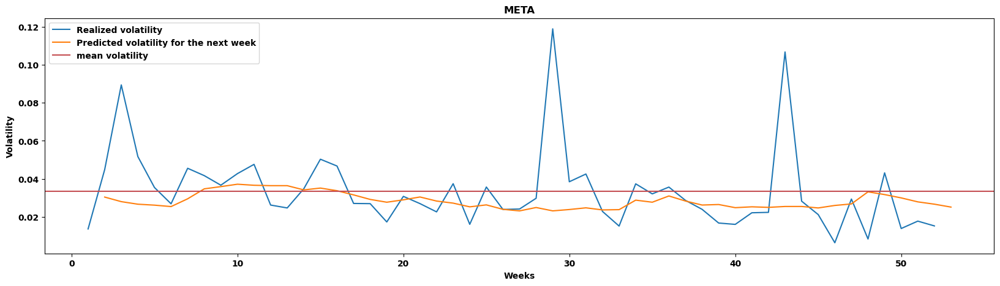

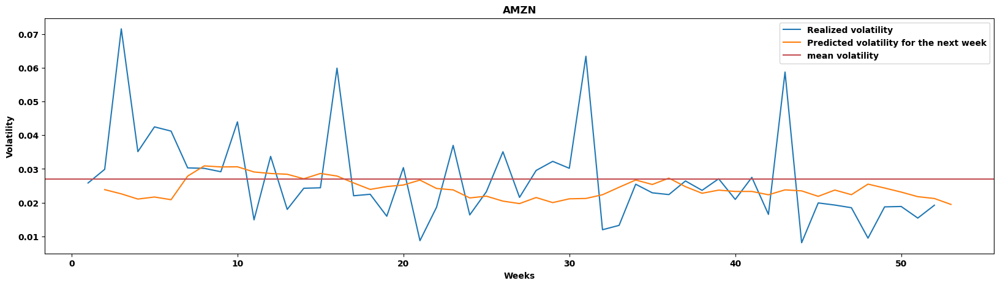

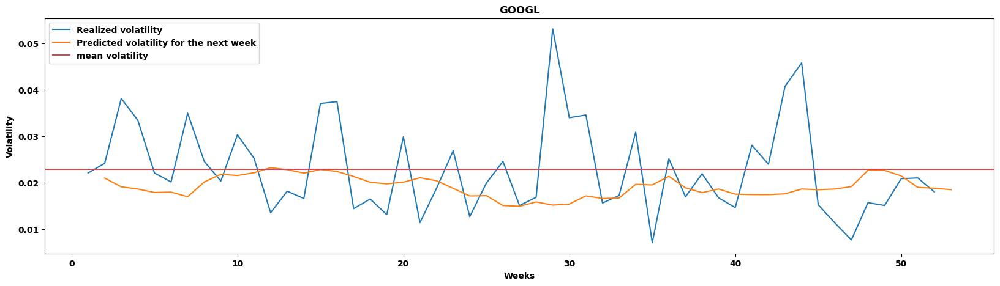

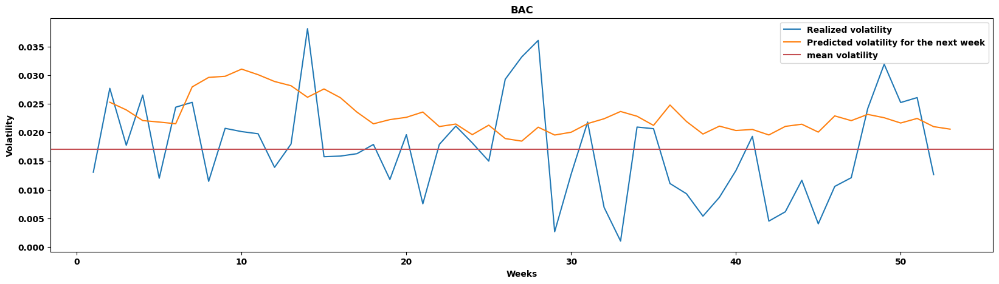

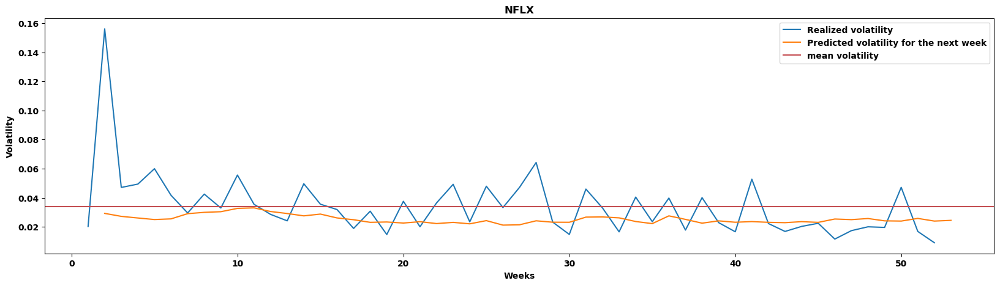

In [ ]:
def plot_predictions_for_t1(df_t1):
    week_t0 = range(1, 53)
    week_t1 = range(2, 54)
    for stocks in df.columns:
        plt.figure(figsize = (20, 5))
        plt.plot(week_t0, df.iloc[-52:][stocks], label = 'Realized volatility')
        plt.plot(week_t1, df_t1[stocks], label = f'Predicted volatility for the next week')

        plt.axhline(y = df.iloc[-52:][stocks].mean(), color='r', linestyle='-', label = 'mean volatility')
        plt.xlabel('Weeks')
        plt.ylabel('Volatility')
        plt.title(stocks)
        plt.legend()
        
    plt.show()
    plt.close();

plot_predictions_for_t1(df_pred_test_t1)

Now, let's plot the prediction for all the 4 weeks that our model tried to predict. \
We did not plot the prediction for all the weeks because this would make our plots harder to read.

The plots show that our model cannot even capture if the volatility is increasing or decreasing. \
As said before, this indicates that only one LSTM hidden layer is not enough to capture the relevant features for this model. \
To solve this, we will try three different approaches:
- Add more layers such as convolutional neural networks and more LSTM. 
- Use transformers with positional encoder;
- Add information about the prices and returns.

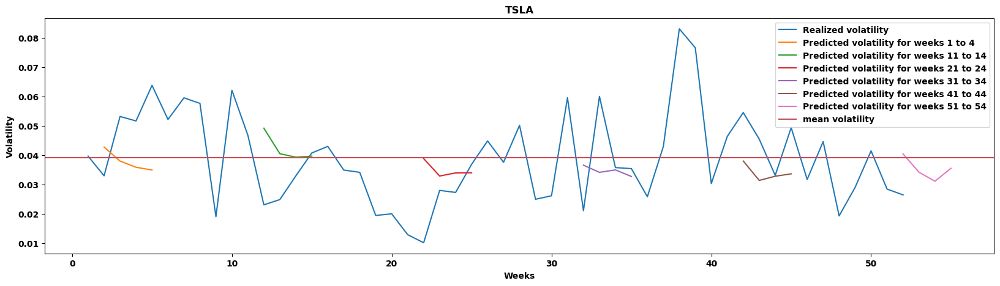

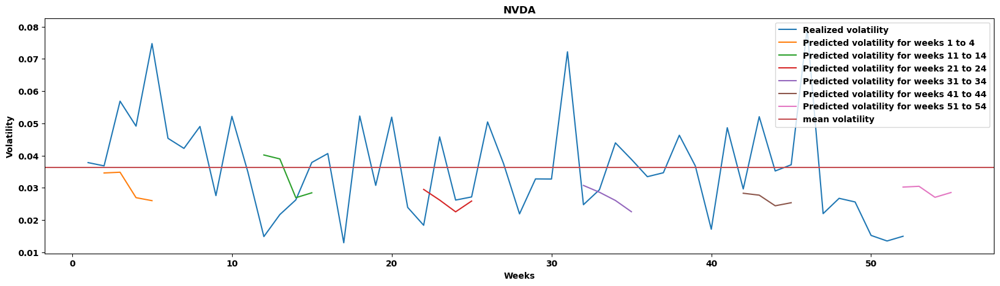

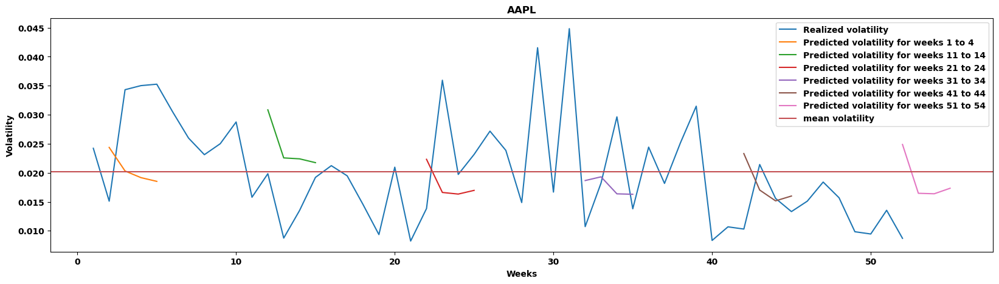

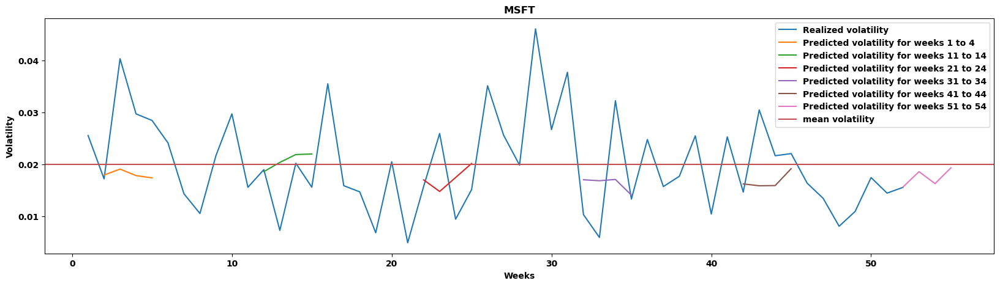

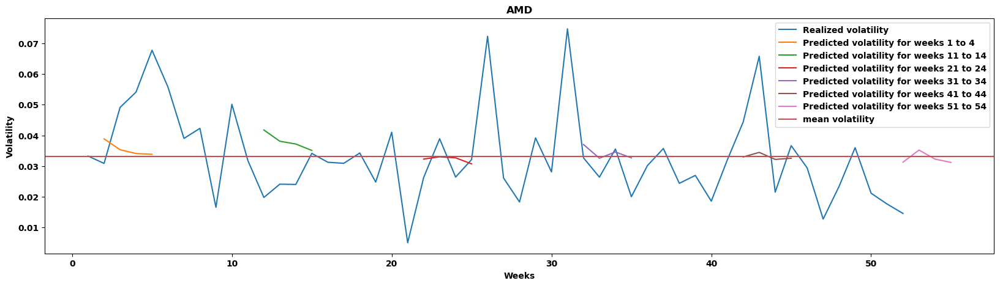

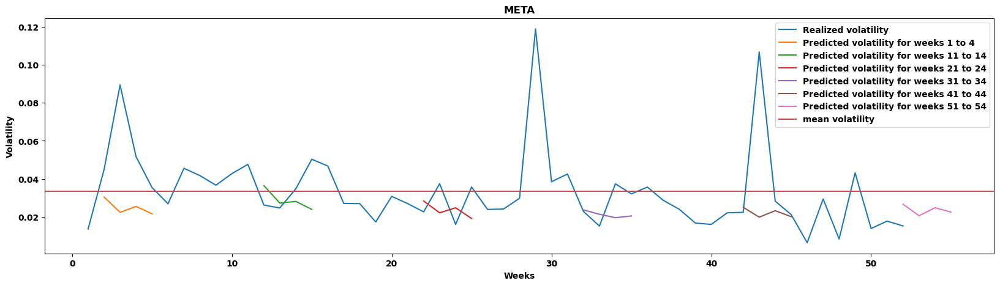

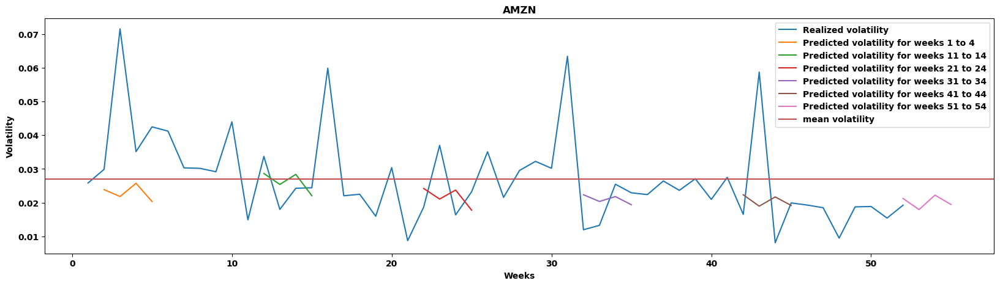

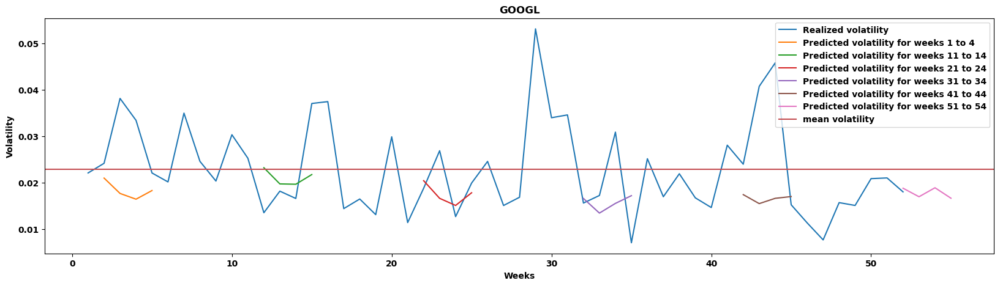

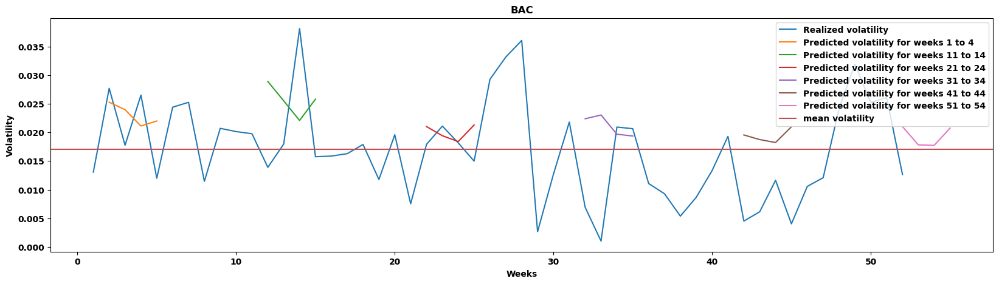

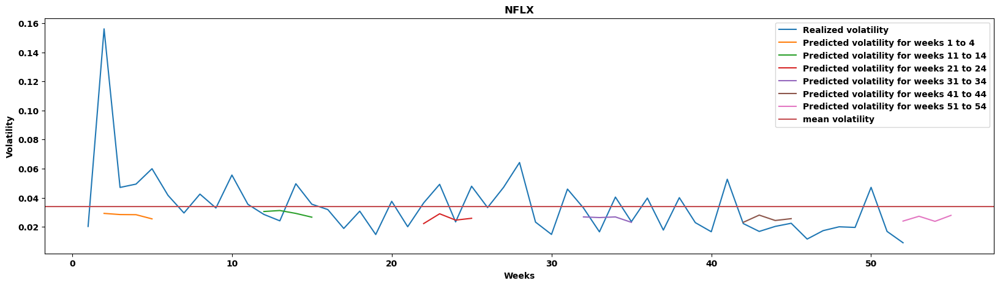

In [ ]:
# Plot results
def plot_results(dict_predictions):
    dict_week = {}
    dict_week[0] = range(1, 53)  # Used to plot the realized volatility.
    for i in range(1, 53):
        dict_week[i] = range(i + 1, i + 5)

    for stocks in df.columns:
        plt.figure(figsize = (20, 5))
        plt.plot(dict_week[0], df.iloc[-52:][stocks], label = 'Realized volatility')
        for i in range(1, 53, 10):  # Plot only some of the predictions.
            plt.plot(dict_week[i], dict_predictions[i][stocks], label = f'Predicted volatility for weeks {i} to {i + 3}')

        plt.axhline(y = df.iloc[-52:][stocks].mean(), color='r', linestyle='-', label = 'mean volatility')
        plt.xlabel('Weeks')
        plt.ylabel('Volatility')
        plt.title(stocks)
        plt.legend()
        
    plt.show()
    plt.close()

plot_results(dict_predictions)

<div id='Model_1_Adding_more_layers' />

## Model 1: Adding more layers

We experiment with the addition of CNNs to our model given their ability to identify and learn local patterns. We hope that layers with different kernel sizes will assist with multi-scale pattern detection for both long and short-term dynamics. 

The input data is passed through a series of CNN layers with different kernel sizes (2, 4, 8, and 16). For each kernel, we pass the input through two parallel branches. One branch uses max pooling, the other uses average pooling. These outputs are added together, which serves to combine the feature maps and attempt to capture various levels of temporal patterns in the data. The feature maps are then fed through two LSTM layers. We compile it using the Huber loss to decrease the sensitivity to outliers.

In [ ]:
# Model 1
def create_model_1(X_LEN = X_LEN, Y_LEN = Y_LEN, n_stocks = n_stocks, CNN_filter = 32, LSTM_units = 64):
    tf.keras.backend.clear_session()
    inputs = keras.layers.Input(shape = (X_LEN, n_stocks))
    
    CNN_1 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 2, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_1)
    X = keras.layers.Activation('relu')(X)
    MAX_1 = keras.layers.MaxPool1D(pool_size = 2, strides = 1, padding = 'same')(X)
    
    CNN_1 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 2, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_1)
    X = keras.layers.Activation('relu')(X)
    AVE_1 = keras.layers.AveragePooling1D(pool_size = 2, strides = 1, padding = 'same')(X)
    
    
    CNN_2 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 4, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_2)
    X = keras.layers.Activation('relu')(X)
    MAX_2 = keras.layers.MaxPool1D(pool_size = 4, strides = 1, padding = 'same')(X)
    
    CNN_2 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 4, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_2)
    X = keras.layers.Activation('relu')(X)
    AVE_2 = keras.layers.AveragePooling1D(pool_size = 4, strides = 1, padding = 'same')(X)
    
    
    CNN_3 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 8, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_3)
    X = keras.layers.Activation('relu')(X)
    MAX_3 = keras.layers.MaxPool1D(pool_size = 8, strides = 1, padding = 'same')(X)
    
    CNN_3 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 8, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_3)
    X = keras.layers.Activation('relu')(X)
    AVE_3 = keras.layers.AveragePooling1D(pool_size = 8, strides = 1, padding = 'same')(X)
    
    
    CNN_4 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 16, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_4)
    X = keras.layers.Activation('relu')(X)
    MAX_4 = keras.layers.MaxPool1D(pool_size = 16, strides = 1, padding = 'same')(X)
    
    CNN_4 = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 16, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN_4)
    X = keras.layers.Activation('relu')(X)
    AVE_4 = keras.layers.AveragePooling1D(pool_size = 16, strides = 1, padding = 'same')(X)
    
    
    ADD_1 = keras.layers.Add()([MAX_1, AVE_1, MAX_2, AVE_2, MAX_3, AVE_3, MAX_4, AVE_4])
    
    LSTM_1 = keras.layers.LSTM(units = LSTM_units, return_sequences = True, name = 'LSTM_1')(ADD_1)
    
    LSTM_2 = keras.layers.LSTM(units = LSTM_units, return_sequences = False, name = 'LSTM_2')(LSTM_1)
    

    outputs = keras.layers.Dense(units = (Y_LEN * n_stocks), activation = 'linear', name = 'output')(LSTM_2)
    
    model = keras.models.Model(inputs = inputs, outputs = outputs)
    model.compile(loss = tf.keras.losses.Huber(),
                  optimizer = keras.optimizers.Adam(learning_rate = 0.001),
                  metrics = ['mse'],
                 )

    return model
model_1 = create_model_1(CNN_filter = 32, LSTM_units = 64)
model_1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 52, 10)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 52, 32)       672         ['input_1[0][0]']                
                                                                                                  
 conv1d_1 (Conv1D)              (None, 52, 32)       672         ['input_1[0][0]']                
                                                                                                  
 conv1d_2 (Conv1D)              (None, 52, 32)       1312        ['input_1[0][0]']                
                                                                                              

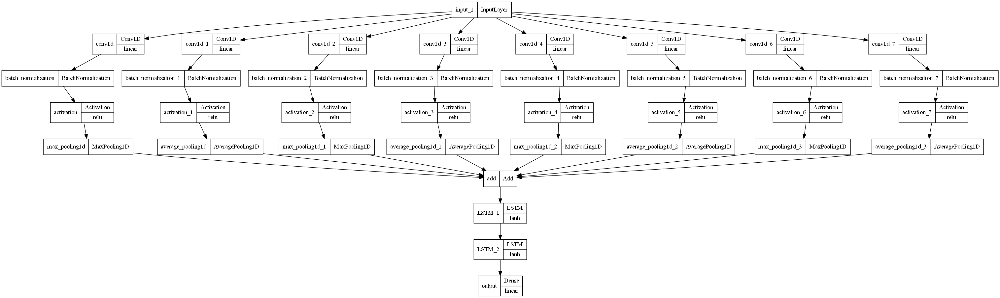

In [ ]:
keras.utils.plot_model(model_1, show_layer_activations=True)

In [ ]:
# Train model
start = time.time()
model_1 = create_model_1()
epochs = 200
model_1_history = model_1.fit(dataset_train, batch_size = 32
                                    , validation_data = dataset_val
                                    , epochs = epochs
                                    , verbose = 1
                                    , workers = -1
                                    , use_multiprocessing = True)

end = time.time()
model_1_time = (end - start)
print(f'Run time in minutes: {model_1_time/60:.2f}')


Epoch 1/200
12/12 [==============================] - 8s 119ms/step - loss: 0.0063 - mse: 0.0126 - val_loss: 4.0001e-04 - val_mse: 8.0003e-04
Epoch 2/200
12/12 [==============================] - 0s 40ms/step - loss: 8.5901e-04 - mse: 0.0017 - val_loss: 3.1918e-04 - val_mse: 6.3836e-04
Epoch 3/200
12/12 [==============================] - 0s 40ms/step - loss: 4.4277e-04 - mse: 8.8553e-04 - val_loss: 3.0430e-04 - val_mse: 6.0860e-04
Epoch 4/200
12/12 [==============================] - 0s 41ms/step - loss: 2.5507e-04 - mse: 5.1014e-04 - val_loss: 3.2107e-04 - val_mse: 6.4214e-04
Epoch 5/200
12/12 [==============================] - 0s 40ms/step - loss: 1.8873e-04 - mse: 3.7746e-04 - val_loss: 3.0097e-04 - val_mse: 6.0194e-04
Epoch 6/200
12/12 [==============================] - 0s 41ms/step - loss: 1.6779e-04 - mse: 3.3557e-04 - val_loss: 3.0723e-04 - val_mse: 6.1446e-04
Epoch 7/200
12/12 [==============================] - 0s 39ms/step - loss: 1.5648e-04 - mse: 3.1296e-04 - val_loss: 3.0789e-

In [ ]:
# Plot the training and validation history
def plot_train_val_metric(model_history, metric, ylabel):
    fig, axes = plt.subplots(1, 1, figsize=(10,5))

    axes.plot(model_history.history[metric], label='Training')
    axes.plot(model_history.history['val_' + metric], label='Validation')
    best_metric = np.nanmin(model_history.history['val_' + metric])
    epoch_best_metric = np.nanargmin(model_history.history['val_' + metric]) + 1
    axes.axvline(np.nanargmin(model_history.history['val_' + metric]),
                    c='k', ls='--',
                    label=f'best val {metric} = {best_metric:.6f}, epoch = {epoch_best_metric}')


    axes.set_xlabel('Epoch')
    axes.set_ylabel(ylabel)
    axes.set_title(f"Training and Validation {metric}")
    axes.legend()
    
    plt.show()
    plt.close();
    
    return epoch_best_metric, best_metric

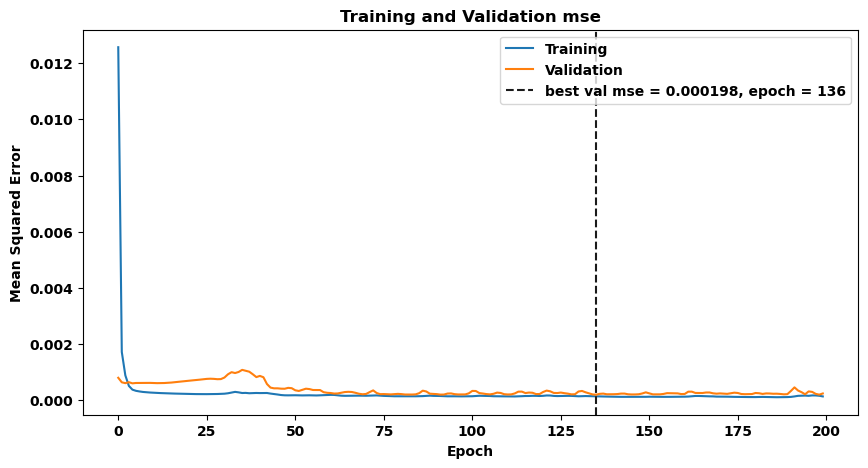

In [ ]:
best_epoch, best_mse = plot_train_val_metric(model_1_history, 'mse', ylabel = 'Mean Squared Error')

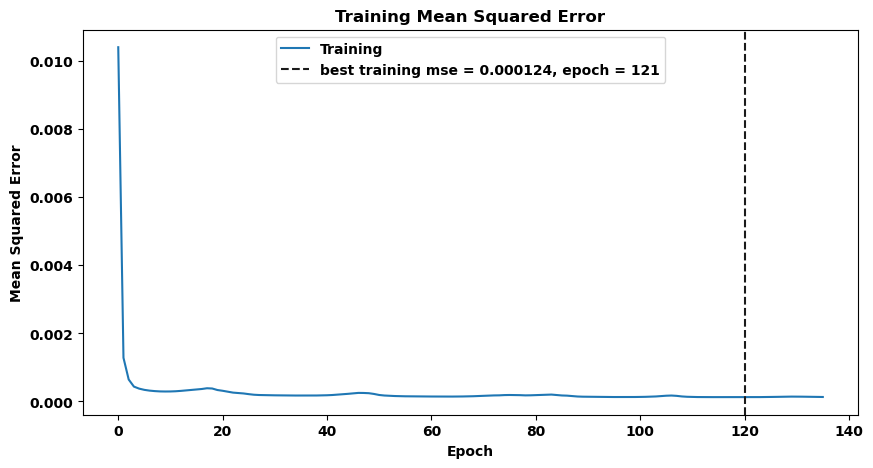

In [ ]:
# Train the model with the full trainning dataset to verify the performance in our test dataset.
model_1 = create_model_1()
epochs = best_epoch
model_1_test_history = model_1.fit(dataset_train_full, batch_size = 32
                                    , epochs = epochs
                                    , verbose = 0
                                    , workers = -1
                                    , use_multiprocessing = True)
# Plot training history
plot_train_metric(model_1_test_history, 'mse', ylabel = 'Mean Squared Error')

First, let's compare the prediction of our model for only one week ahead. \
After, we will select just a few weeks and verify the predictions for the next 4 weeks. 

Despite the decrease in the training error, we had an increase in the test error.

2/2 [==============================] - 0s 23ms/step - loss: 1.8199e-04 - mse: 3.6398e-04
Test mean squared error: 0.000364
------------------------------------------------------


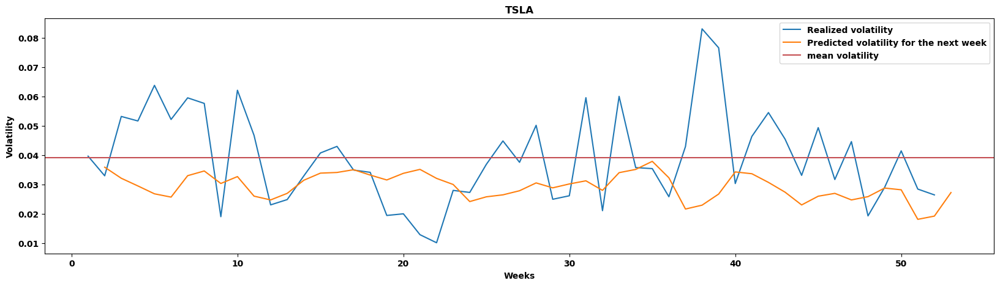

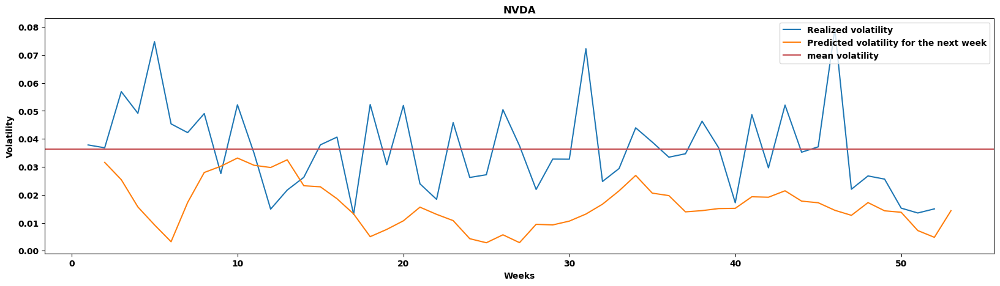

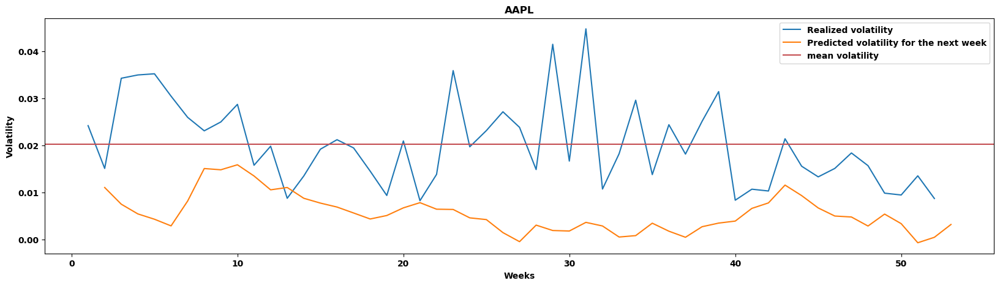

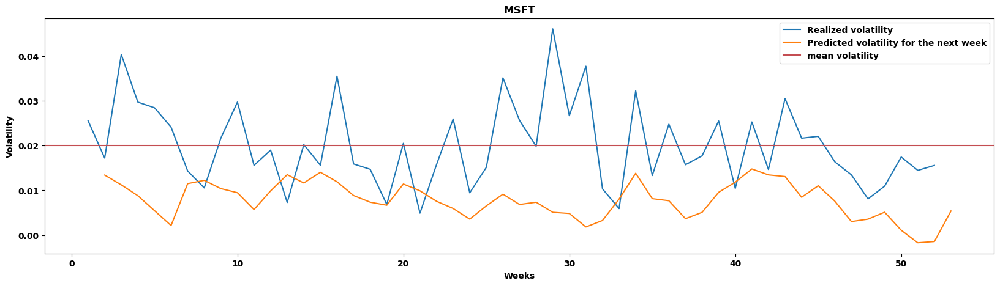

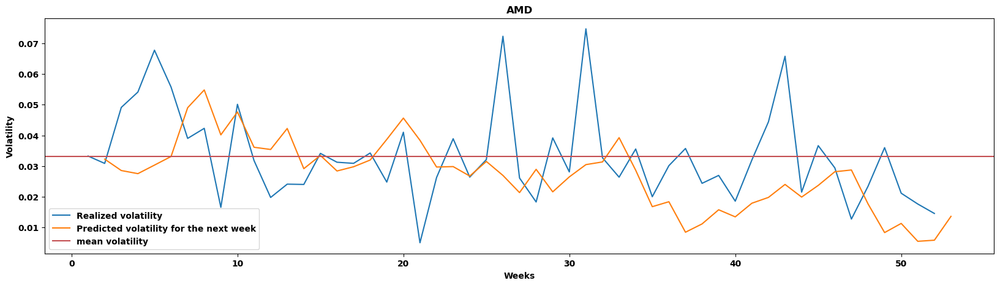

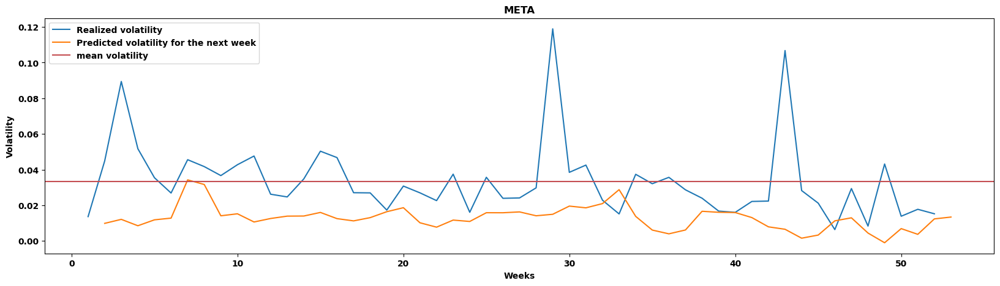

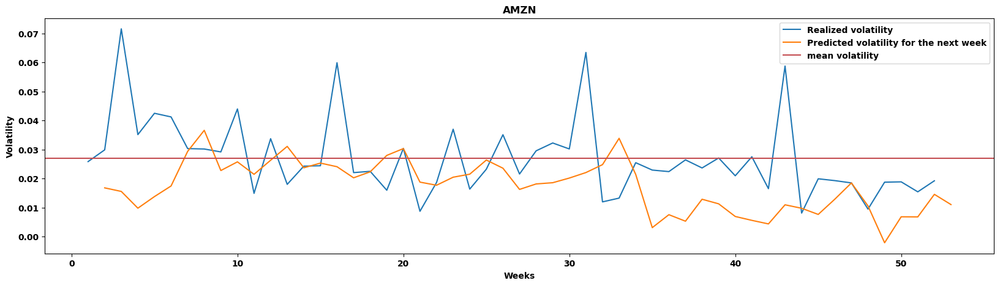

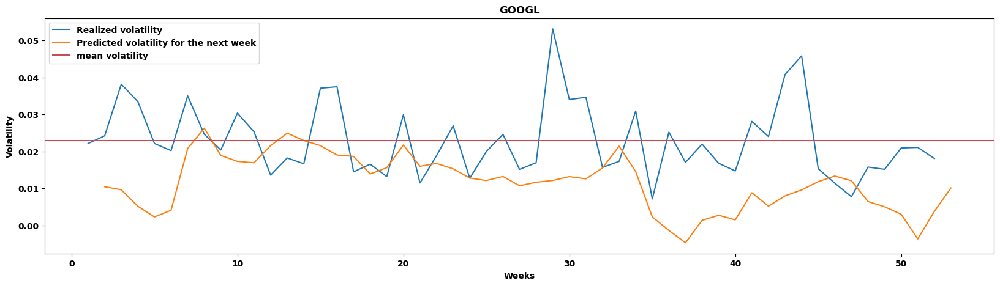

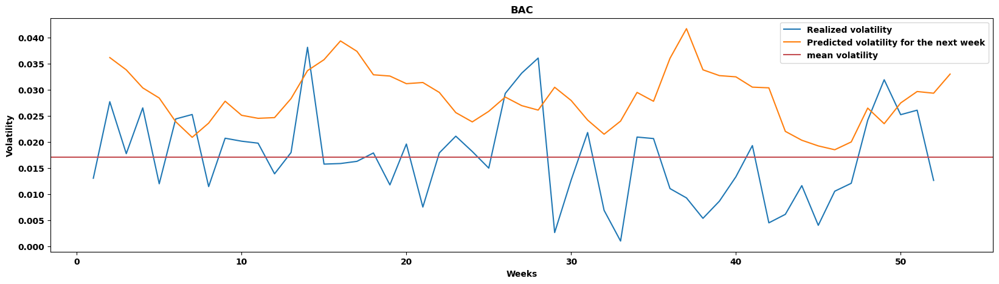

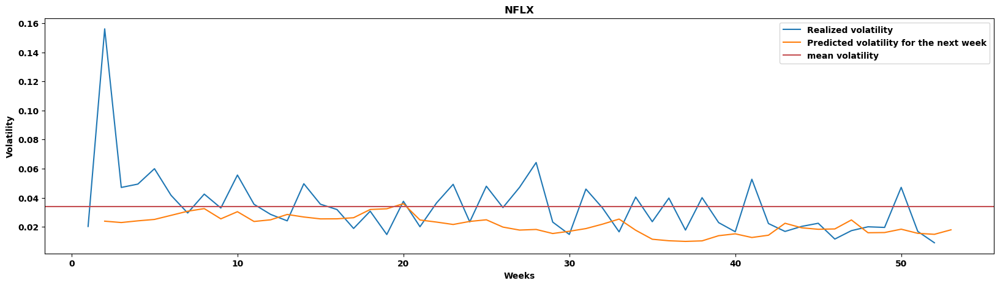

In [ ]:
# Predict in test and plot results
y_pred_test = model_1.predict(dataset_test)
mse_test = model_1.evaluate(dataset_test)
print('Test mean squared error:', round(mse_test[1], 6))
print('------------------------------------------------------')
df_pred_test_t1, df_pred_test_t2, df_pred_test_t3, df_pred_test_t4, dict_predictions = get_prediction_df(y_pred_test)
plot_predictions_for_t1(df_pred_test_t1)

Now, let's plot the prediction for all the 4 weeks that our model tried to predict. \
We did not plot the prediction for all the weeks because this would make our plots hard to visualize.

Again, the plots show that our model cannot even capture if the volatility is increasing or decreasing. \
So, let's try our second approach:
- Use a Transformers model architecture with positional encoder.

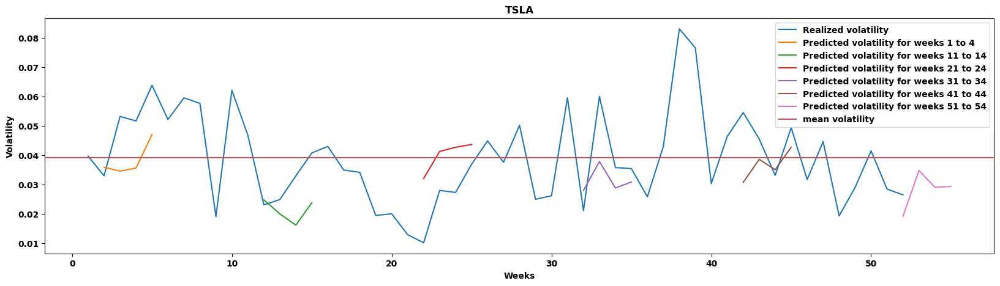

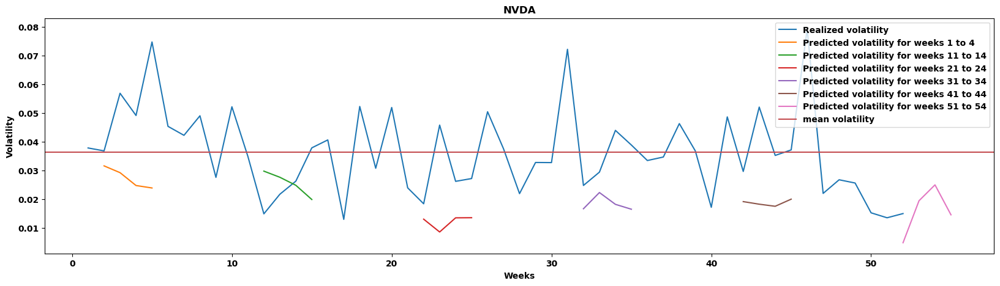

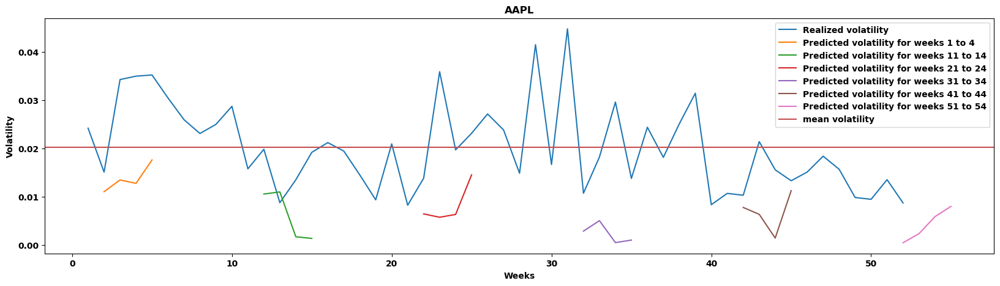

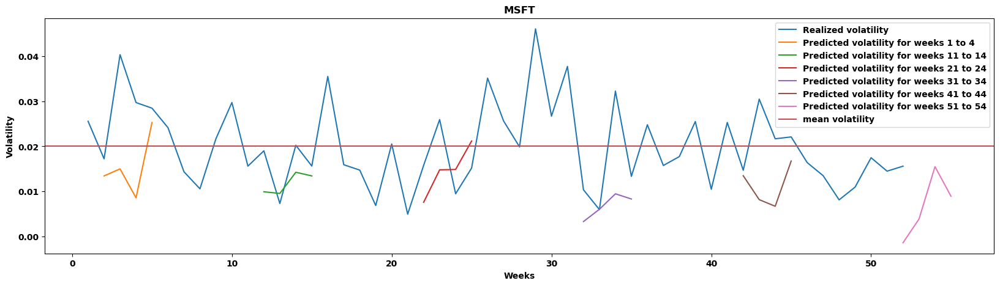

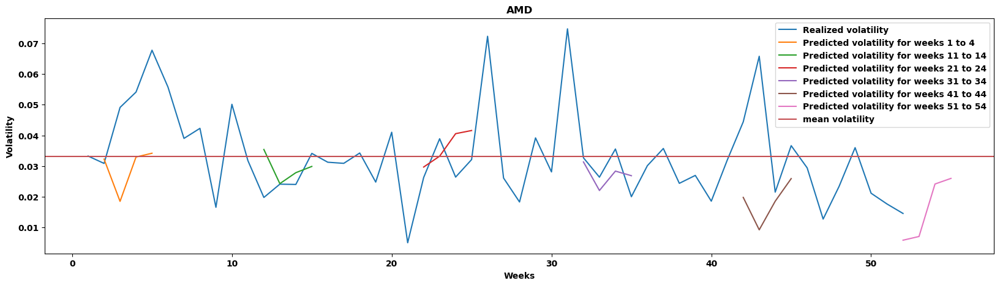

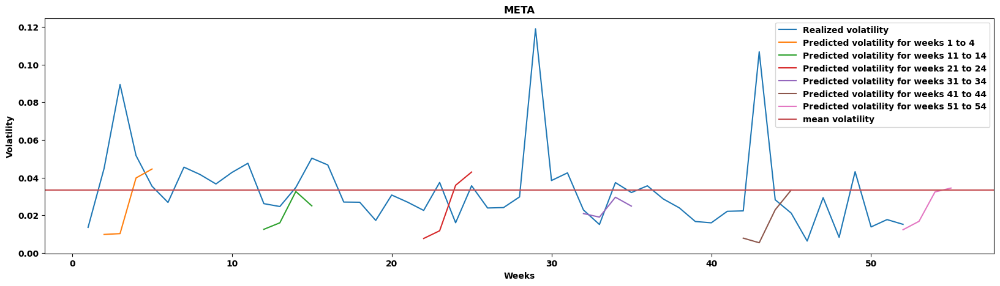

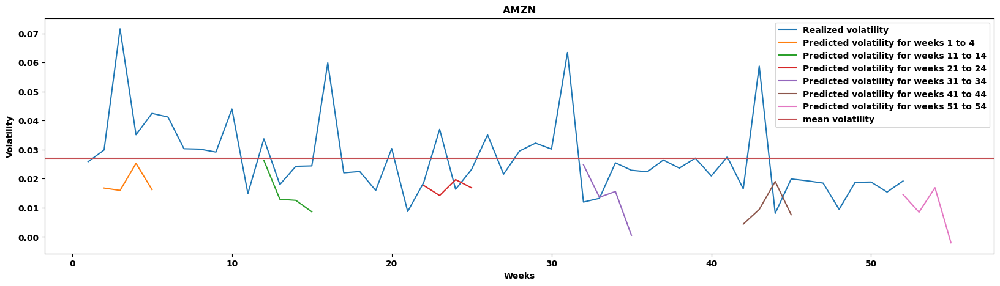

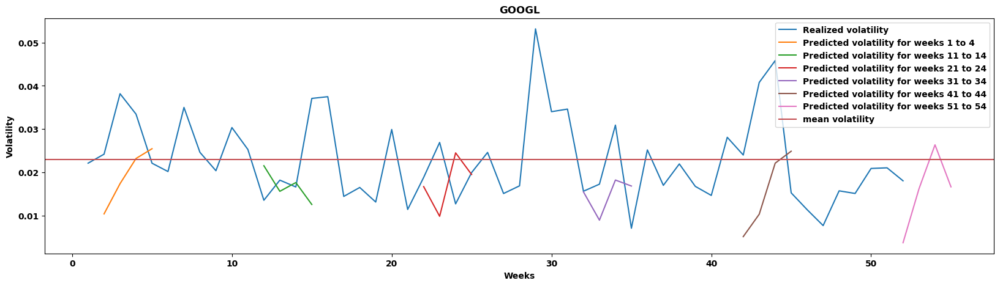

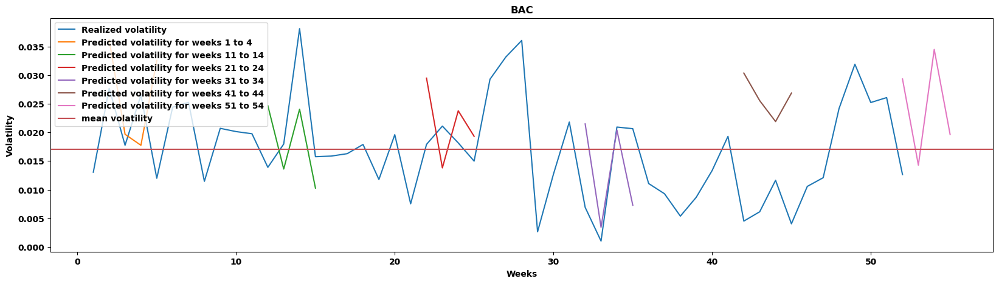

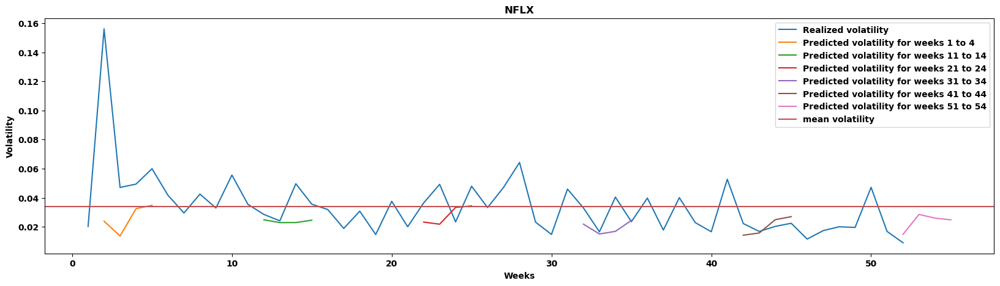

In [ ]:
plot_results(dict_predictions)

<div id='Model_2_Transformers' />

## Model 2: Transformers

For this model we first define an EncoderLayer class which defines on layer of a Transformer encoder. It has a multi-headed attention mechanism followed by a layer of normalization, a dense projection, and another normalization layer. 

Then we define a function to generate positional encodings. This creates the positional encoding matrix which is added to the input data. It combines sinusoidal functions to create a unique representation for each position in the sequence. 

Our model transforms the input data using the function to generate positional encodings and then uses several stacked layers generated with the EncoderLayer class. Finally, we flatten the output. For this model, we use much smaller learning rate than the default, at -0.0001.

We wanted to attempt a transformer model because the positional encoding allows us the capture the temporal order of events which is essential for time-series data,  and because of the self attention mechanism. We wanted to utilize its ability to learn a more context-aware representation by allowing it to weigh the importance of different time steps in the input sequence. As relationships between time-steps in financial markets can be complex and non-linear, we thought this approach might be useful.

In [ ]:
# Model 2
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads):
        super().__init__()
        # Layer parameters
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads

        # MultiHeadAttention Layer - Self Attention
        self.attention = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        # Normalization Layer
        self.attention_norm = tf.keras.layers.LayerNormalization(epsilon=1e-12)

        # Dense projection
        self.dense_proj = tf.keras.Sequential(
            [tf.keras.layers.Dense(units=dense_dim, activation="relu"),
             tf.keras.layers.Dense(units=embed_dim)]
        )
        # Normalization Layer
        self.dense_projection_norm = tf.keras.layers.LayerNormalization(epsilon=1e-12)

    def call(self, inputs):
        
        # Compute Self Attention
        self_attention = self.attention(query=inputs, value=inputs, key=inputs)
        # Apply Normalization + Residual connection
        self_attention = self.attention_norm(inputs + self_attention)

        # Apply projection
        layer_output = self.dense_proj(self_attention)
        # Apply Normalization + Residual connection
        layer_output = self.dense_projection_norm(self_attention + layer_output)

        return layer_output
    
def generate_positional_encoding(max_length, model_size):
    pos_enc = np.array(
        [
            [pos / np.power(10000, 2 * (j // 2) / model_size) for j in range(model_size)]
            if pos != 0
            else np.zeros(model_size)
            for pos in range(max_length)
        ]
    )
    pos_enc[0:, 0::2] = np.sin(pos_enc[0:, 0::2])  # dim 2i
    pos_enc[0:, 1::2] = np.cos(pos_enc[0:, 1::2])  # dim 2i+1
    return pos_enc.reshape(-1,52,10)



    
def create_model_2(X_LEN = X_LEN, Y_LEN = Y_LEN, n_stocks = n_stocks, num_layers = 4, ff_dim = n_stocks, num_heads = 4):
    tf.keras.backend.clear_session()
    
    inputs = keras.layers.Input(shape = (X_LEN, n_stocks))
    
    X = generate_positional_encoding(max_length = X_LEN, model_size = n_stocks)
    ADD_1 = keras.layers.Add()([inputs, X])
    

    # Repeat the output to "n" number of layers
    encoder_output = ADD_1
    for i in range(num_layers):
        encoder_output = EncoderLayer(embed_dim = n_stocks, dense_dim = ff_dim, num_heads=num_heads)(encoder_output)
        
    flatten = keras.layers.Flatten()(encoder_output)

    outputs = keras.layers.Dense(units = (Y_LEN * n_stocks), activation = 'linear', name = 'output')(flatten)
    
    model = keras.models.Model(inputs = inputs, outputs = outputs)
    model.compile(loss = tf.keras.losses.Huber(),
                  optimizer = keras.optimizers.Adam(learning_rate = 0.0001),
                  metrics = ['mse'],
                 )

    return model

model_2 = create_model_2(X_LEN = X_LEN, Y_LEN = Y_LEN, n_stocks = n_stocks, num_layers = 20, ff_dim = 160, num_heads = 20)
model_2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 52, 10)]          0         
                                                                 
 add (Add)                   (None, 52, 10)            0         
                                                                 
 encoder_layer (EncoderLayer  (None, 52, 10)           12020     
 )                                                               
                                                                 
 encoder_layer_1 (EncoderLay  (None, 52, 10)           12020     
 er)                                                             
                                                                 
 encoder_layer_2 (EncoderLay  (None, 52, 10)           12020     
 er)                                                             
                                                             

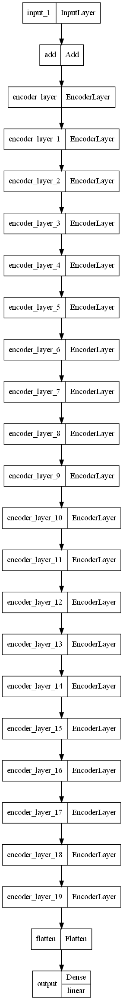

In [ ]:
keras.utils.plot_model(model_2, show_layer_activations=True)

In [ ]:
# Train model
start = time.time()
model_2 = create_model_2()
epochs = 300
model_2_history = model_2.fit(dataset_train, batch_size = 32
                                    , validation_data = dataset_val
                                    , epochs = epochs
                                    , verbose = 1
                                    , workers = -1
                                    , use_multiprocessing = True)

end = time.time()
model_2_time = (end - start)
print(f'Run time in minutes: {model_2_time}')

Epoch 1/300
12/12 [==============================] - 10s 105ms/step - loss: 0.4301 - mse: 1.0237 - val_loss: 0.2569 - val_mse: 0.5888
Epoch 2/300
12/12 [==============================] - 1s 46ms/step - loss: 0.1695 - mse: 0.3750 - val_loss: 0.0865 - val_mse: 0.1760
Epoch 3/300
12/12 [==============================] - 1s 46ms/step - loss: 0.0486 - mse: 0.0978 - val_loss: 0.0169 - val_mse: 0.0338
Epoch 4/300
12/12 [==============================] - 1s 48ms/step - loss: 0.0075 - mse: 0.0150 - val_loss: 0.0018 - val_mse: 0.0036
Epoch 5/300
12/12 [==============================] - 1s 51ms/step - loss: 0.0017 - mse: 0.0034 - val_loss: 0.0016 - val_mse: 0.0032
Epoch 6/300
12/12 [==============================] - 1s 56ms/step - loss: 0.0014 - mse: 0.0027 - val_loss: 8.3511e-04 - val_mse: 0.0017
Epoch 7/300
12/12 [==============================] - 1s 49ms/step - loss: 6.2128e-04 - mse: 0.0012 - val_loss: 3.2857e-04 - val_mse: 6.5714e-04
Epoch 8/300
12/12 [==============================] - 1s 48

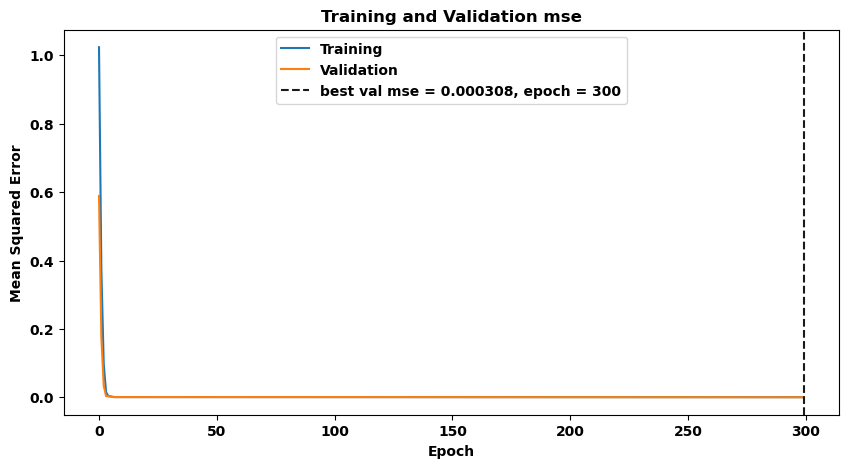

In [ ]:
# Plot the training history   
best_epoch, best_mse = plot_train_val_metric(model_2_history, 'mse', ylabel = 'Mean Squared Error')

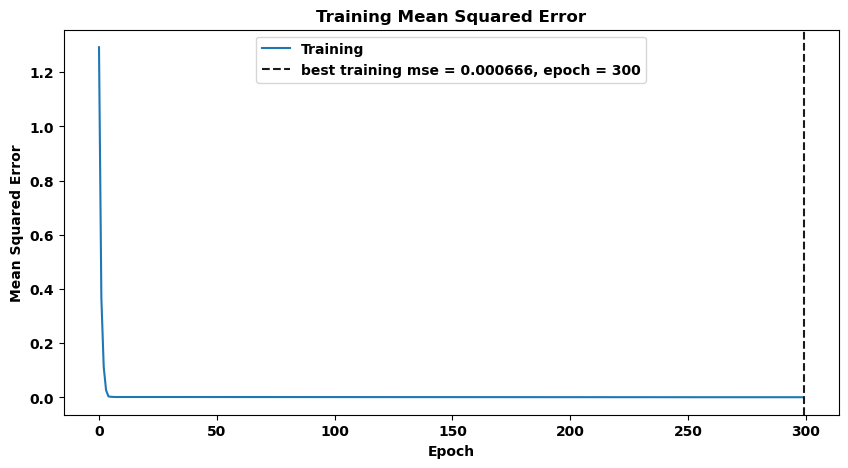

In [ ]:
# Train the model with the full trainning dataset to verify the performance in our test dataset.
model_2 = create_model_2()
epochs = best_epoch
model_2_test_history = model_2.fit(dataset_train_full, batch_size = 32
                                    , epochs = epochs
                                    , verbose = 0
                                    , workers = -1
                                    , use_multiprocessing = True)
# Plot training history
plot_train_metric(model_2_test_history, 'mse', ylabel = 'Mean Squared Error')

First, let's compare the prediction of our model for only one week ahead. \
After, we will select just a few weeks and verify the predictions for the next 4 weeks.

Unfortunately, the use of transformers resulted in a higher validation and test mean squared error if compared with our first approach.

2/2 [==============================] - 0s 17ms/step - loss: 3.4110e-04 - mse: 6.8220e-04
Test mean squared error: 0.000682
------------------------------------------------------


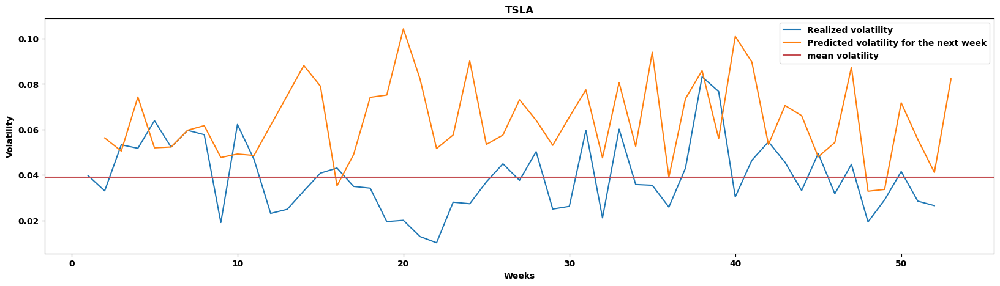

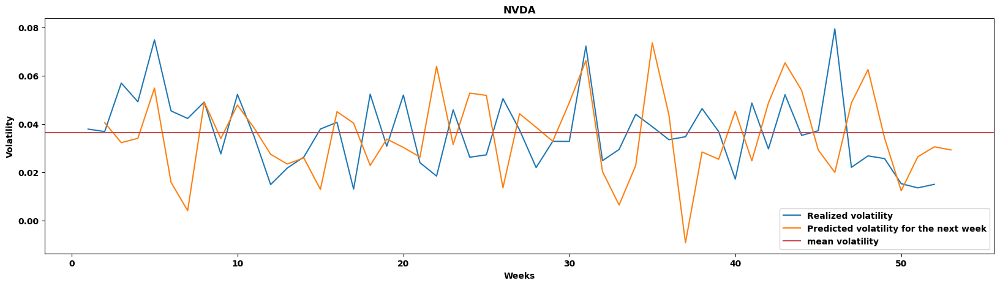

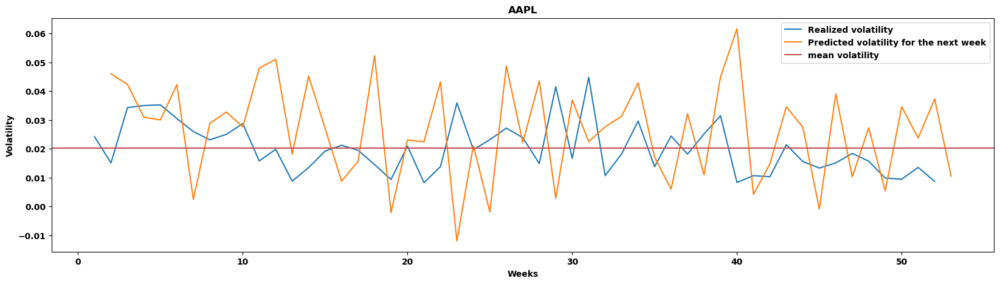

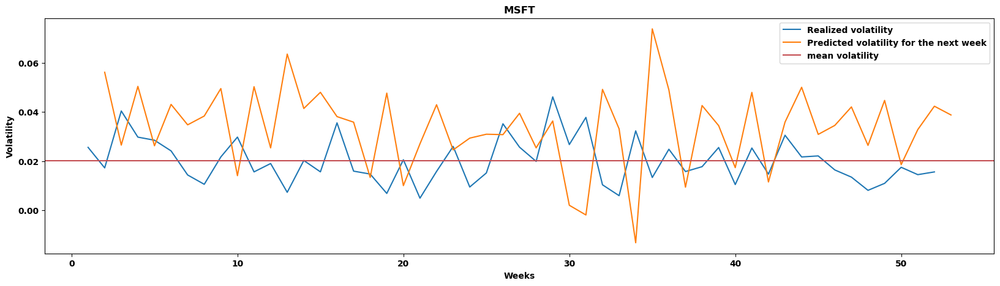

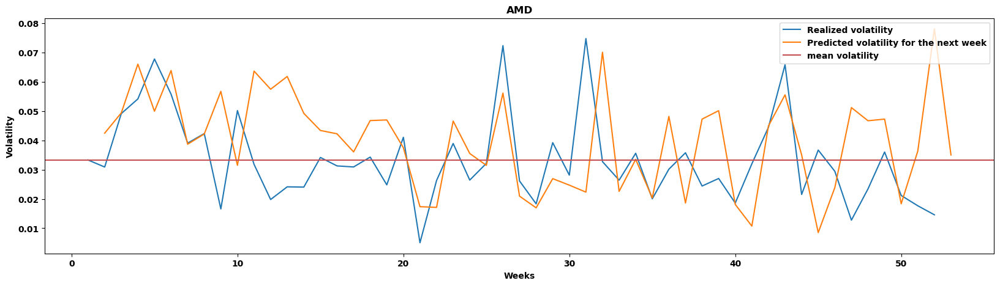

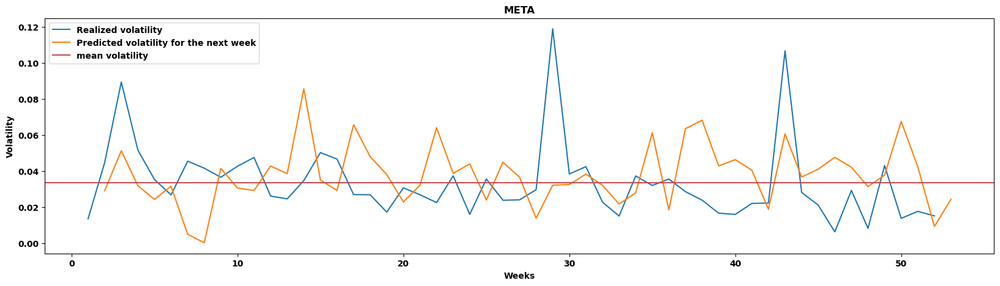

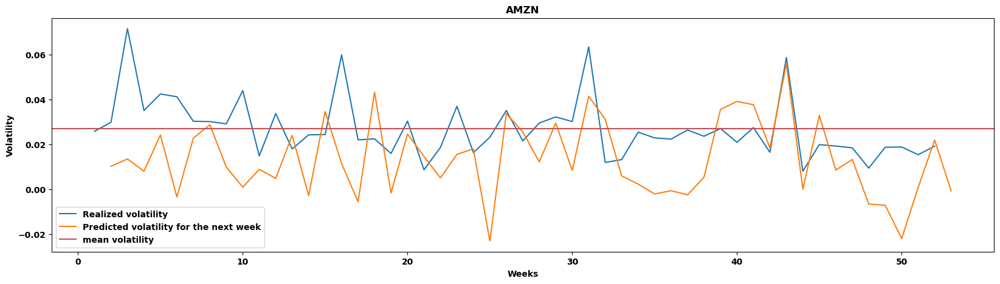

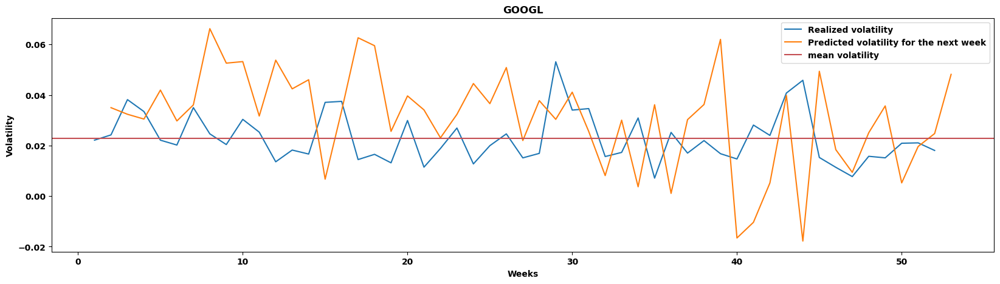

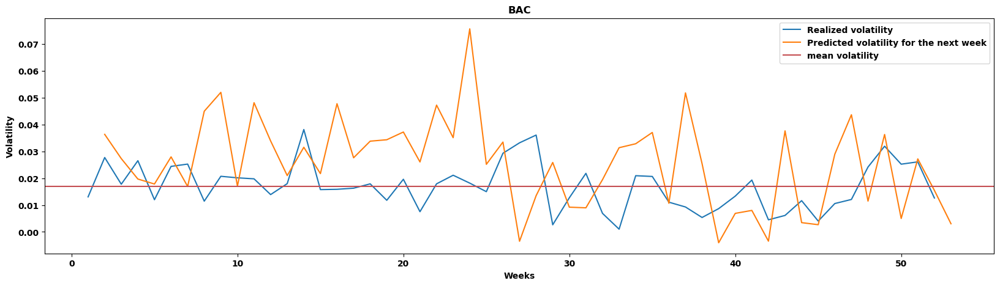

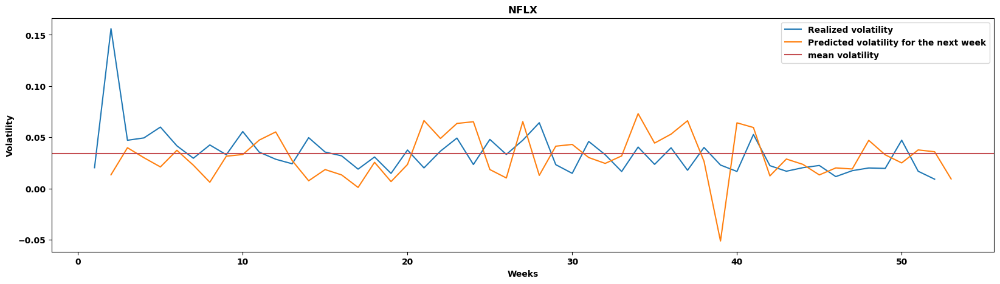

In [ ]:
# Predict in test and plot results
y_pred_test = model_2.predict(dataset_test)
mse_test = model_2.evaluate(dataset_test)
print('Test mean squared error:', round(mse_test[1], 6))
print('------------------------------------------------------')
df_pred_test_t1, df_pred_test_t2, df_pred_test_t3, df_pred_test_t4, dict_predictions = get_prediction_df(y_pred_test)
plot_predictions_for_t1(df_pred_test_t1)

Now, let's plot the prediction for all the 4 weeks that our model tried to predict. \
We did not plot the prediction for all the weeks because this would make our plots hard to visualize.

Again, the plots show that our model cannot even capture if the volatility is increasing or decreasing. \
So, let's try our third approach:
- Add information about the stock prices and returns.

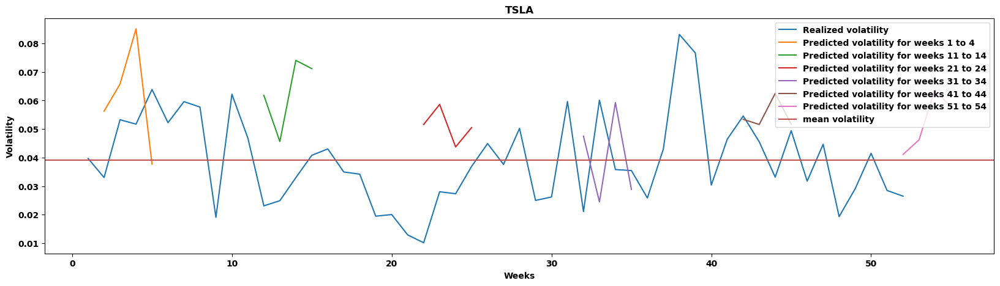

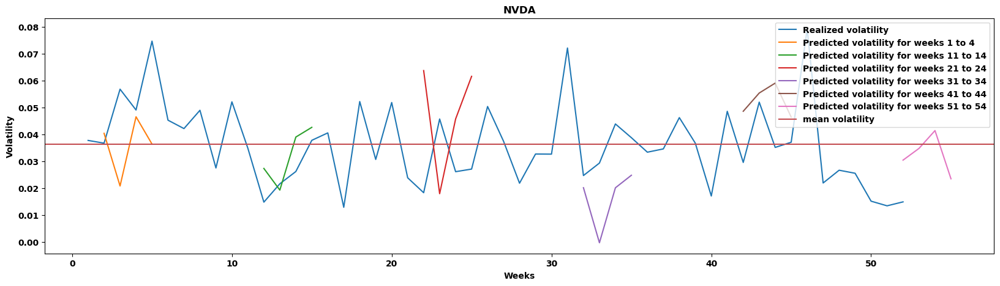

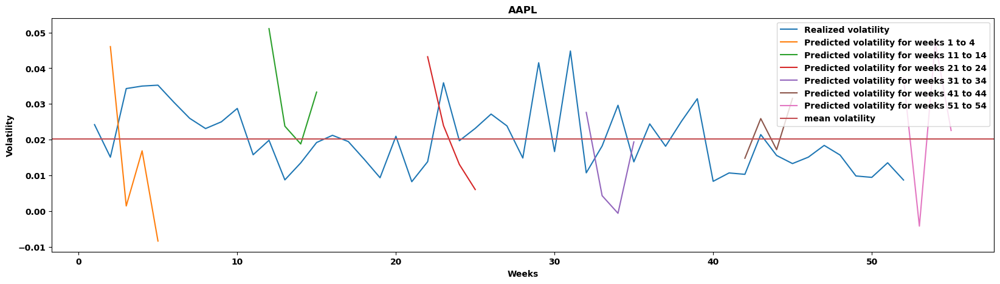

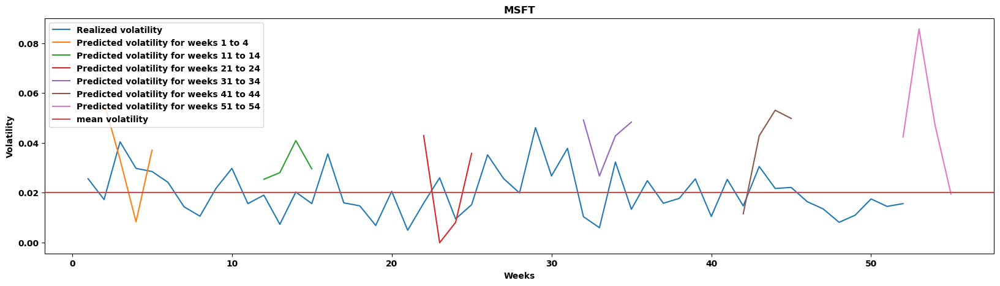

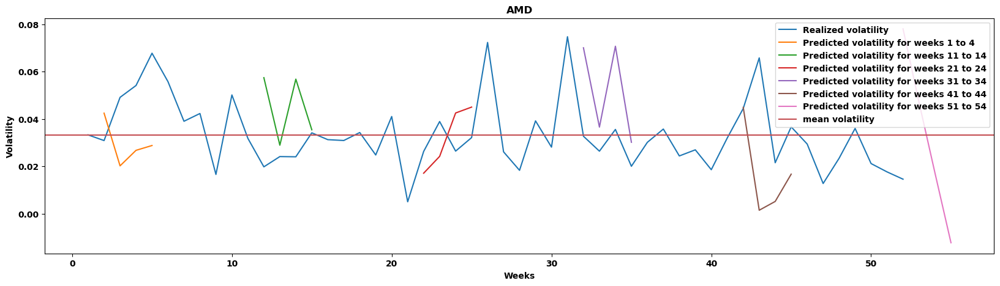

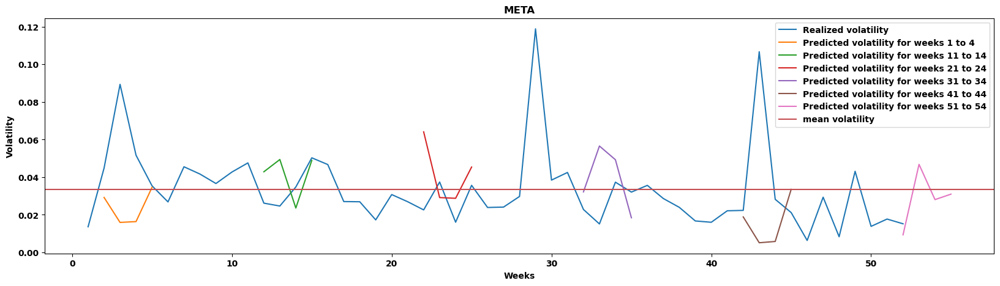

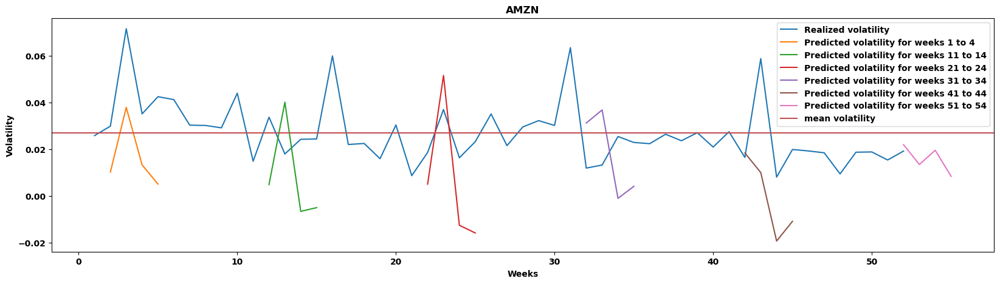

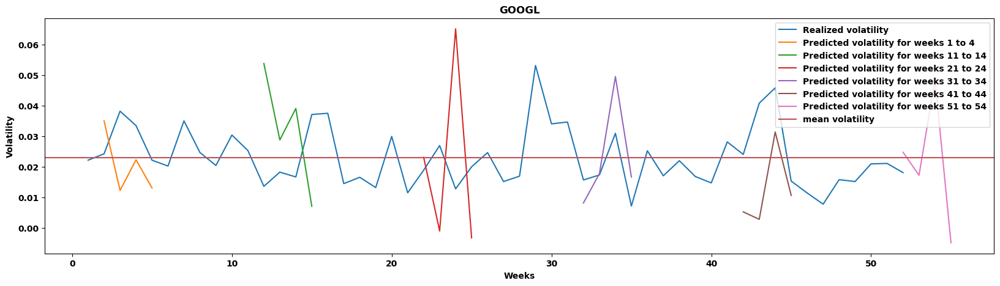

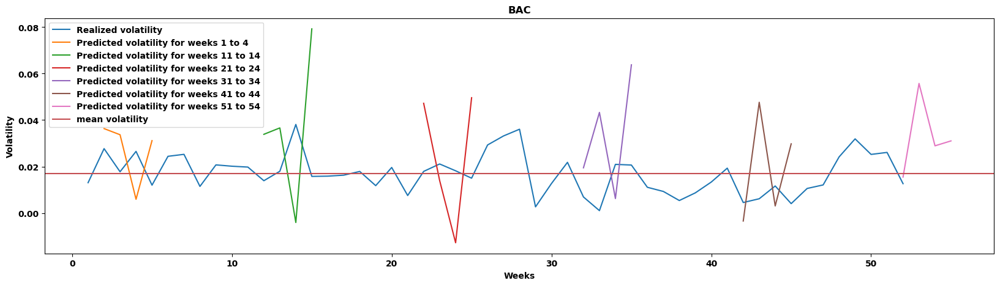

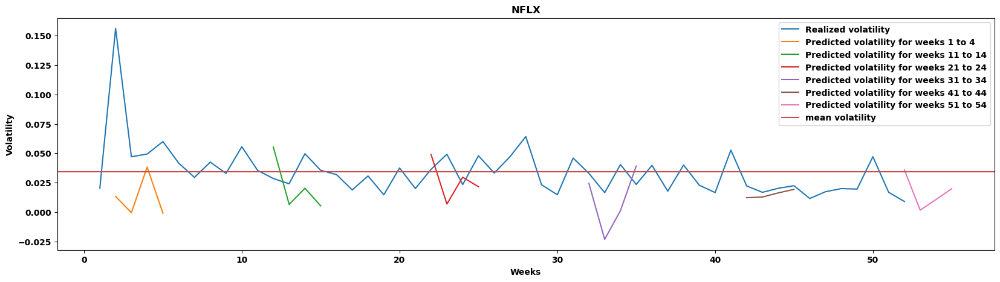

In [ ]:
plot_results(dict_predictions)

<div id='Model_3_adding_prices_and_returns' />

## Model 3:  Creating the final pipeline by adding prices and returns

This model is similar to Model 1 in that it is a combination of CNN and LSTM layers, but here we incorporated information about stock prices and returns so that the model has access to an additional context that could potentially help to identify patterns. Returns and volatility are often interrelated, and periods of high volatility are often accompanied by large price swings. Including these may allow the model to capture these interdependencies for better volatility predictions. It may also help the model identify a "regime shift", a new set of market conditions are patterns that are distinct from the previous regime. Macroeconomic events, policy changes, and new technology can all cause regime shifts. The Covid-19 pandemic can be considered a regime shift, which our training data covers.   

In [ ]:
# Add the prices in the volatility data set
df_volatility = df.copy()
df_return['date'] = df_return.index
df_return['date'] = pd.to_datetime(df_return['date'], utc=True)
df_return['First_day_week'] = df_return['date'] -  df_return['date'].dt.weekday * np.timedelta64(1, 'D')
df_return.drop_duplicates(subset =['First_day_week'] , keep = 'last', inplace = True)  # We want to keep only the last price of the week
df_return.index = df_return['First_day_week']

# Keep only the prices
price_cols = [col for col in df_return.columns if 'close_' in col]
df_volatility = df_volatility.merge(df_return[price_cols], how = 'left', left_index = True, right_index = True)

# Calculate the weekly returns.
for stock in df.columns:
    df_volatility['return_' + stock] = df_volatility['close_' + stock].pct_change()
    df_volatility.drop('close_' + stock, axis = 1, inplace = True)
    
# Drop first row
df_volatility = df_volatility[1:]

In [ ]:
# Recreate our design matrix
X_LEN = 52
Y_LEN = 4

x = []
y_aux = []
for i in range(X_LEN, len(df_volatility) - Y_LEN + 1): 
    X = df_volatility[i - X_LEN : i].values
    Y = df[i : i + Y_LEN].values   # Our Y uses the data set df that has only volatility information
    x.append(X)
    y_aux.append(Y)

# Each observtion of 'y' has 4 vectors. The first one express the stocks' volatility for the next period. 
# The second one express the stocks' volatility for the second period, and so on.
# Therefore, we will flatten these vector so our neural netwoork can model all these volatilities at the same time. 
y = [] 
for e in y_aux: 
    y.append(e.flatten())
    
n_stocks = len(x[0][0])/2
print(f'The matrix has {len(x)} observations. This number should be quantity of rows in df (535) minus X_LEN (52) minus Y_LEN (4) plus 1, resulting in 480.')
print(f'Verify if each observation is reading only 52 weeks. Length of x[0]: {len(x[0])}')
print(f'Quantity of different stocks: {n_stocks}')
print(f'Verify if each observation is reading only 4 weeks to predict: {len(y[0])}. This value is quantity of stocks (10) times weeks to predict (4), resulting in 40')

The matrix has 479 observations. This number should be quantity of rows in df (535) minus X_LEN (52) minus Y_LEN (4) plus 1, resulting in 480.
Verify if each observation is reading only 52 weeks. Length of x[0]: 52
Quantity of different stocks: 10.0
Verify if each observation is reading only 4 weeks to predict: 40. This value is quantity of stocks (10) times weeks to predict (4), resulting in 40


In [ ]:
# Separate in train, validation and test.
TEST_SIZE = 52
# Test
x_test = x[len(x) - TEST_SIZE : len(x)]
y_test = y[len(x) - TEST_SIZE : len(x)]
# Train full. Once the hyperparameters have been defined, we can train the model in this dataset.
x_train_full = x[0 : len(x) - TEST_SIZE]
y_train_full = y[0 : len(x) - TEST_SIZE]
# Validation
x_val = x_train_full[len(x_train_full) - TEST_SIZE : len(x_train_full)]
y_val = y_train_full[len(x_train_full) - TEST_SIZE : len(x_train_full)]
# Train
x_train = x_train_full[0 : len(x_train_full) - TEST_SIZE]
y_train = y_train_full[0 : len(x_train_full) - TEST_SIZE]

# Transform into TensorFlow datasets
dataset_test = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(batch_size = 32)
dataset_train_full = tf.data.Dataset.from_tensor_slices((x_train_full, y_train_full)).batch(batch_size = 32)
dataset_val = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(batch_size = 32)
dataset_train = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(batch_size = 32)

# check the dataset
print('Test')
for x, y in dataset_test.take(1):
    print("x_test shape:", x.shape)
    print("y_test shape:", y.shape)
print('---------------------------')
print('Train full')
for x, y in dataset_train_full.take(1):
    print("x_train_full shape:", x.shape)
    print("y_train_full shape:", y.shape)
print('---------------------------')
print('Validation')
for x, y in dataset_val.take(1):
    print("x_val shape:", x.shape)
    print("y_val shape:", y.shape) 
print('---------------------------')
print('Train')
for x, y in dataset_train.take(1):
    print("x_train shape:", x.shape)
    print("y_train shape:", y.shape) 

Test
x_test shape: (32, 52, 20)
y_test shape: (32, 40)
---------------------------
Train full
x_train_full shape: (32, 52, 20)
y_train_full shape: (32, 40)
---------------------------
Validation
x_val shape: (32, 52, 20)
y_val shape: (32, 40)
---------------------------
Train
x_train shape: (32, 52, 20)
y_train shape: (32, 40)


In [ ]:
# Model 3
def create_model_3(X_LEN = X_LEN, Y_LEN = Y_LEN, n_stocks = n_stocks, CNN_filter = 32, LSTM_units = 64, CNN_layers = 4, LSTM_layers = 2, lr = 0.001, loss = tf.keras.losses.Huber()):
    tf.keras.backend.clear_session()
    
    # Layers using only the volatility
    inputs = keras.layers.Input(shape = (X_LEN, int(2*n_stocks)))
    
    CNN = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 2, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN)
    X = keras.layers.Activation('relu')(X)
    MAX = keras.layers.MaxPool1D(pool_size = 2, strides = 1, padding = 'same')(X)
    AVE = keras.layers.AveragePooling1D(pool_size = 2, strides = 1, padding = 'same')(X)
    ADD = keras.layers.Add()([MAX, AVE])
        
    for i in range(1, CNN_layers):
        CNN = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 2*(i + 1), strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
        X = keras.layers.BatchNormalization()(CNN)
        X = keras.layers.Activation('relu')(X)
        MAX = keras.layers.MaxPool1D(pool_size = 2*(i + 1), strides = 1, padding = 'same')(X)
        AVE = keras.layers.AveragePooling1D(pool_size = 2*(i + 1), strides = 1, padding = 'same')(X)
        ADD = keras.layers.Add()([ADD, MAX, AVE])
    
    
    LSTM = keras.layers.LSTM(units = LSTM_units, return_sequences = True)(ADD)
    ADD = LSTM
    for i in range(1, LSTM_layers):
        if i < (LSTM_layers - 1):
            LSTM = keras.layers.LSTM(units = LSTM_units, return_sequences = True)(ADD)
        else:
            LSTM = keras.layers.LSTM(units = LSTM_units, return_sequences = False)(ADD)
        ADD = keras.layers.Add()([ADD, LSTM])
    
    outputs = keras.layers.Dense(units = (Y_LEN * n_stocks), activation = 'linear', name = 'output')(LSTM)
    
    model = keras.models.Model(inputs = inputs, outputs = outputs)
    model.compile(loss = tf.keras.losses.Huber(),
                  optimizer = keras.optimizers.Adam(learning_rate = lr),
                  metrics = ['mse'],
                 )

    return model

model_3 = create_model_3(CNN_filter = 32, LSTM_units = 64, CNN_layers = 4, LSTM_layers = 2, lr = 0.001, loss = tf.keras.losses.Huber())
model_3.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 52, 20)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 52, 32)       1312        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 52, 32)      128         ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 conv1d_1 (Conv1D)              (None, 52, 32)       2592        ['input_1[0][0]']            

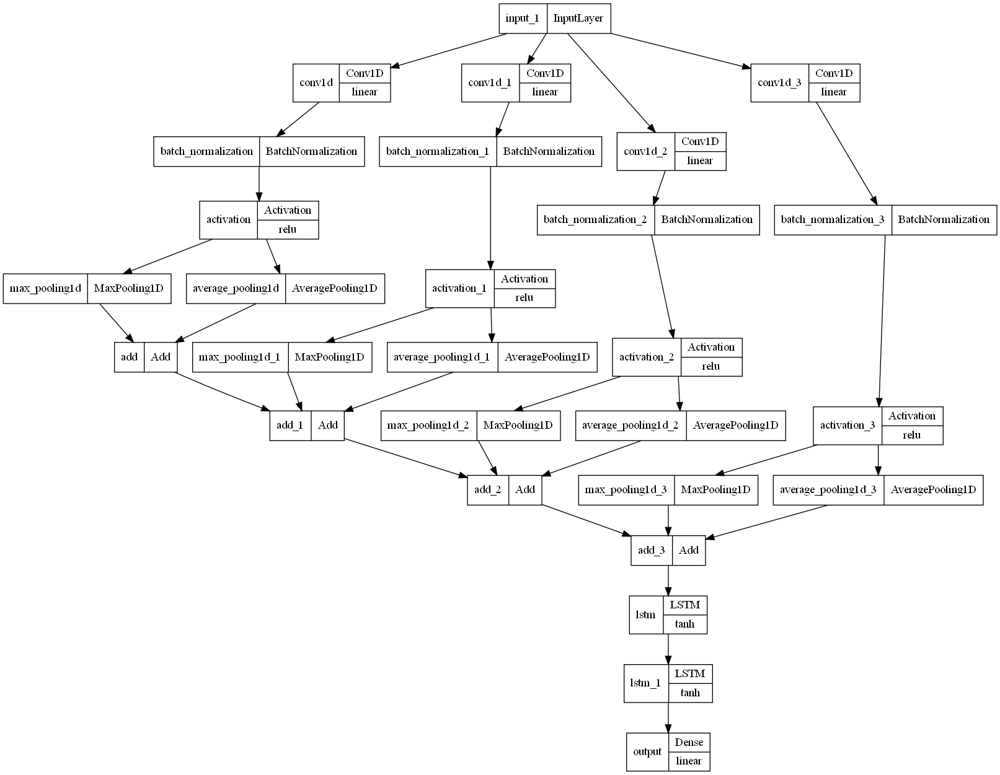

In [ ]:
keras.utils.plot_model(model_3, show_layer_activations=True)

In [ ]:
# Train model
start = time.time()
model_3 = create_model_3()
epochs = 200
model_3_history = model_3.fit(dataset_train, batch_size = 32
                                    , validation_data = dataset_val
                                    , epochs = epochs
                                    , verbose = 1
                                    , workers = -1
                                    , use_multiprocessing = True)

end = time.time()
model_3_time = (end - start)
print(f'Run time in minutes: {model_3_time/60:.2f}')

Epoch 1/200
12/12 [==============================] - 9s 152ms/step - loss: 0.0067 - mse: 0.0134 - val_loss: 0.0020 - val_mse: 0.0040
Epoch 2/200
12/12 [==============================] - 1s 52ms/step - loss: 0.0011 - mse: 0.0021 - val_loss: 0.0016 - val_mse: 0.0031
Epoch 3/200
12/12 [==============================] - 1s 52ms/step - loss: 5.0836e-04 - mse: 0.0010 - val_loss: 0.0015 - val_mse: 0.0031
Epoch 4/200
12/12 [==============================] - 1s 50ms/step - loss: 3.7324e-04 - mse: 7.4648e-04 - val_loss: 0.0016 - val_mse: 0.0032
Epoch 5/200
12/12 [==============================] - 1s 51ms/step - loss: 2.8475e-04 - mse: 5.6950e-04 - val_loss: 0.0015 - val_mse: 0.0030
Epoch 6/200
12/12 [==============================] - 1s 51ms/step - loss: 2.4979e-04 - mse: 4.9957e-04 - val_loss: 0.0014 - val_mse: 0.0029
Epoch 7/200
12/12 [==============================] - 1s 50ms/step - loss: 2.2968e-04 - mse: 4.5936e-04 - val_loss: 0.0014 - val_mse: 0.0028
Epoch 8/200
12/12 [====================

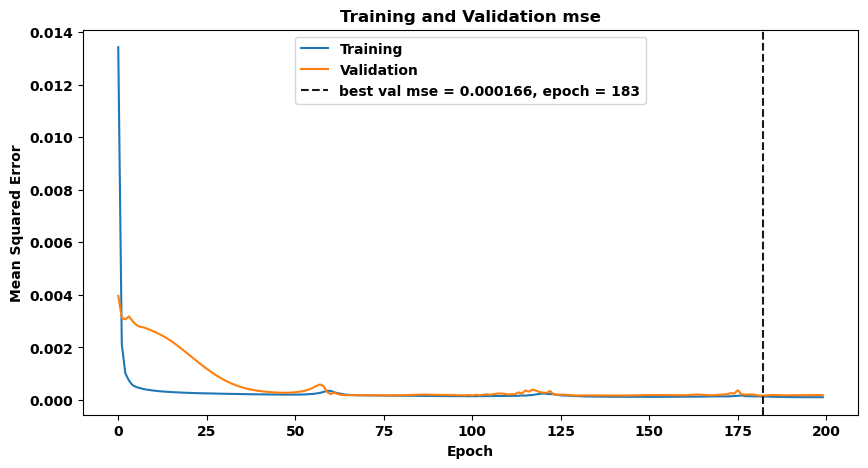

In [ ]:
# Plot the training and validation history
best_epoch, best_mse = plot_train_val_metric(model_3_history, 'mse', ylabel = 'Mean Squared Error')

In [ ]:
# Train the model with the full trainning dataset to verify the performance in our test dataset.
model_3 = create_model_3()
epochs = best_epoch
model_3_test_history = model_3.fit(dataset_train_full, batch_size = 32
                                    , epochs = epochs
                                    , verbose = 0
                                    , workers = -1
                                    , use_multiprocessing = True)

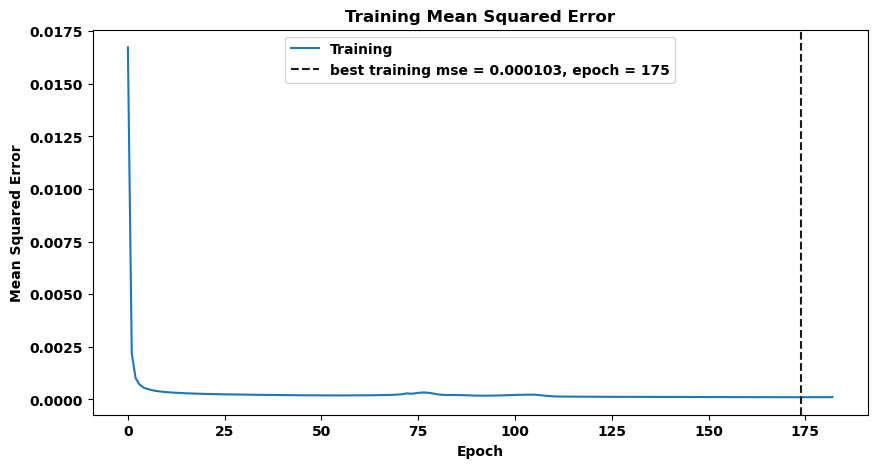

In [ ]:
# Plot training history
plot_train_metric(model_3_test_history, 'mse', ylabel = 'Mean Squared Error')

First, let's compare the prediction of our model for only one week ahead.
After, we will select just a few weeks and verify the predictions for the next 4 weeks.

The training and validation error decreased a little, compared to our previous model. Unfortunately, the test error got worse. \
However, this may indicate that this model is just overfitting. If this is the case, the problem can be fixed using a dropout layer.

2/2 [==============================] - 1s 23ms/step - loss: 0.0029 - mse: 0.0058
Test mean squared error: 0.005768
------------------------------------------------------


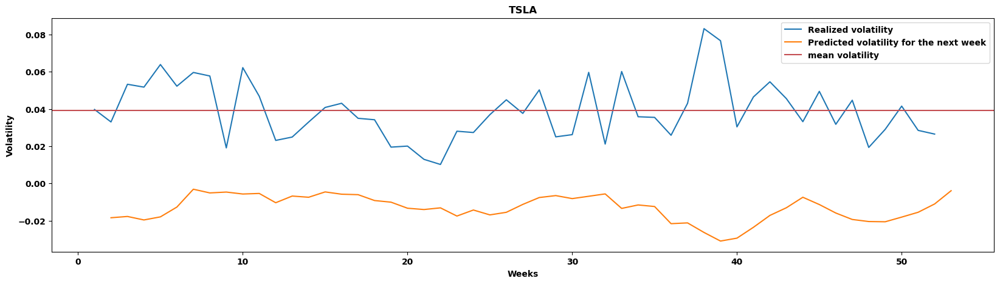

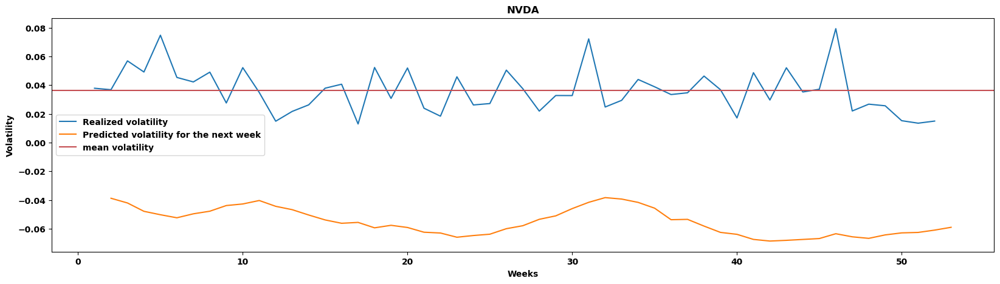

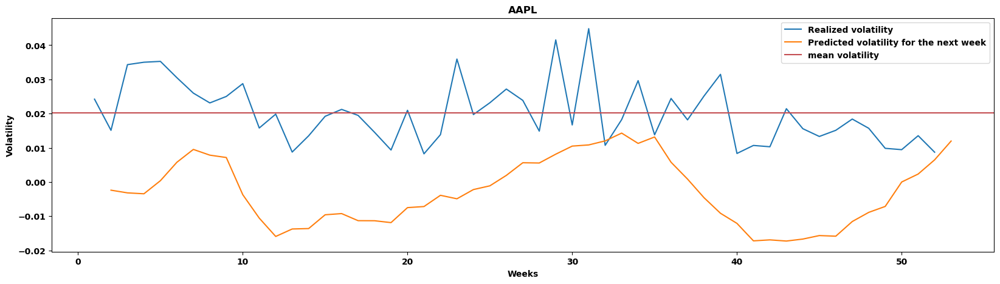

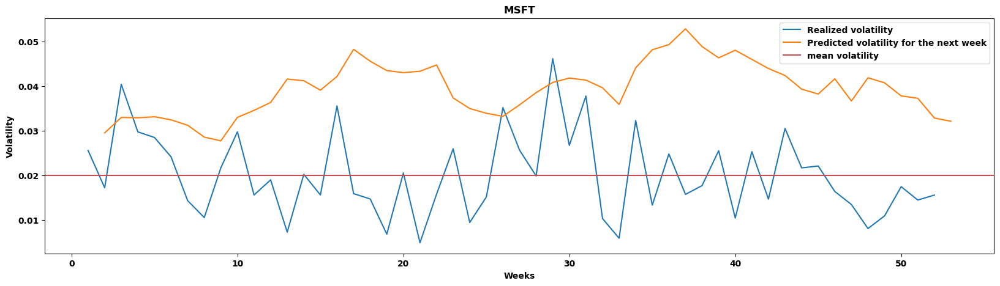

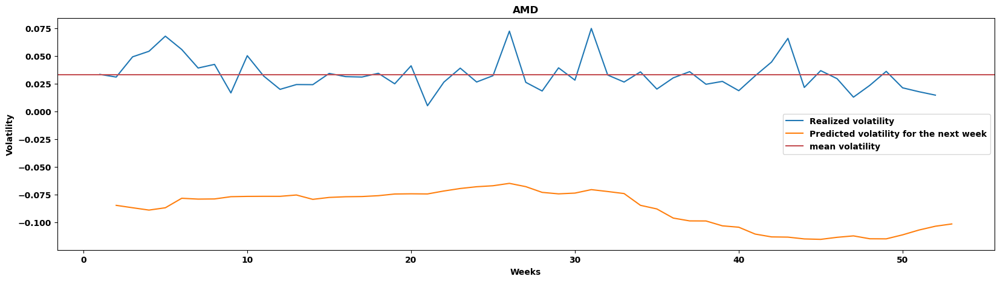

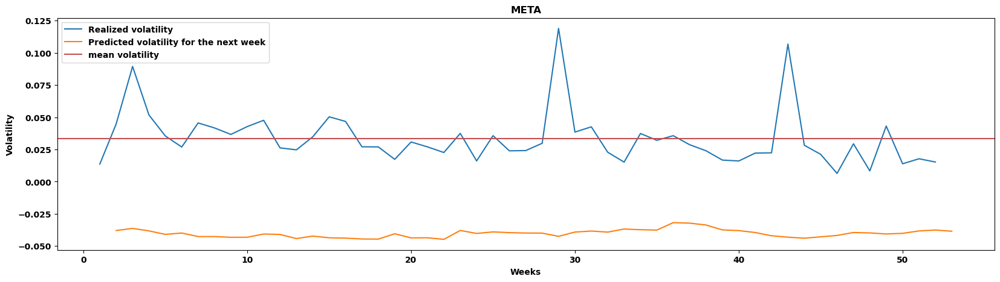

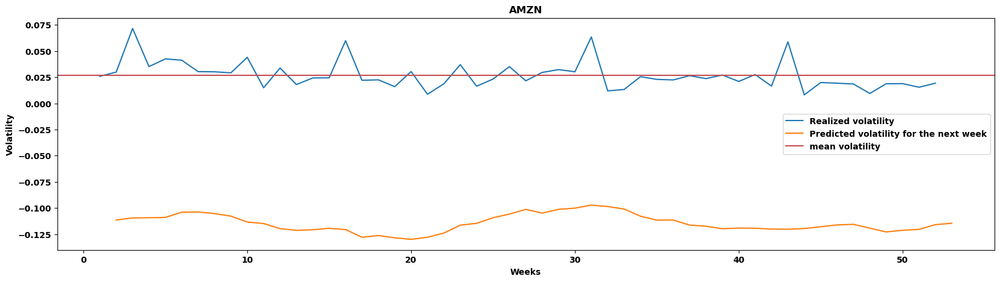

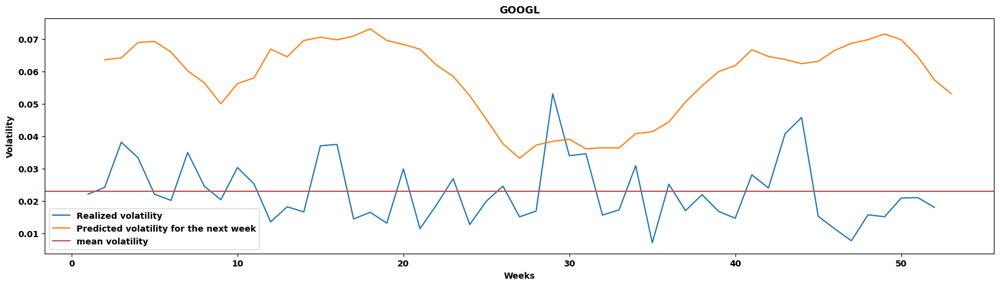

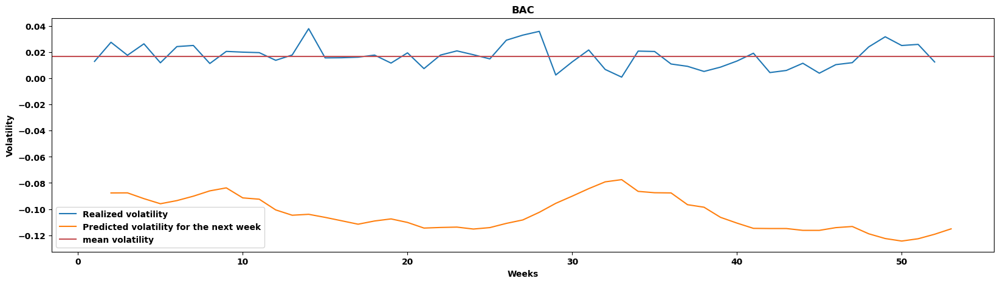

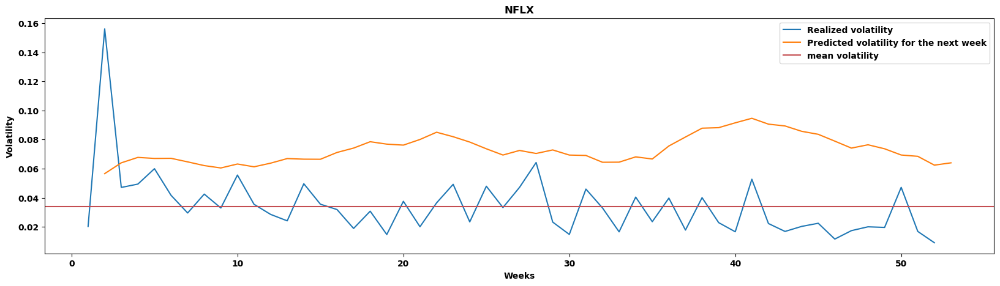

In [ ]:
# Predict in test and plot results
y_pred_test = model_3.predict(dataset_test)
mse_test = model_3.evaluate(dataset_test)
print('Test mean squared error:', round(mse_test[1], 6))
print('------------------------------------------------------')
df_pred_test_t1, df_pred_test_t2, df_pred_test_t3, df_pred_test_t4, dict_predictions = get_prediction_df(y_pred_test)
plot_predictions_for_t1(df_pred_test_t1)

Now, let's plot the prediction for all the 4 weeks that our model tried to predict. \
We did not plot the prediction for all the weeks because this would make our plots hard to visualize.

Some movements were captured by this model, but this result is far from being useful in a real-life situation.

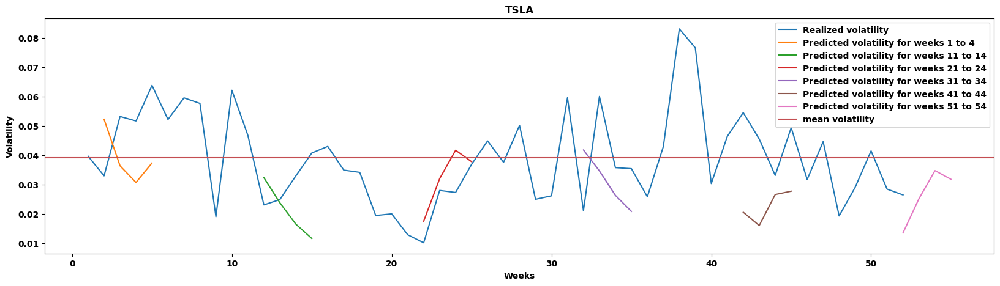

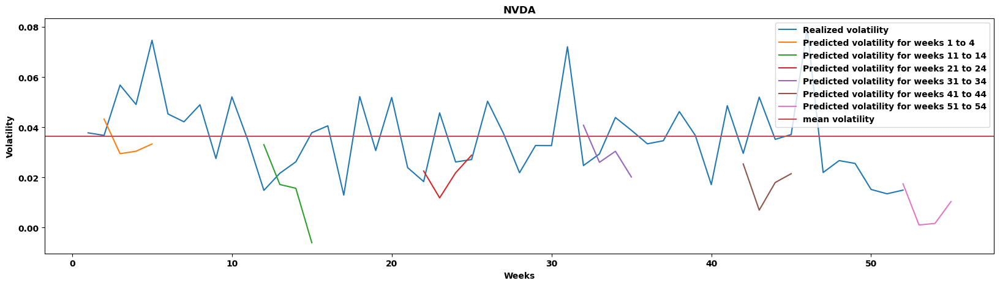

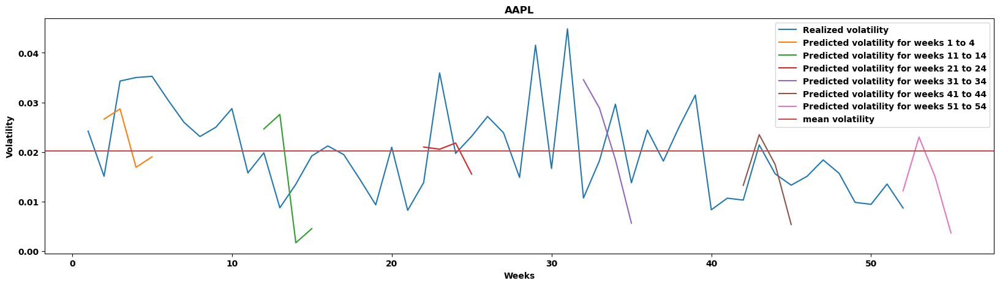

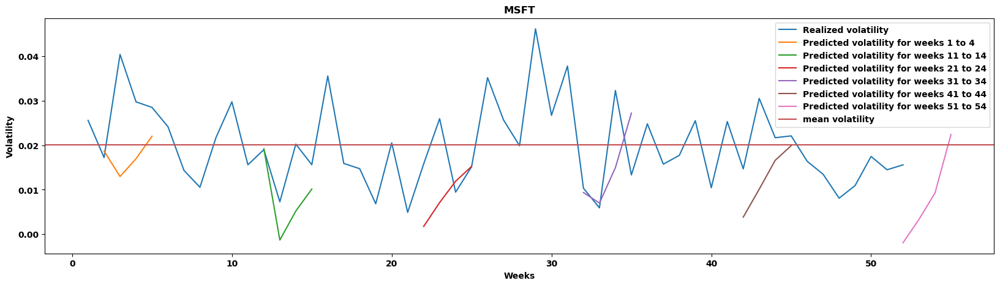

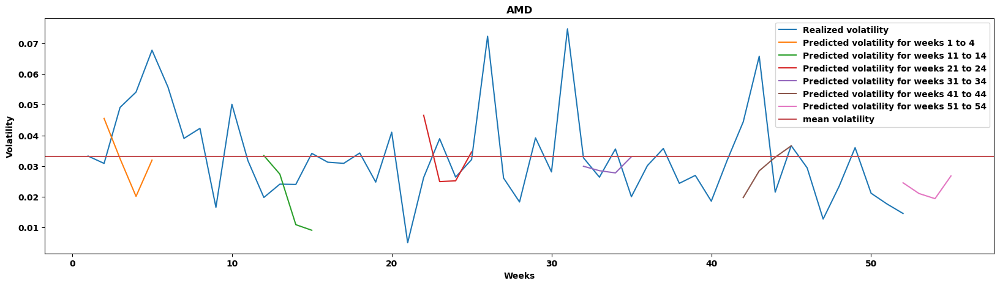

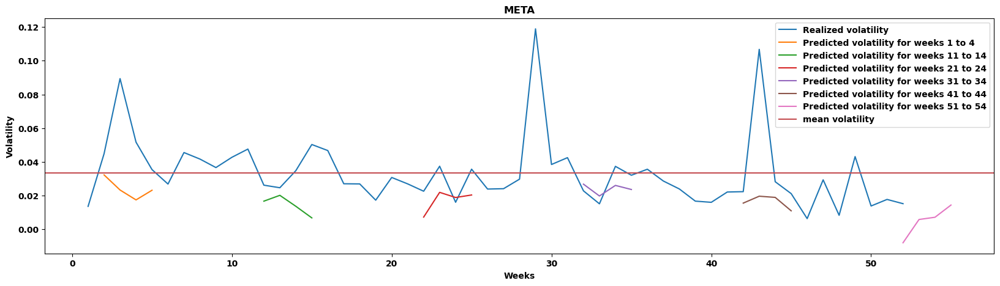

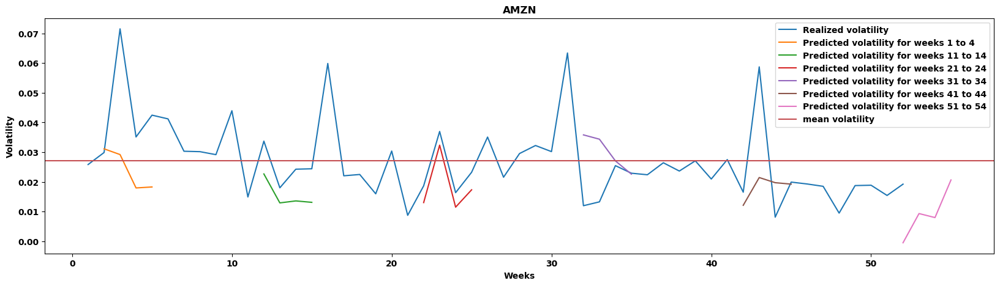

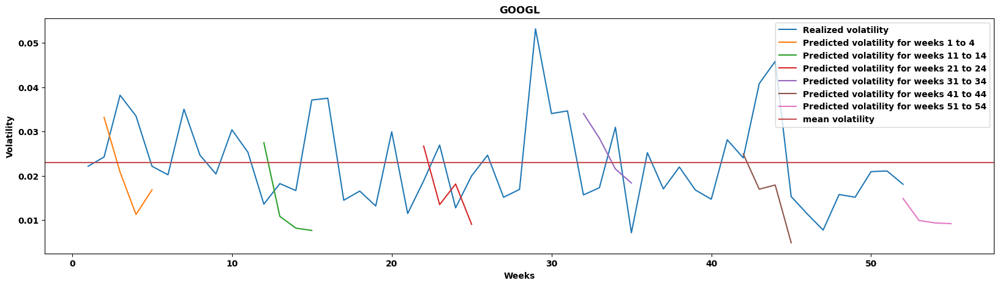

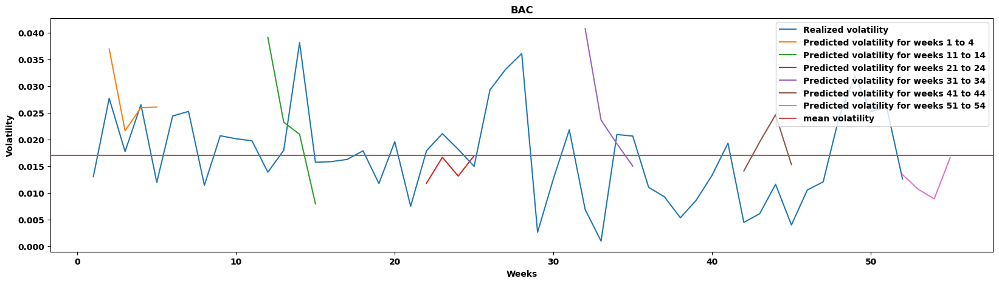

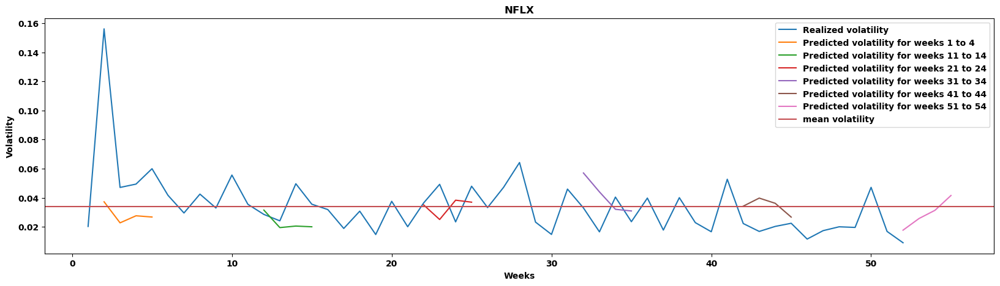

In [ ]:
plot_results(dict_predictions)

<div id='hyper_parametrization' />

## Final pipeline, hyperparametrization
After attempting different model architectures to address the issues in the baseline model, we have built pipelines to do hyperparameter tuning to improve our results. Given the benefits that including information about prices and returns brought to performance, we will continue our work using Model 3, a recurrent LSTM model, to continue our experiments. We added a dropout layer in this model because we realized that the model was overfitting in the training and validation data set. 

Now that we already have our final pipeline, we must do some hyper parameterization. \
We will test:
- different loss functions: mean squared error, mean absolute error, and hubber loss;
- the number of LSTM layers;
- the number of CNN layers;
- the number of LSTM units;
- the number of CNN units;
- different dropout rates;
- different learning rates.

In [ ]:
# Model 3 - Final
def create_model_3(X_LEN = X_LEN, Y_LEN = Y_LEN, n_stocks = n_stocks, CNN_filter = 32, LSTM_units = 64, CNN_layers = 4, LSTM_layers = 2, lr = 0.001, loss = tf.keras.losses.Huber(), dropout_rate = 0.25):
    tf.keras.backend.clear_session()
    
    # Layers using only the volatility
    inputs = keras.layers.Input(shape = (X_LEN, int(2*n_stocks)))
    
    CNN = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 2, strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
    X = keras.layers.BatchNormalization()(CNN)
    X = keras.layers.Activation('relu')(X)
    MAX = keras.layers.MaxPool1D(pool_size = 2, strides = 1, padding = 'same')(X)
    AVE = keras.layers.AveragePooling1D(pool_size = 2, strides = 1, padding = 'same')(X)
    ADD = keras.layers.Add()([MAX, AVE])
        
    for i in range(1, CNN_layers):
        CNN = keras.layers.Conv1D(filters = CNN_filter, kernel_size = 2*(i + 1), strides = 1
                                , padding = 'causal' # "causal" results in causal (dilated) convolutions, e.g. output[t] does not depend on input[t+1:]. Useful when modeling temporal data where the model should not violate the temporal order.
                                )(inputs)
        X = keras.layers.BatchNormalization()(CNN)
        X = keras.layers.Activation('relu')(X)
        MAX = keras.layers.MaxPool1D(pool_size = 2*(i + 1), strides = 1, padding = 'same')(X)
        AVE = keras.layers.AveragePooling1D(pool_size = 2*(i + 1), strides = 1, padding = 'same')(X)
        ADD = keras.layers.Add()([ADD, MAX, AVE])
    
    
    LSTM = keras.layers.LSTM(units = LSTM_units, return_sequences = True)(ADD)
    ADD = LSTM
    for i in range(1, LSTM_layers):
        if i < (LSTM_layers - 1):
            LSTM = keras.layers.LSTM(units = LSTM_units, return_sequences = True)(ADD)
        else:
            LSTM = keras.layers.LSTM(units = LSTM_units, return_sequences = False)(ADD)
        ADD = keras.layers.Add()([ADD, LSTM])
    
    X =  keras.layers.Dense(units = 80, activation = 'relu')(LSTM)
    X = keras.layers.Dropout(dropout_rate)(X)   # When analyzed on the test set, we realized that the model was overfitting. Therefore, we added this dropout layer.
    
    outputs = keras.layers.Dense(units = (Y_LEN * n_stocks), activation = 'linear', name = 'output')(X)
    
    model = keras.models.Model(inputs = inputs, outputs = outputs)
    model.compile(loss = tf.keras.losses.Huber(),
                  optimizer = keras.optimizers.Adam(learning_rate = lr),
                  metrics = ['mse'],
                 )

    return model

model_3 = create_model_3(CNN_filter = 32, LSTM_units = 64, CNN_layers = 4, LSTM_layers = 2, lr = 0.001, loss = tf.keras.losses.Huber(), dropout_rate = 0.25)
model_3.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 52, 20)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 52, 32)       1312        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 52, 32)      128         ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 conv1d_1 (Conv1D)              (None, 52, 32)       2592        ['input_1[0][0]']            

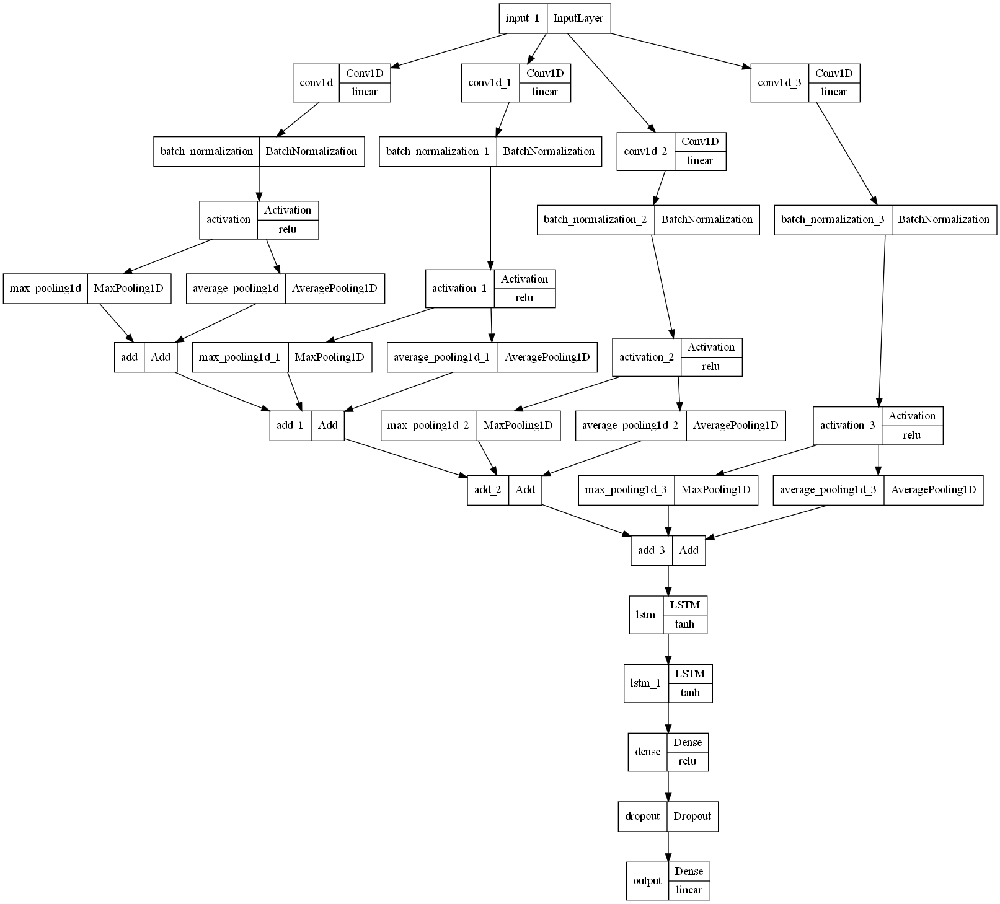

In [ ]:
keras.utils.plot_model(model_3, show_layer_activations=True)

In [ ]:
# Test loss function
losses = [tf.keras.losses.Huber(), tf.keras.losses.MeanSquaredError(), tf.keras.losses.MeanAbsoluteError()]
best_metric = []
for ls in tqdm.tqdm(losses):
    model = create_model_3(CNN_filter = 32, LSTM_units = 64, CNN_layers = 4, LSTM_layers = 2, lr = 0.001, loss = ls, dropout_rate = 0.25)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(['Hubber', 'MSE', 'MAE'], best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_loss_function = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_loss_function}')
df_metrics

100%|██████████| 3/3 [06:08<00:00, 122.90s/it]

The lowest mean squared error occurs when the this hyperparameter is Hubber


,mse
hyperparameter,
Hubber,0.000129
MSE,0.000137
MAE,0.000145


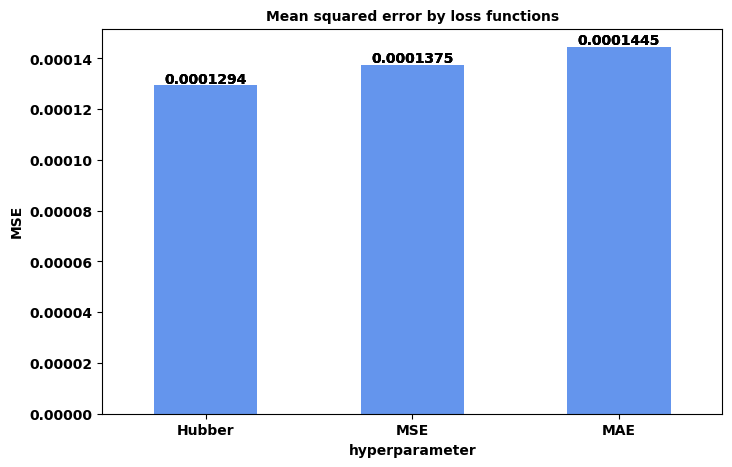

In [ ]:
title = 'Mean squared error by loss functions'

ax = df_metrics.plot(kind = 'bar', width = 0.5, align = 'center', rot = 0, color = 'cornflowerblue', edgecolor = None, figsize = (8, 5))
ax.get_legend().remove()
total = 0
for bars in ax.patches:
    total += bars.get_height()
       
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        ax.annotate(f'{height:.4}'
                    , (x + width/2, y + height + 0.000001)
                    , ha = 'center')
        plt.title(title, fontsize = 10)
    ax.set_ylabel('MSE')
plt.show()
plt.close()

In [ ]:
# LSTM_layers
hyperparameters = [2, 3, 4, 5, 6]
best_metric = []
for e in tqdm.tqdm(hyperparameters):
    model = create_model_3(CNN_filter = 32, LSTM_units = 64, CNN_layers = 4, LSTM_layers = e, lr = 0.001, loss = best_loss_function, dropout_rate = 0.25)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(hyperparameters, best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_LSTM_layers = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_LSTM_layers}')
df_metrics

100%|██████████| 5/5 [17:12<00:00, 206.44s/it]

The lowest mean squared error occurs when the this hyperparameter is 3


,mse
hyperparameter,
2,0.000142
3,0.000140
4,0.000156
5,0.000149
6,0.000156


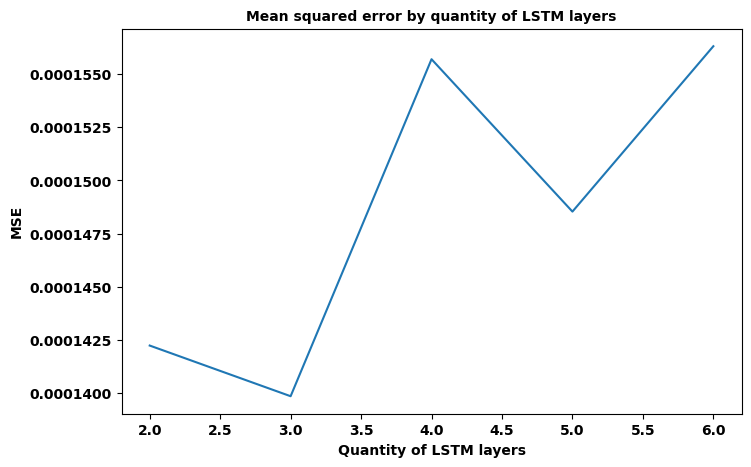

In [ ]:
title = 'Mean squared error by quantity of LSTM layers'

plt.figure(figsize = (8, 5))
plt.plot(df_metrics.index, df_metrics.mse)
plt.xlabel('Quantity of LSTM layers')
plt.ylabel('MSE')
plt.title(title, fontsize = 10)
plt.show()
plt.close()

In [ ]:
# CNN_layers
hyperparameters = [2, 3, 4, 5, 6]
best_metric = []
for e in tqdm.tqdm(hyperparameters):
    model = create_model_3(CNN_filter = 32, LSTM_units = 64, CNN_layers = e, LSTM_layers = best_LSTM_layers, lr = 0.001, loss = best_loss_function, dropout_rate = 0.25)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(hyperparameters, best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_CNN_layers = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_CNN_layers}')
df_metrics


100%|██████████| 5/5 [13:54<00:00, 166.89s/it]

The lowest mean squared error occurs when the this hyperparameter is 3


,mse
hyperparameter,
2,0.000152
3,0.000131
4,0.000148
5,0.000145
6,0.000142


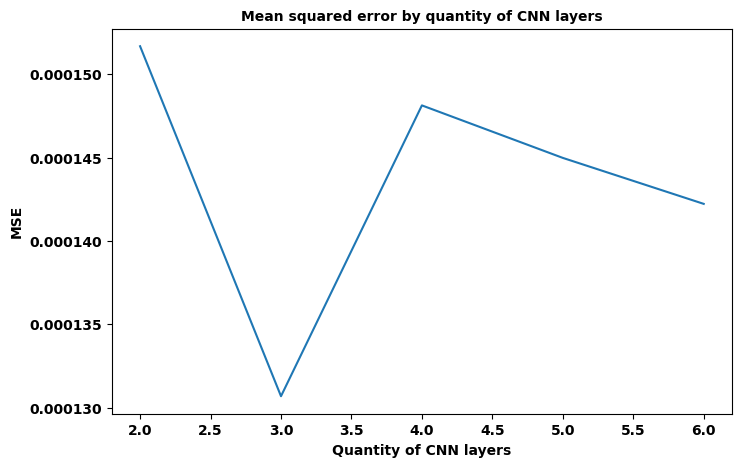

In [ ]:
title = 'Mean squared error by quantity of CNN layers'

plt.figure(figsize = (8, 5))
plt.plot(df_metrics.index, df_metrics.mse)
plt.xlabel('Quantity of CNN layers')
plt.ylabel('MSE')
plt.title(title, fontsize = 10)
plt.show()
plt.close()

In [ ]:
# LSTM_units
hyperparameters = [8, 16, 32, 64, 128]
best_metric = []
for e in tqdm.tqdm(hyperparameters):
    model = create_model_3(CNN_filter = 32, LSTM_units = e, CNN_layers = best_CNN_layers, LSTM_layers = best_LSTM_layers, lr = 0.001, loss = best_loss_function, dropout_rate = 0.25)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(hyperparameters, best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_LSTM_units = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_LSTM_units}')
print(f'The lowest mean squared error occurs when the this hyperparameter is {df_metrics.idxmin().mse}')
df_metrics

100%|██████████| 5/5 [16:33<00:00, 198.80s/it]

The lowest mean squared error occurs when the this hyperparameter is 16
The lowest mean squared error occurs when the this hyperparameter is 16


,mse
hyperparameter,
8,0.000143
16,0.000136
32,0.000141
64,0.000142
128,0.000156


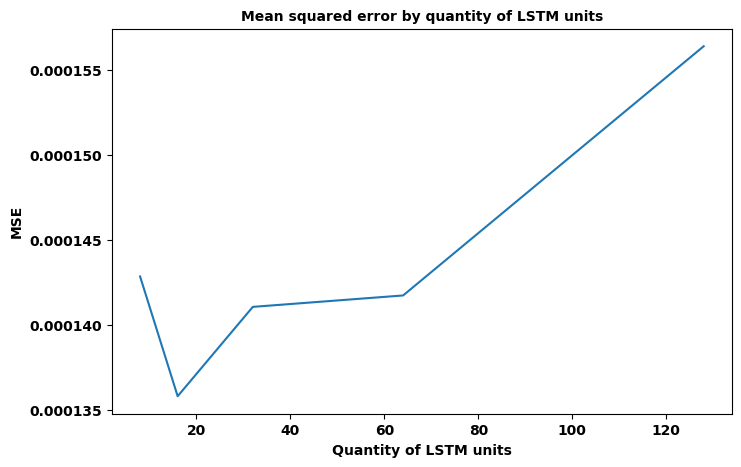

In [ ]:
title = 'Mean squared error by quantity of LSTM units'

plt.figure(figsize = (8, 5))
plt.plot(df_metrics.index, df_metrics.mse)
plt.xlabel('Quantity of LSTM units')
plt.ylabel('MSE')
plt.title(title, fontsize = 10)
plt.show()
plt.close()

In [ ]:
# CNN_filter
hyperparameters = [8, 16, 32, 64, 128]
best_metric = []
for e in tqdm.tqdm(hyperparameters):
    model = create_model_3(CNN_filter = e, LSTM_units = best_LSTM_units, CNN_layers = best_CNN_layers, LSTM_layers = best_LSTM_layers, lr = 0.001, loss = best_loss_function, dropout_rate = 0.25)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(hyperparameters, best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_CNN_filter = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_CNN_filter}')
df_metrics

100%|██████████| 5/5 [10:25<00:00, 125.14s/it]

The lowest mean squared error occurs when the this hyperparameter is 8


,mse
hyperparameter,
8,0.000138
16,0.000150
32,0.000160
64,0.000143
128,0.000144


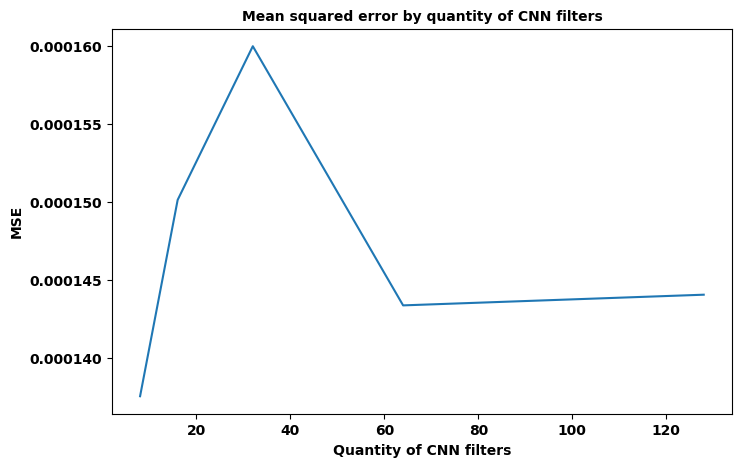

In [ ]:
title = 'Mean squared error by quantity of CNN filters'

plt.figure(figsize = (8, 5))
plt.plot(df_metrics.index, df_metrics.mse)
plt.xlabel('Quantity of CNN filters')
plt.ylabel('MSE')
plt.title(title, fontsize = 10)
plt.show()
plt.close()

In [ ]:
# Dropout rate
hyperparameters = [0.05, 0.15, 0.25, 0.35, 0.50]
best_metric = []
for e in tqdm.tqdm(hyperparameters):
    model = create_model_3(CNN_filter = best_CNN_filter, LSTM_units = best_LSTM_units, CNN_layers = best_CNN_layers, LSTM_layers = best_LSTM_layers, lr = 0.001, loss = best_loss_function, dropout_rate = e)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(hyperparameters, best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_dropout_rate = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_dropout_rate}')
df_metrics

100%|██████████| 5/5 [09:07<00:00, 109.44s/it]

The lowest mean squared error occurs when the this hyperparameter is 0.5


,mse
hyperparameter,
0.05,0.000156
0.15,0.000138
0.25,0.000142
0.35,0.000154
0.50,0.000126


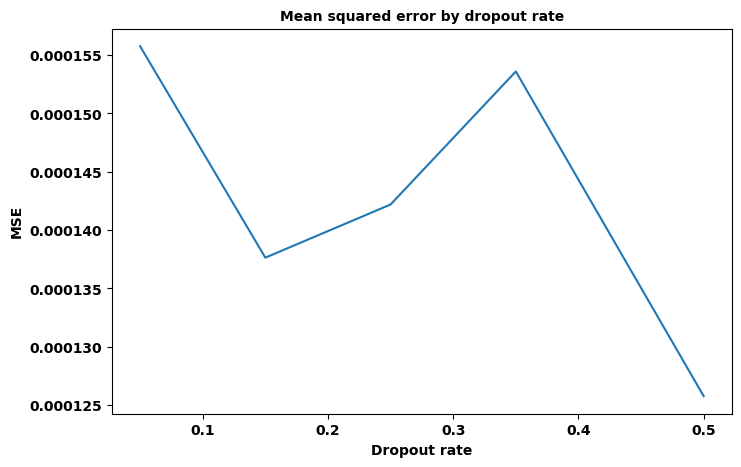

In [ ]:
title = 'Mean squared error by dropout rate'

plt.figure(figsize = (8, 5))
plt.plot(df_metrics.index, df_metrics.mse)
plt.xlabel('Dropout rate')
plt.ylabel('MSE')
plt.title(title, fontsize = 10)
plt.show()
plt.close()

In [ ]:
# Learning rate
hyperparameters = [0.00001, 0.0001, 0.001, 0.01]
best_metric = []
for e in tqdm.tqdm(hyperparameters):
    model = create_model_3(CNN_filter = best_CNN_filter, LSTM_units = best_LSTM_units, CNN_layers = best_CNN_layers, LSTM_layers = best_LSTM_layers, lr = e, loss = best_loss_function, dropout_rate = best_dropout_rate)
    epochs = 200
    model_history = model.fit(dataset_train, batch_size = 32
                                        , validation_data = dataset_val
                                        , epochs = epochs
                                        , verbose = 0
                                        , workers = -1
                                        , use_multiprocessing = True)
    best_metric_aux = np.nanmin(model_history.history['val_mse'])
    best_metric.append(best_metric_aux)
    
df_metrics = pd.DataFrame(list(zip(hyperparameters, best_metric)), columns = ['hyperparameter', 'mse'])
df_metrics.index = df_metrics.hyperparameter
df_metrics.drop('hyperparameter', axis = 1, inplace = True)
best_learning_rate = df_metrics.idxmin().mse
print(f'The lowest mean squared error occurs when the this hyperparameter is {best_learning_rate}')
df_metrics

100%|██████████| 4/4 [07:17<00:00, 109.43s/it]

The lowest mean squared error occurs when the this hyperparameter is 0.001


,mse
hyperparameter,
0.00001,0.000570
0.00010,0.000157
0.00100,0.000147
0.01000,0.000157


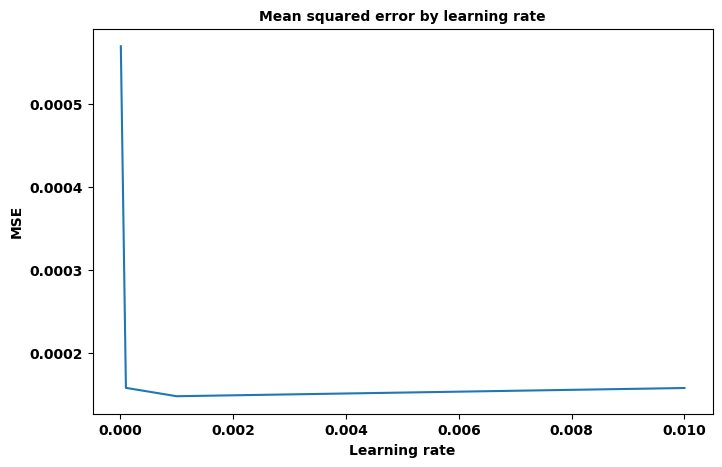

In [ ]:
title = 'Mean squared error by learning rate'

plt.figure(figsize = (8, 5))
plt.plot(df_metrics.index, df_metrics.mse)
plt.xlabel('Learning rate')
plt.ylabel('MSE')
plt.title(title, fontsize = 10)
plt.show()
plt.close()

In [ ]:
print(f'The best loss function is {best_loss_function}')
print(f'The best quantity for LSTM layers is {best_LSTM_layers}')
print(f'The best quantity for CNN layers is {best_CNN_layers}')
print(f'The best quantity for LSTM units is {best_LSTM_units}')
print(f'The best quantity for CNN filters is {best_CNN_filter}')
print(f'The best dropout rate is {best_dropout_rate}')
print(f'The best learning rate is {best_learning_rate}')

The best loss function is Hubber
The best quantity for LSTM layers is 3
The best quantity for CNN layers is 3
The best quantity for LSTM units is 16
The best quantity for CNN filters is 8
The best dropout rate is 0.5
The best learning rate is 0.001


<div id='model_performance' />

## Model performance
Now that we already have our final model, we will evaluate it by plotting the predicted volatility against the realized volatility in the test set. \
Moreover, we will calculate the Weighted Absolute Percentage Error (WAPE), and verify the histogram of the absolute percentage error per prediction.

In [ ]:
# First, train and test our model in the validation set to get the best number of epochs.

# So we don't need to run the hyper parametrization everytime.
# best_loss_function = 'MSE'
# best_CNN_filter = 8
# best_LSTM_units = 16
# best_CNN_layers = 3
# best_LSTM_layers = 3
# best_dropout_rate = 0.5
# best_learning_rate = 0.001

model = create_model_3(CNN_filter = best_CNN_filter, LSTM_units = best_LSTM_units, CNN_layers = best_CNN_layers, LSTM_layers = best_LSTM_layers, lr = best_learning_rate, loss = best_loss_function, dropout_rate = best_dropout_rate)
epochs = 200
model_history = model.fit(dataset_train, batch_size = 32
                                    , validation_data = dataset_val
                                    , epochs = epochs
                                    , verbose = 1
                                    , workers = -1
                                    , use_multiprocessing = True)

Epoch 1/200
12/12 [==============================] - 8s 131ms/step - loss: 0.0070 - mse: 0.0141 - val_loss: 3.8274e-04 - val_mse: 7.6547e-04
Epoch 2/200
12/12 [==============================] - 1s 45ms/step - loss: 0.0011 - mse: 0.0022 - val_loss: 3.6909e-04 - val_mse: 7.3817e-04
Epoch 3/200
12/12 [==============================] - 1s 45ms/step - loss: 4.7403e-04 - mse: 9.4806e-04 - val_loss: 3.0454e-04 - val_mse: 6.0908e-04
Epoch 4/200
12/12 [==============================] - 1s 45ms/step - loss: 2.7879e-04 - mse: 5.5758e-04 - val_loss: 2.6220e-04 - val_mse: 5.2441e-04
Epoch 5/200
12/12 [==============================] - 1s 48ms/step - loss: 2.1898e-04 - mse: 4.3796e-04 - val_loss: 2.1455e-04 - val_mse: 4.2909e-04
Epoch 6/200
12/12 [==============================] - 1s 45ms/step - loss: 1.8179e-04 - mse: 3.6358e-04 - val_loss: 1.8276e-04 - val_mse: 3.6552e-04
Epoch 7/200
12/12 [==============================] - 1s 44ms/step - loss: 1.5564e-04 - mse: 3.1128e-04 - val_loss: 1.6448e-04 -

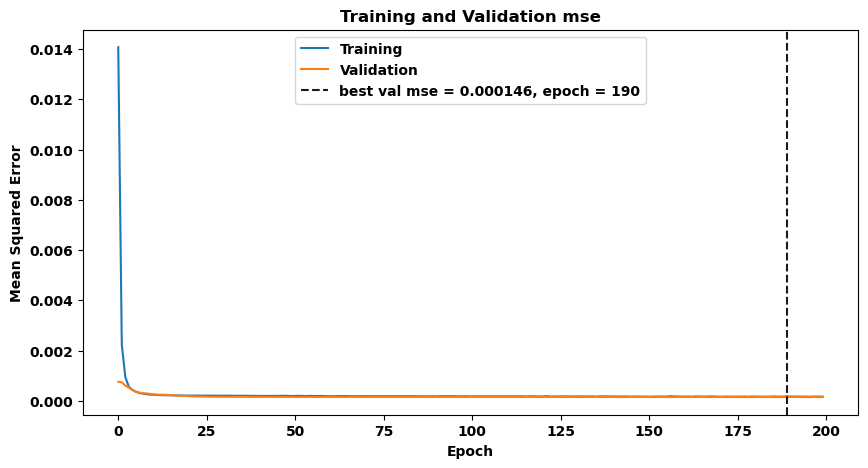

In [ ]:
# Plot the training and validation history
best_epoch, best_mse = plot_train_val_metric(model_history, 'mse', ylabel = 'Mean Squared Error')

Epoch 1/190
14/14 [==============================] - 8s 49ms/step - loss: 0.0026 - mse: 0.0052
Epoch 2/190
14/14 [==============================] - 1s 57ms/step - loss: 4.5721e-04 - mse: 9.1442e-04
Epoch 3/190
14/14 [==============================] - 1s 49ms/step - loss: 2.1246e-04 - mse: 4.2492e-04
Epoch 4/190
14/14 [==============================] - 1s 41ms/step - loss: 1.5356e-04 - mse: 3.0713e-04
Epoch 5/190
14/14 [==============================] - 1s 41ms/step - loss: 1.2979e-04 - mse: 2.5958e-04
Epoch 6/190
14/14 [==============================] - 1s 43ms/step - loss: 1.1991e-04 - mse: 2.3981e-04
Epoch 7/190
14/14 [==============================] - 1s 45ms/step - loss: 1.1455e-04 - mse: 2.2911e-04
Epoch 8/190
14/14 [==============================] - 1s 41ms/step - loss: 1.0896e-04 - mse: 2.1793e-04
Epoch 9/190
14/14 [==============================] - 1s 41ms/step - loss: 1.0742e-04 - mse: 2.1484e-04
Epoch 10/190
14/14 [==============================] - 1s 49ms/step - loss: 1.0659

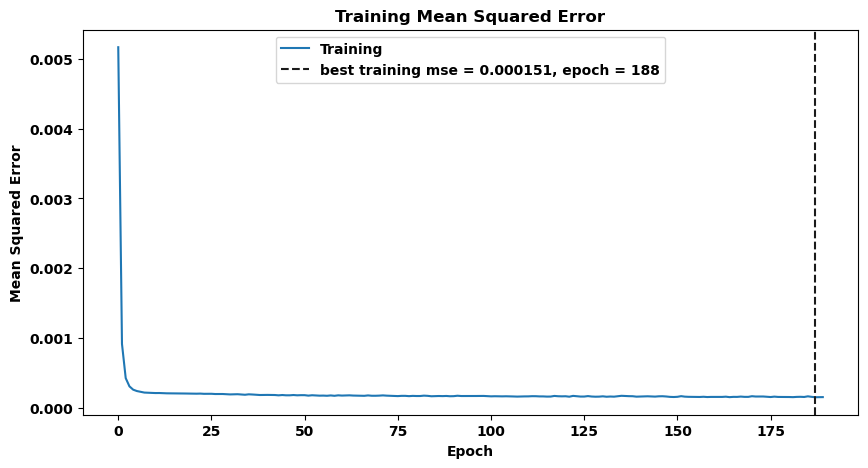

In [ ]:
time_start = time.time()
# Train the model with the full trainning dataset to verify the performance in our test dataset.
model = create_model_3(CNN_filter = best_CNN_filter, LSTM_units = best_LSTM_units, CNN_layers = best_CNN_layers, LSTM_layers = best_LSTM_layers, lr = best_learning_rate, loss = best_loss_function, dropout_rate = best_dropout_rate)
epochs = best_epoch
model_history = model.fit(dataset_train_full, batch_size = 32
                                    , epochs = epochs
                                    , verbose = 1
                                    , workers = -1
                                    , use_multiprocessing = True)

time_end = time.time()
final_model_time = time_end - time_start
print(f"It took {final_model_time/60:.2f} minutes for this notebook to run")
# Plot training history
plot_train_metric(model_history, 'mse', ylabel = 'Mean Squared Error')

First, let's compare the prediction of our model for only one week ahead. After, we will select just a few weeks and verify the predictions for the next 4 weeks.

With the hyper parametrization, we achieved practically the same validation error. \
However, we were able to diminish the overfit, and achieved a better test error. 

2/2 [==============================] - 0s 14ms/step - loss: 1.4657e-04 - mse: 2.9315e-04
Test mean squared error: 0.000293
------------------------------------------------------


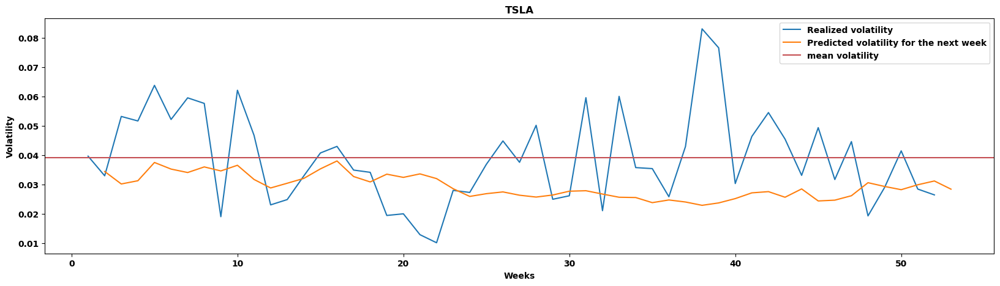

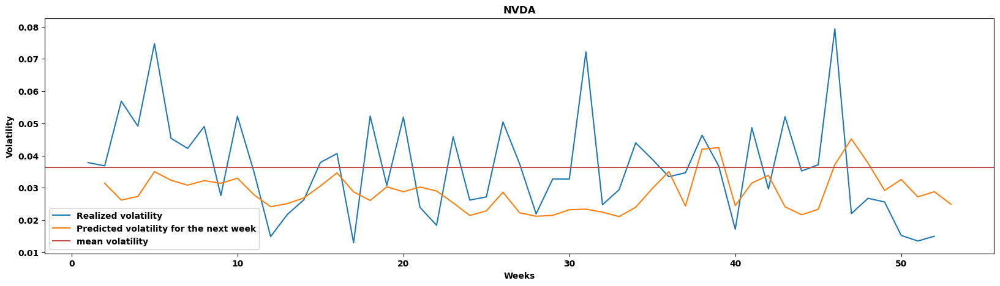

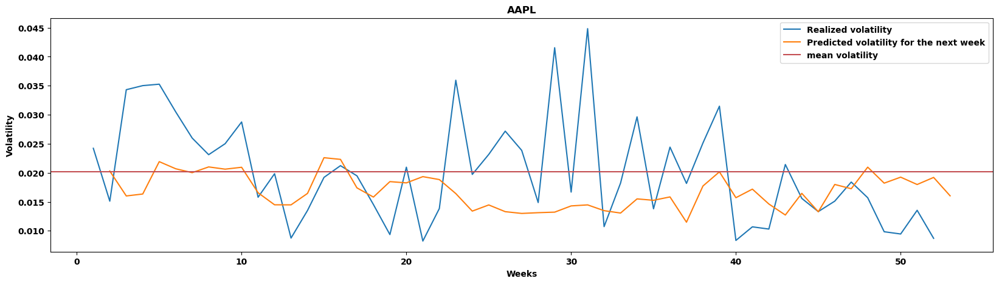

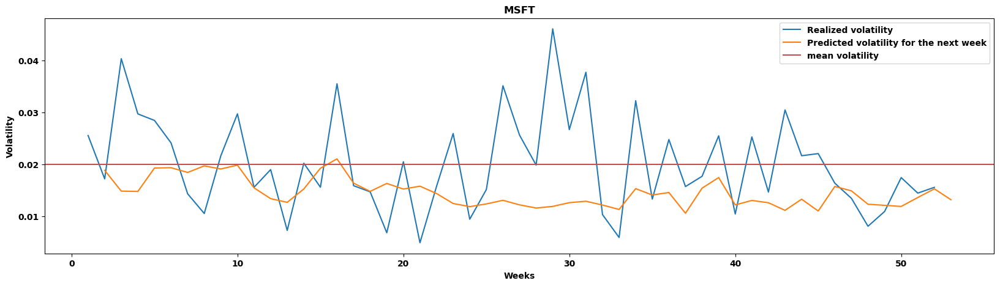

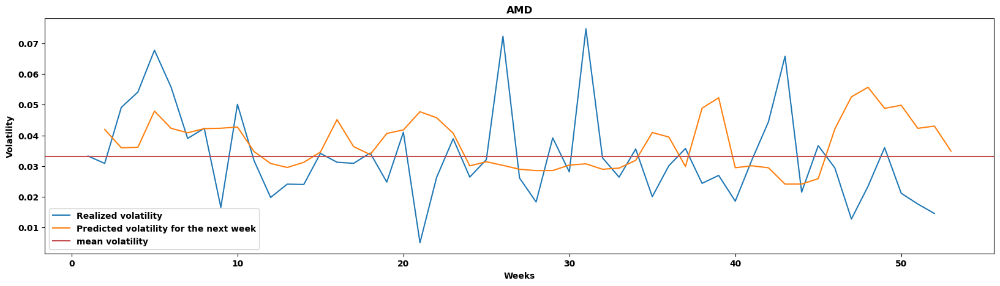

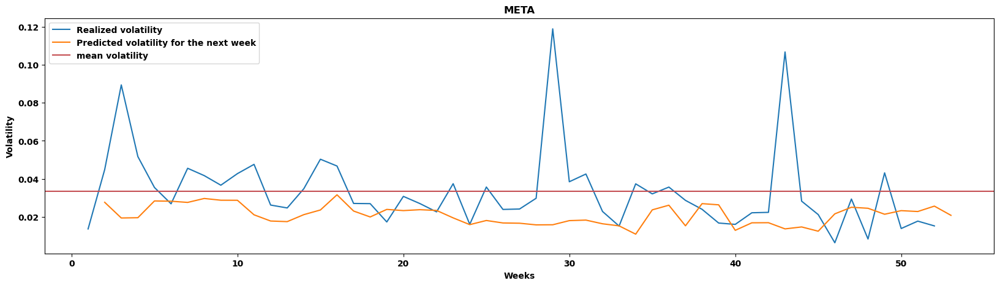

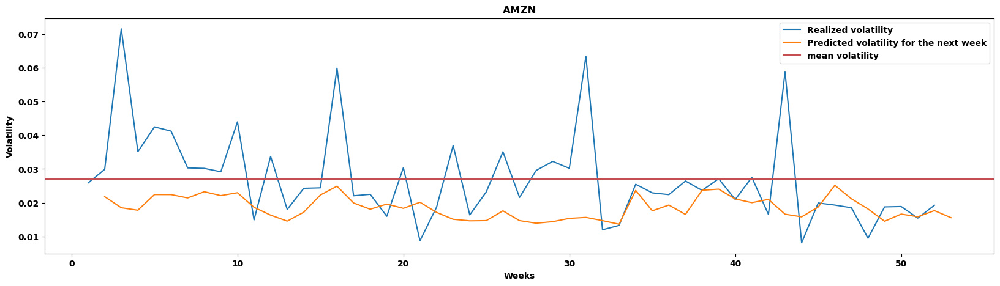

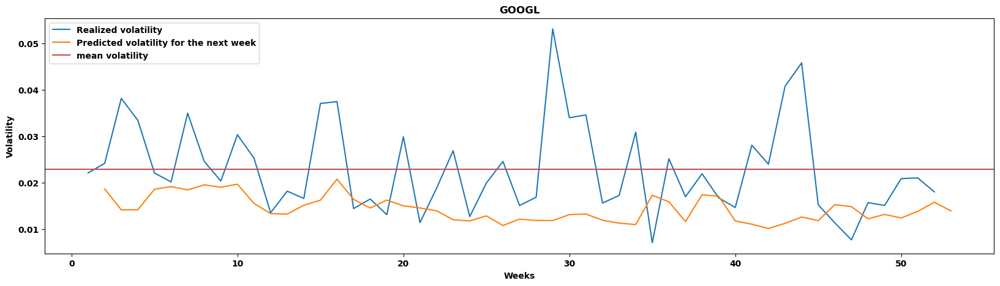

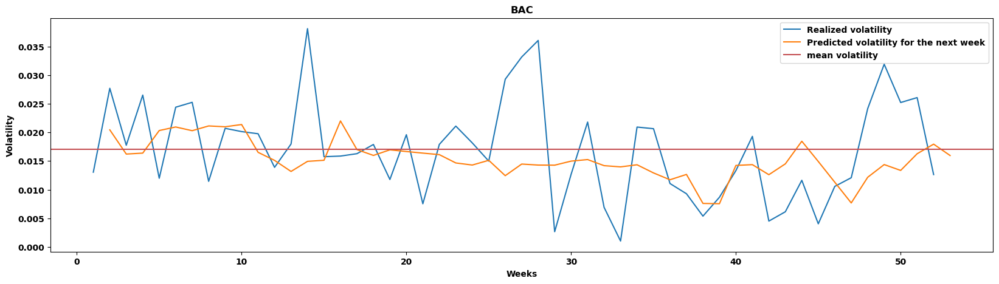

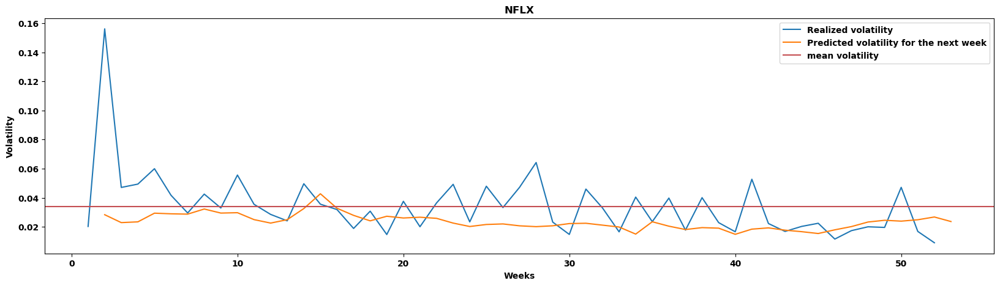

In [ ]:
# Predict in test and plot results
y_pred_test = model.predict(dataset_test)
mse_test = model.evaluate(dataset_test)
print('Test mean squared error:', round(mse_test[1], 6))
print('------------------------------------------------------')
df_pred_test_t1, df_pred_test_t2, df_pred_test_t3, df_pred_test_t4, dict_predictions = get_prediction_df(y_pred_test)
plot_predictions_for_t1(df_pred_test_t1)

Now, let's plot the prediction for all the 4 weeks that our model tried to predict. \
We did not plot the prediction for all the weeks because this would make our plots hard to visualize. \
Despite the lower test error, we can see that this model did not do a better job at predicting the volatility.


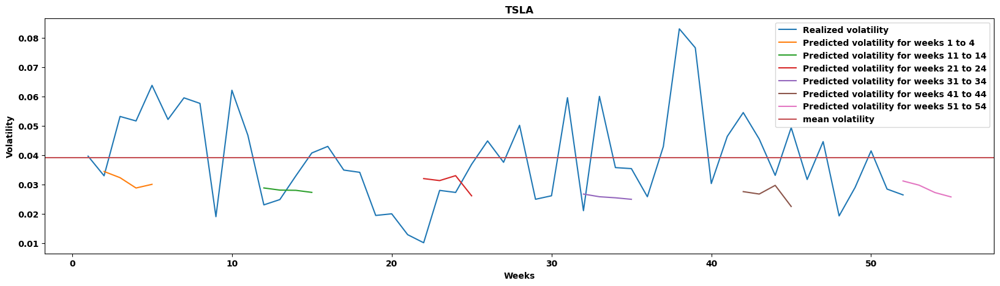

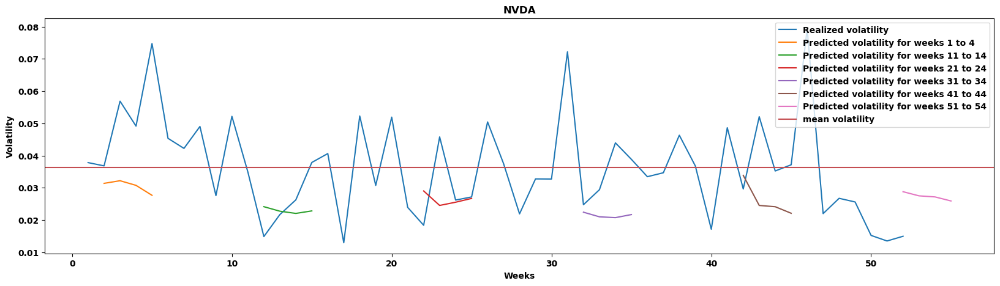

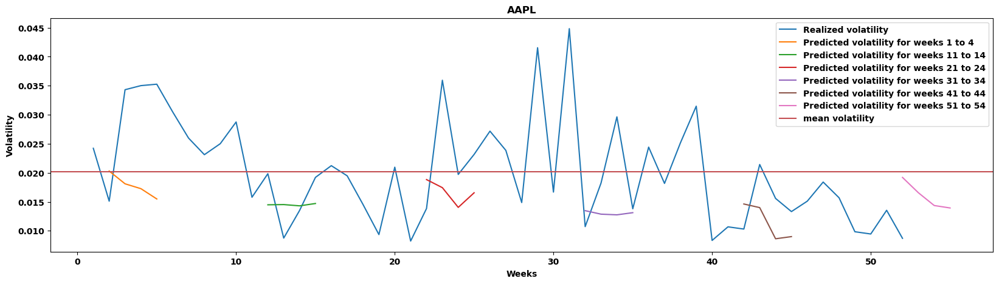

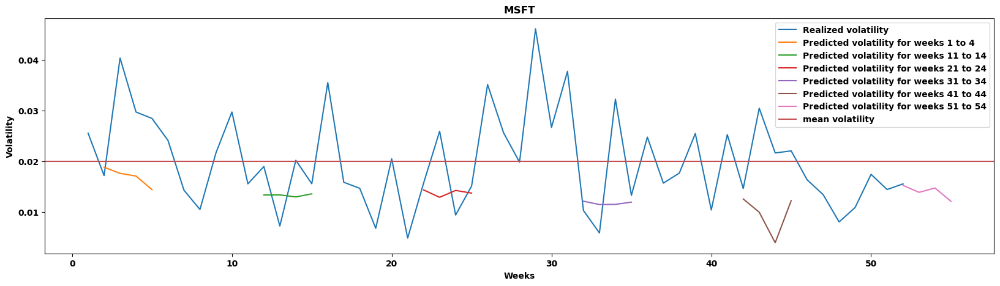

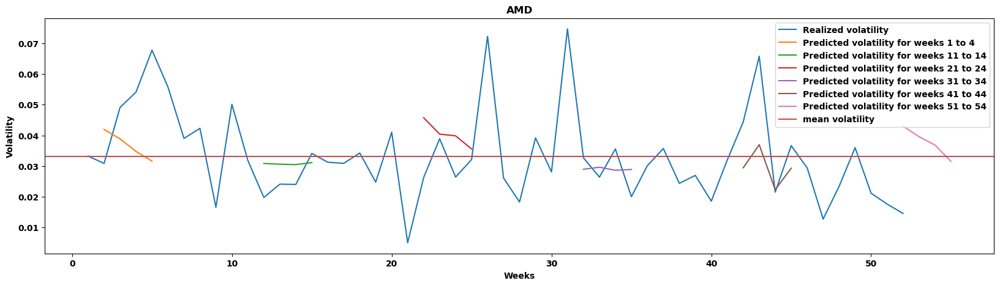

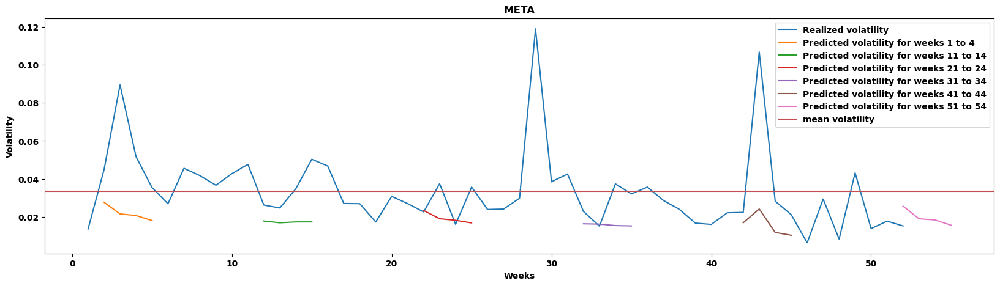

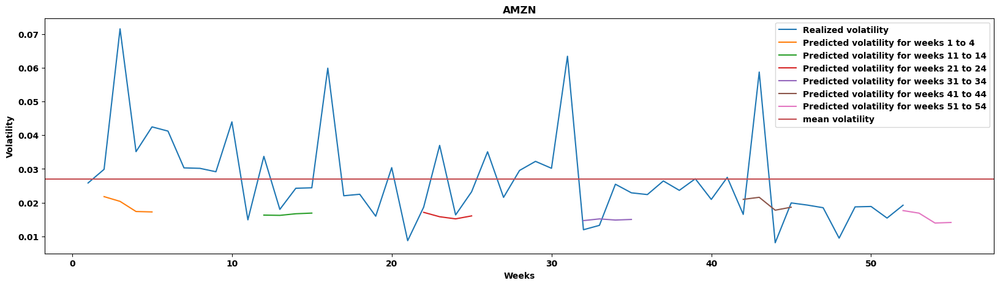

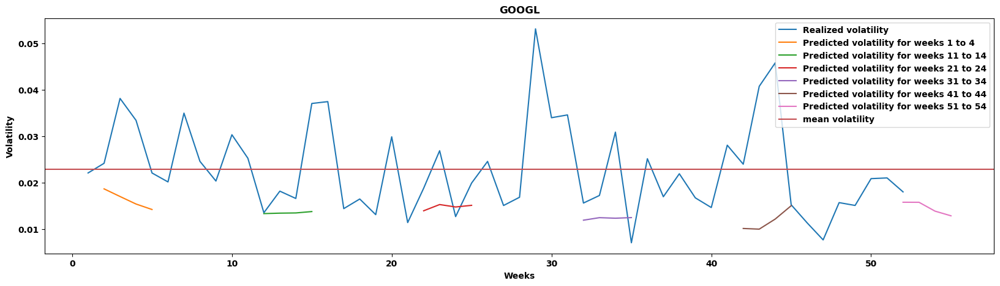

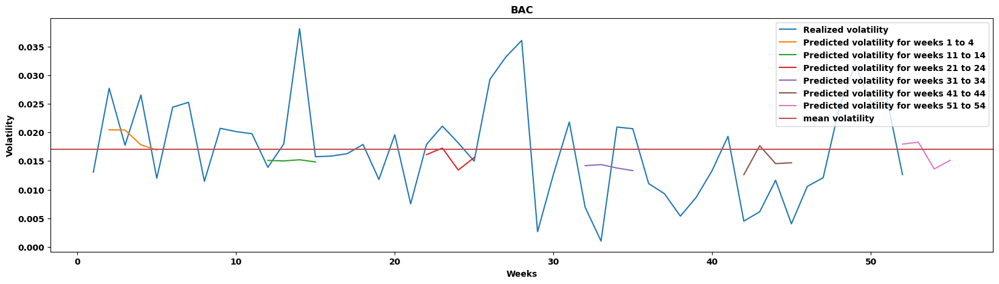

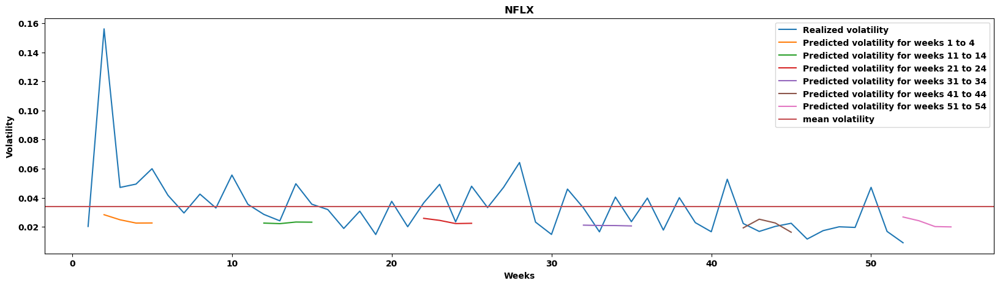

In [ ]:
plot_results(dict_predictions)

We got lower test errors, but our model doesn't look like to be usefull in real life situations. \
As a last performance analysis, we will verify the WAPE and the histogram of the average percentage error.

In [ ]:
# Calculate WAPE
df_test = df.iloc[-52:].copy()
df_test.reset_index(drop = True, inplace = True)

dict_abs_error_t1 = {}
dict_abs_error_t2 = {}
dict_abs_error_t3 = {}
dict_abs_error_t4 = {}
dict_realized_volatility_t1 = {}
dict_realized_volatility_t2 = {}
dict_realized_volatility_t3 = {}
dict_realized_volatility_t4 = {}
dict_absolute_percentage_error_t1 = {}
dict_absolute_percentage_error_t2 = {}
dict_absolute_percentage_error_t3 = {}
dict_absolute_percentage_error_t4 = {}
dict_absolute_percentage_error_total = {}
dict_wape_t1 = {}
dict_wape_t2 = {}
dict_wape_t3 = {}
dict_wape_t4 = {}
dict_WAPE_total = {}
for col in df_test.columns:
    dict_realized_volatility_t1[col] = df_test[col][1:].reset_index(drop = True)
    dict_realized_volatility_t2[col] = df_test[col][2:].reset_index(drop = True)
    dict_realized_volatility_t3[col] = df_test[col][3:].reset_index(drop = True)
    dict_realized_volatility_t4[col] = df_test[col][4:].reset_index(drop = True)
    
    dict_abs_error_t1[col] = abs(df_test[col][1:].reset_index(drop = True) - df_pred_test_t1[col][:-1].reset_index(drop = True))
    dict_abs_error_t2[col] = abs(df_test[col][2:].reset_index(drop = True) - df_pred_test_t1[col][:-2].reset_index(drop = True))
    dict_abs_error_t3[col] = abs(df_test[col][3:].reset_index(drop = True) - df_pred_test_t1[col][:-3].reset_index(drop = True))
    dict_abs_error_t4[col] = abs(df_test[col][4:].reset_index(drop = True) - df_pred_test_t1[col][:-4].reset_index(drop = True))
    
    # Absolute Percentage Error
    dict_absolute_percentage_error_t1[col] = dict_abs_error_t1[col] / df_pred_test_t1[col][:-1].reset_index(drop = True)
    dict_absolute_percentage_error_t2[col] = dict_abs_error_t2[col] / df_pred_test_t2[col][:-2].reset_index(drop = True)
    dict_absolute_percentage_error_t3[col] = dict_abs_error_t3[col] / df_pred_test_t3[col][:-3].reset_index(drop = True)
    dict_absolute_percentage_error_t4[col] = dict_abs_error_t4[col] / df_pred_test_t4[col][:-4].reset_index(drop = True)
    dict_absolute_percentage_error_total[col] = pd.concat([dict_absolute_percentage_error_t1[col]
                                                           , dict_absolute_percentage_error_t2[col]
                                                           , dict_absolute_percentage_error_t3[col]
                                                           , dict_absolute_percentage_error_t4[col]], ignore_index = True)
    
    # WAPE
    dict_wape_t1[col] = np.sum(dict_abs_error_t1[col]) / np.sum(dict_realized_volatility_t1[col])
    dict_wape_t2[col] = np.sum(dict_abs_error_t2[col]) / np.sum(dict_realized_volatility_t2[col])
    dict_wape_t3[col] = np.sum(dict_abs_error_t3[col]) / np.sum(dict_realized_volatility_t3[col])
    dict_wape_t4[col] = np.sum(dict_abs_error_t4[col]) / np.sum(dict_realized_volatility_t4[col])
    dict_WAPE_total[col] = ((np.sum(dict_abs_error_t1[col]) + np.sum(dict_abs_error_t2[col]) + np.sum(dict_abs_error_t3[col]) + np.sum(dict_abs_error_t4[col])) / 
                                (np.sum(dict_realized_volatility_t1[col]) + np.sum(dict_realized_volatility_t2[col]) + np.sum(dict_realized_volatility_t3[col]) + np.sum(dict_realized_volatility_t4[col])))

In [ ]:
df_wape = pd.DataFrame.from_dict(dict_wape_t1, orient = 'index').T
df_wape = pd.concat([df_wape, pd.DataFrame.from_dict(dict_wape_t2, orient='index').T], ignore_index = True)
df_wape = pd.concat([df_wape, pd.DataFrame.from_dict(dict_wape_t3, orient='index').T], ignore_index = True)
df_wape = pd.concat([df_wape, pd.DataFrame.from_dict(dict_wape_t4, orient='index').T], ignore_index = True)
df_wape = pd.concat([df_wape, pd.DataFrame.from_dict(dict_WAPE_total, orient='index').T], ignore_index = True)
df_wape = round(df_wape * 100, 2)
df_wape['Total'] = df_wape.mean(axis=1)
df_wape['Prediction week'] = ['week 1', 'week 2', 'week 3', 'week 4', 'total']
df_wape = df_wape[['Prediction week', 'TSLA', 'NVDA', 'AAPL', 'MSFT', 'AMD', 'META', 'AMZN', 'GOOGL', 'BAC', 'NFLX', 'Total']]
df_wape

,Prediction week,TSLA,NVDA,AAPL,MSFT,AMD,META,AMZN,GOOGL,BAC,NFLX,Total
0,week 1,37.16,36.99,37.57,39.22,42.02,46.74,38.66,42.05,38.84,41.86,40.111
1,week 2,37.80,40.75,38.45,42.87,42.11,46.92,40.49,41.95,40.17,37.52,40.903
2,week 3,38.42,40.48,39.00,43.56,44.65,46.23,39.50,42.26,42.68,38.71,41.549
3,week 4,39.21,39.43,38.54,41.47,40.99,46.10,40.79,40.88,42.29,37.99,40.769
4,total,38.13,39.39,38.38,41.76,42.45,46.51,39.84,41.80,40.95,39.11,40.832


Unfortunately, our WAPE is high for all the securities and all the prediction. \
For all the securities, the WAPE almost doesn't change when comparing the different lag for predictions. \
However, just analyzing the WAPE is not enough. We need to know if all the absolute percentage error are similar, or if we have some high values that may be affecting the WAPE calculation.

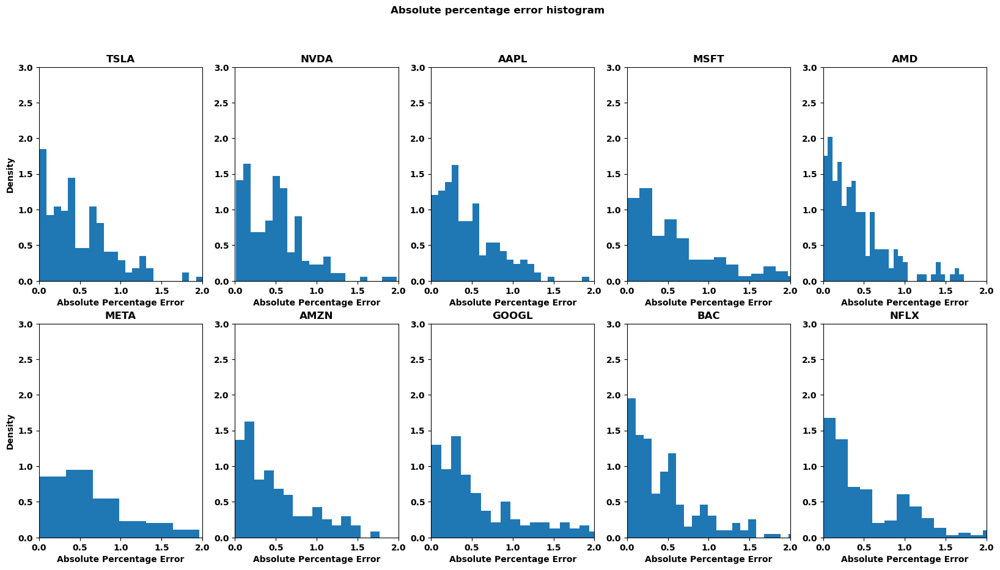

In [ ]:
# Absolute Percentage Error histogram
fig,axes = plt.subplots(2, 5, figsize = (20, 10))
plt.suptitle('Absolute percentage error histogram')
stocks = df.columns
for i, ax in enumerate(axes.flatten()):
    ax.hist(dict_absolute_percentage_error_total[stocks[i]], density = True, bins = 30)
    ax.set_xlim([0, 2])
    ax.set_ylim([0, 3])
    if (i == 0) or (i == 5):
        ax.set_ylabel('Density')
    ax.set_xlabel('Absolute Percentage Error')
    ax.set_title(f'{stocks[i]}');

plt.show()
plt.close()

Most of the errors are between 0 and 0.6. This is a high level of error for a financial application. \
We can say that this model worked a little better for AMD and Bank of America because the histogram of the absolute percentage error is more concentrated near zero. \
Nevertheless, even for these assets the average percentage error is too high.

<div id='Conclusion' />

## Results, conclusions, and future work

This project explored several model architectures to attempt to model weekly stock volatility. Starting from a baseline LSTM with 32 units, we tried to better extract temporal features by adding extra layers, such as convolutional layers with multiple kernel sizes, pooling layers, increasing the number of units on our LSTM models, and adding multiple LSTM layers. To further expand on this exploration, we attempted an entirely different architecture using transformers, hoping that the positional encodings would improve our forecasting performance.
Not only did we perform extensive testing on different types and quantities of layers, we also performed hyperparameter tuning, observing the effects of different epochs, learning rates, dropout rates, and filters on our convolutional layers, trying to find the ideal model configuration to obtain the best possible model performance.

The base model showed a best training MSE of 0.00018. Although it had a very low MSE, the plots showed that the model’s predicted volatility was incorrect and could not even capture the correct direction of the actual volatility. Although our MSE values were excellent, the plots comparing predicted volatility with actual volatility showed, once again, that predicted volatility was generally much lower than actual volatility and could not capture the correct direction of the actual volatility. Some improvement could be seen between the Model 1’s and Model 2’s plots of predicted vs actual volatility. Howerver, the model was still unable to predict the correct direction and value of actual volatility overall. Model 3 also showed a great MSE, but it showed worse performance in the actual plots than Model 1 and Model 2 and generally, predicteding much lower than the actual volatility. Even after thorough testing with hyperparameter tuning, the final architecture of Model 3, was also largely consistent with these results.

The overall conclusion of evaluating these models is that, despite the low errors found during training history, when plotting the model predictions compared to the stock volatility, the predictions did not closely resemble the actual market results. Whenever the model correctly predicted the general direction of the volatility, it consistently predicted less volatility than the observed historical data. However, it occasionally failed to predict the correct orientation of the volatility. These issues were consistent regardless of the different model architectures.
The fact that a model cannot predict neither the amount of volatility, nor whether it is positive or negative makes it unsuitable for real-life applications. As a result, future work can continue to tackle our problem statement through improvements in the choice of models and in inputs.

As the chosen architectures did not obtain satisfactory results, other models may be able to perform better. The ANN-GARCH (Kristjanpoller and Minutolo, 2015) combines the traditional generalized auto-regressive conditional heteroskedasticity (GARCH) model with Artificial Neural Networks that can model gold price volatility and is a potential way to address our problem statement.

Another approach is to improve the quality and quantity of the data used for modeling, such as by incorporating intraday stock data, which may enable our models to better capture temporal dependencies. We can also further incorporate more data, such as U.S. Treasury bond prices/returns, that may be able to explain some of the stock volatility.

With the data and data source we used in our project, further work can focus on specific moments of market-wide volatility, such as the COVID-19 period, and perform clustering analysis to find relationships in the volatility of the stocks of different companies. Understanding which clusters of companies and stocks react similarly in the presence of market shocks is interesting, both in terms of economic analysis and financial applications.



#### Sources

Kristjanpoller, W., & Minutolo, M. C. (2015). Gold price volatility: A forecasting approach using the Artificial Neural Network–GARCH model. Expert systems with applications, 42(20), 7245-7251.
Available on:
https://www.sciencedirect.com/science/article/abs/pii/S0957417415003000  \